In [52]:
from scipy import stats
from scipy.stats.stats import pearsonr
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.ticker import MaxNLocator
from matplotlib.lines import Line2D
from collections import OrderedDict
from datetime import datetime, date, timedelta
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import json
import numpy as np
import statistics
import collections
import random
import re
import math
import dateutil.parser

plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.weight"] = "semibold"
plt.rcParams["axes.labelweight"] = "semibold"
plt.rcParams["xtick.major.pad"] = "12"
plt.rcParams["ytick.major.pad"] = "12"

noOfExtraColumnsEnd = 9
totalNoOfExtraColumns = 12

cutoffFreq = 0.8
minSARSCoV2Reads = 1000
minPercentSamples = 0.02
minPercentSamplesStrict = 0.05
topPositions = 0.01
minTopPositions = 20

spineWidth = 4
tickLength = 12
tickWidth = 4
labelSize = 32
tickLabelSize = 32
axisOffset = 24

pltSize = 20
wedgeSize = 1.5
colorBarFactor = 2

bins = [0, 0.2, 0.4, 0.6, 0.8, 1]
dotSizeFactor = 500
cohortShiftFactor = 525
regionShiftFactor = 525

regions = {"China": ["China"], "India": ["CCMB", "Odisha", "MAX", "NCDC-MiSeq", "NCDC-NextSeq-20200527"], "USA": ["USA"]}
cohorts = {"East": ["Odisha"], "North": ["MAX", "NCDC-MiSeq", "NCDC-NextSeq-20200527"], "South": ["CCMB"]}
regionsAll = ["China", "Germany", "Malaysia", "United-Kingdom",  "USA"]
cohortsAll = ["CCMB", "Odisha", "MAX", "NCDC-MiSeq", "NCDC-NextSeq-20200527"]
regionsDetailed = {"China": ["China"], "Germany": ["Germany"], "Malaysia": ["Malaysia"], "United-Kingdom": ["United-Kingdom"], "India": ["CCMB", "Odisha", "MAX", "NCDC-MiSeq", "NCDC-NextSeq-20200527"], "USA": ["USA"]}
cohortsExtra = ["PRJNA655577", "Reinfection-PRJNA657893", "NCDC-RTCheck-20200506", "NCDC-Reinfection"]

colorPalette = ["#D90034", "#EB7423", "#F8B900", "#009B99", "#0080D3", "#00417B", "#8359A3", "#A26857", "#9A9A9A", "#6A6A6A"]
nucColors = ["#D90034", "#FC8888", "#FFC620", "#FFE084", "#009B99", "#9CDDDC", "#0080D3", "#A3D3F2", "#8359A3", "#E4BFFF", "#9A9A9A", "#E3E0E0"]
regionPalette = {"China": colorPalette[0], "India": colorPalette[5], "USA": colorPalette[2]}
cohortPalette = {"East": colorPalette[7], "North": colorPalette[3], "South": colorPalette[4]}

nucChange = ["CT", "GA", "AG", "TC", "CA", "GT", "AC", "TG", "AT", "TA", "CG", "GC"]
aaTypeOfChange = ["Upstream", "Downstream", "Intergenic", "Synonymous", "Missense", "Frameshift", "Start Lost", "Stop Lost", "Stop Gained", "Stop Retained"]

SARSCoV2Genes = {"5'UTR": [1,265], "ORF1ab": [266,21555], "S": [21563,25384], "ORF3a": [25393,26220], "E": [26245,26472], "M": [26523,27191], "ORF6": [27202,27387], "ORF7a": [27394,27759], "ORF7b": [27756,27887], "ORF8": [27894,28259], "N": [28274,29533], "ORF10": [29558,29674], "3'UTR": [29675,29903]}
SARSCoV2Proteins = {"nsp1": [266,805], "nsp2": [806,2719], "nsp3": [2720,8554], "nsp4": [8555,10054], "nsp5": [10055,10972], "nsp6": [10973,11842], "nsp7": [11843,12091], "nsp8": [12092,12685], "nsp9": [12686,13024], "nsp10": [13025,13441], "RdRp": [13442,16236], "nsp13": [16237,18039], "nsp14": [18040,19620], "nsp15": [19621,20658], "nsp16": [20659,21552], "S": [21563,25384], "3a": [25393,26220], "E": [26245,26472], "M": [26523,27191], "6": [27202,27387], "7a": [27394,27759], "7b": [27756,27887], "8": [27894,28259], "N": [28274,29533], "10": [29558,29674]}

stateMap = {
    "an": "Andaman & Nicobar Island",
    "ap": "Andhra Pradesh",
    "ar": "Arunanchal Pradesh",
    "as": "Assam",
    "br": "Bihar",
    "ch": "Chandigarh",
    "ct": "Chhattisgarh",
    "dn": "Dadara & Nagar Havelli",
    "dd": "Daman & Diu",
    "dl": "NCT of Delhi",
    "ga": "Goa",
    "gj": "Gujarat",
    "hr": "Haryana",
    "hp": "Himachal Pradesh",
    "jk": "Jammu & Kashmir",
    "jh": "Jharkhand",
    "ka": "Karnataka",
    "kl": "Kerala",
    "ld": "Lakshadweep",
    "mp": "Madhya Pradesh",
    "mh": "Maharashtra",
    "mn": "Manipur",
    "ml": "Meghalaya",
    "mz": "Mizoram",
    "nl": "Nagaland",
    "or": "Odisha",
    "py": "Puducherry",
    "pb": "Punjab",
    "rj": "Rajasthan",
    "sk": "Sikkim",
    "tn": "Tamil Nadu",
    "tg": "Telangana",
    "tr": "Tripura",
    "up": "Uttar Pradesh",
    "ut": "Uttarakhand",
    "wb": "West Bengal"
}


("Pearson's: ", (0.9886532005405063, 0.0))


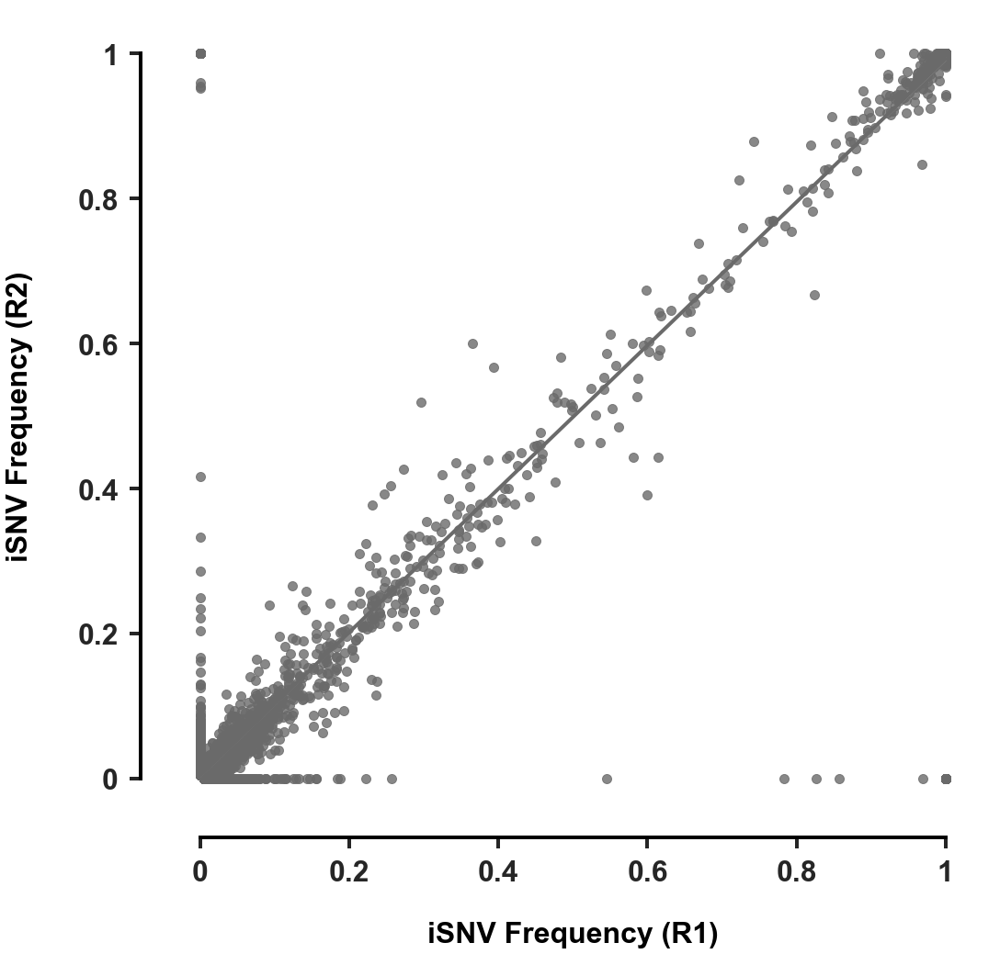

In [2]:
"""
Concordance in Replicates: PRJNA655577
"""

samplesByReplicate = {}
R1 = []
R2 = []

df = pd.read_csv("../output/REDItools2/cohorts/PRJNA655577/Frequencies.tsv", sep="\t")

with open("../data/datasets/metadata/SRA/20200818_PRJNA655577.json", "r") as data:
    data = json.load(data)
    
    for exp in data["EXPERIMENT_PACKAGE_SET"]["EXPERIMENT_PACKAGE"]:
        for tag in exp["SAMPLE"]["SAMPLE_ATTRIBUTES"]["SAMPLE_ATTRIBUTE"]:
            if tag["TAG"] == "Replicate":
                replicate = int(tag["VALUE"].split("Biological Replicate ")[1])
                if replicate in range(1,501):
                    if replicate not in samplesByReplicate:
                        samplesByReplicate[replicate] = []
                    samplesByReplicate[replicate].append(exp["EXPERIMENT"]["@accession"])

for i in samplesByReplicate:
    dfTemp = pd.DataFrame(columns=[samplesByReplicate[i][0], samplesByReplicate[i][1]], dtype=object)

    if samplesByReplicate[i][0] in df:
        dfTemp[samplesByReplicate[i][0]] = df[samplesByReplicate[i][0]]
    if samplesByReplicate[i][1] in df:
        dfTemp[samplesByReplicate[i][1]] = df[samplesByReplicate[i][1]]
    
    dfTemp = dfTemp.dropna(how="all").fillna(0)

    R1.extend(list(dfTemp[samplesByReplicate[i][0]]))
    R2.extend(list(dfTemp[samplesByReplicate[i][1]]))

dfReplicates = pd.DataFrame(list(zip(R1, R2)), columns=["R1", "R2"]) 
print("Pearson's: ", pearsonr(R1,R2))

fig, ax = plt.subplots(figsize=(16,16))
sns.set_style("white", {"xtick.bottom": True, "ytick.left": True})

sns.regplot(ax=ax, x="R1", y="R2", data=dfReplicates, scatter_kws={"s": 100, "color": colorPalette[-1]}, line_kws={"lw": 4, "color": colorPalette[-1]})

ax.set_xlabel("\niSNV Frequency (R1)", fontsize=labelSize)
ax.set_ylabel("iSNV Frequency (R2)\n", fontsize=labelSize)
ax.get_yaxis().set_label_coords(-0.12,0.5)

for axis in ["bottom","left"]:
    ax.spines[axis].set_linewidth(spineWidth)
ax.tick_params(labelsize=tickLabelSize, length=tickLength, width=tickWidth)
sns.despine(trim=True, offset=axisOffset)

ax.set_xticklabels([0, 0.2, 0.4, 0.6, 0.8, 1])
ax.set_yticklabels([0, 0.2, 0.4, 0.6, 0.8, 1])

plt.show()


In [6]:
"""
All edited sites with sample frequencies (<=0.8)
"""

dfAll = pd.DataFrame()

for region in regionsAll:
    dfFreq = pd.read_csv("../output/REDItools2/regions/" + region + "/Frequencies.tsv", sep="\t")
    dfFreq = dfFreq.set_index(["Position", "Reference", "Sub"])
    dfFreq = dfFreq.iloc[:,:(len(dfFreq.columns) - noOfExtraColumnsEnd)]
    dfFreq = dfFreq[dfFreq <= cutoffFreq]
    
    if dfAll.empty:
        dfAll = dfFreq
    else:
        dfAll = pd.concat([dfAll, dfFreq], axis=1)
        
for cohort in cohortsAll:
    dfFreq = pd.read_csv("../output/REDItools2/cohorts/" + cohort + "/Frequencies.tsv", sep="\t")
    dfFreq = dfFreq.set_index(["Position", "Reference", "Sub"])
    dfFreq = dfFreq.iloc[:,:(len(dfFreq.columns) - noOfExtraColumnsEnd)]
    dfFreq = dfFreq[dfFreq <= cutoffFreq]
    
    if dfAll.empty:
        dfAll = dfFreq
    else:
        dfAll = pd.concat([dfAll, dfFreq], axis=1)

dfAll = dfAll.dropna(axis=0, how="all")
dfAll = dfAll.dropna(axis=1, how="all")

dfAll.to_csv("../output/REDItools2/All_Sites_with_Sample_Frequency.tsv", sep="\t", index=True)
    

In [7]:
"""
All edited sites annotated (<=0.8)
"""

dfAnn = pd.read_csv("../output/REDItools2/All_Sites_with_Sample_Frequency.tsv", sep="\t").set_index(["Position", "Reference", "Sub"])
dfAnn["No. of samples found edited"] = dfAnn.count(axis=1)
dfAnn = dfAnn.loc[:,["No. of samples found edited"]]

dfGISAID = pd.read_csv("../data/datasets/GISAID_20200930.tsv", sep="\t")
variationAnnotation = pd.read_excel("../data/datasets/BIGD_Variation_Annotation.xlsx", sheet_name="Sheet1")

for index, row in dfAnn.iterrows():
    for col in dfGISAID[(dfGISAID["Pos"] == index[0])].columns:
        if col != "Pos":
            dfAnn.loc[index, col] = dfGISAID[(dfGISAID["Pos"] == index[0])][col].values[0]
            
    if len(variationAnnotation[variationAnnotation["Genome position"] == index[0]]) != 0:
        dfAnn.loc[index, "Gene"] = variationAnnotation.loc[variationAnnotation["Genome position"] == index[0], "Gene name/Regions"].values[0]
        try:
            varCodons = None
            for i in variationAnnotation.loc[variationAnnotation["Genome position"] == index[0], "Gene.Position.Codons"].values[0].split("; "):
                if varCodons:
                    varCodons = varCodons + "; " + i.split(":")[1]
                else:
                    varCodons = i.split(":")[1] 
            dfAnn.loc[index, "Variation Codons"] = varCodons
        except:
            pass
        dfAnn.loc[index, "Amino acids change"] = variationAnnotation.loc[variationAnnotation["Genome position"] == index[0], "Protein.Position.Amino acids change"].values[0]
        dfAnn.loc[index, "Annotation Type"] = variationAnnotation.loc[variationAnnotation["Genome position"] == index[0], "Annotation Type"].values[0]
        dfAnn.loc[index, "Calculated variant consequences"] = variationAnnotation.loc[variationAnnotation["Genome position"] == index[0], "Impact Ensembl Variation - Calculated variant consequences\">"].values[0]

dfAnn = dfAnn.sort_values(by="No. of samples found edited", ascending=False)
dfAnn.to_csv("../output/REDItools2/All_Sites_Annotated.tsv", sep="\t", index=True)


Cohort, Total Samples, Edited Samples, Total Edited Events
('China', 128, 119, 2890)
('Germany', 17, 13, 115)
('Malaysia', 4, 4, 114)
('United-Kingdom', 62, 17, 29)


/Users/pxthxk/miniconda3/envs/COVID-19/lib/python2.7/site-packages/pandas/core/ops.py:1649: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  result = method(y)


('USA', 463, 384, 12889)
('CCMB', 166, 162, 26708)
('Odisha', 246, 197, 20018)
('MAX', 42, 42, 23374)
('NCDC-MiSeq', 9, 5, 77)
('NCDC-NextSeq-20200527', 23, 15, 381)
----
('Total Samples:', 1160)
('Edited Samples:', 958)
('Total Edited Events:', 86595)
('Total Edited Positions:', 23516)
('Total Edited Positions:', 18216)
('Polymorphic Positions:', 5300)
('Mean Edited Events per Sample:', 90.39144050104385)
('Median Edited Events per Sample:', 19.0)
('Mean Editing Frequency:', 0.03486962295744558)
('Median Editing Frequency:', 0.016)
----
Extra cohorts
('PRJNA655577', 955, 867, 14733)
('Reinfection-PRJNA657893', 2, 2, 82)
('NCDC-RTCheck-20200506', 8, 8, 96)
('NCDC-Reinfection', 3, 3, 94)


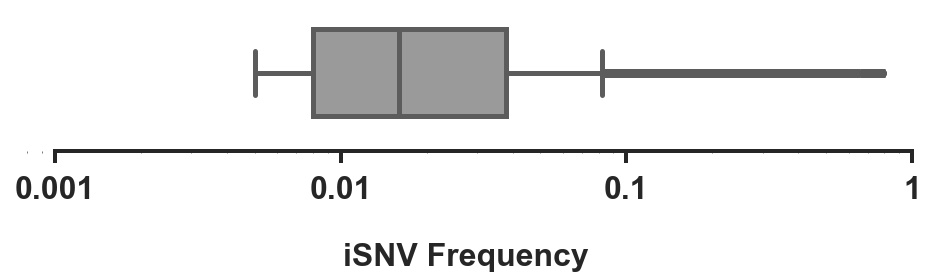

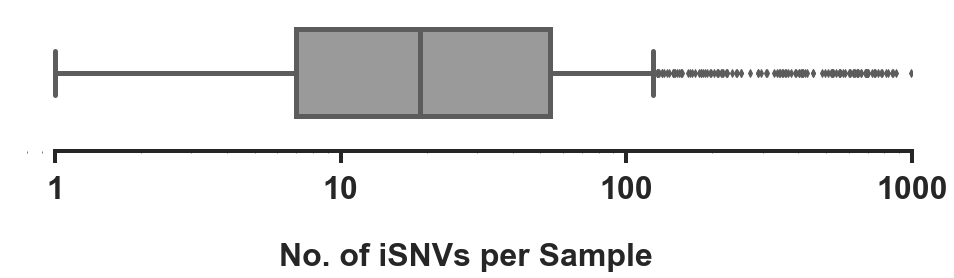

In [3]:
"""
Sample Distribution and Editing Events (<=0.8)
"""

totalSamples = 0
editedSamples = 0
editedEvents = []

dfAll = pd.read_csv("../output/REDItools2/All_Sites_with_Sample_Frequency.tsv", sep="\t").set_index(["Position", "Reference", "Sub"])

print("Cohort, Total Samples, Edited Samples, Total Edited Events")
for region in regionsAll:
    dfStats = pd.read_csv("../data/samples/regions/" + region + "/Stats.tsv", sep="\t")
    dfFreq = dfAll.loc[:,dfAll.columns.isin(list(dfStats["Sample"].apply(str)))]

    print(region, len(dfStats[(dfStats["BWA-MEM SARS-CoV-2 Mapped Reads"] != "-") & (dfStats["BWA-MEM SARS-CoV-2 Mapped Reads"] >= minSARSCoV2Reads)]), len(dfFreq.columns), dfFreq.notna().sum().sum())
    
    totalSamples = totalSamples + len(dfStats[(dfStats["BWA-MEM SARS-CoV-2 Mapped Reads"] != "-") & (dfStats["BWA-MEM SARS-CoV-2 Mapped Reads"] >= minSARSCoV2Reads)])
    editedSamples = editedSamples + len(dfFreq.columns)
    editedEvents.extend(list(dfFreq.notna().sum()))

for cohort in cohortsAll:
    dfStats = pd.read_csv("../data/samples/cohorts/" + cohort + "/Stats.tsv", sep="\t")
    dfFreq = dfAll.loc[:,dfAll.columns.isin(list(dfStats["Sample"].apply(str)))]
    
    print(cohort, len(dfStats[(dfStats["BWA-MEM SARS-CoV-2 Mapped Reads"] != "-") & (dfStats["BWA-MEM SARS-CoV-2 Mapped Reads"] >= minSARSCoV2Reads)]), len(dfFreq.columns), dfFreq.notna().sum().sum())
    
    totalSamples = totalSamples + len(dfStats[(dfStats["BWA-MEM SARS-CoV-2 Mapped Reads"] != "-") & (dfStats["BWA-MEM SARS-CoV-2 Mapped Reads"] >= minSARSCoV2Reads)])
    editedSamples = editedSamples + len(dfFreq.columns)
    editedEvents.extend(list(dfFreq.notna().sum()))

print("----")
print("Total Samples:", totalSamples)
print("Edited Samples:", editedSamples)
print("Total Edited Events:", sum(editedEvents))
print("Total Edited Positions:", len(dfAll.reset_index()["Position"]))
print("Total Edited Positions:", len(dfAll.reset_index()["Position"].unique()))
print("Polymorphic Positions:", len(dfAll.reset_index()["Position"][dfAll.reset_index()["Position"].duplicated()]))
print("Mean Edited Events per Sample:", statistics.mean(editedEvents))
print("Median Edited Events per Sample:", statistics.median(editedEvents))
print("Mean Editing Frequency:", statistics.mean(dfAll.fillna(0).values.ravel()[dfAll.fillna(0).values.ravel() != 0.0]))
print("Median Editing Frequency:", statistics.median(dfAll.fillna(0).values.ravel()[dfAll.fillna(0).values.ravel() != 0.0]))
print("----")

print("Extra cohorts")
for cohort in cohortsExtra:
    dfStats = pd.read_csv("../data/samples/cohorts/" + cohort + "/Stats.tsv", sep="\t")
    dfFreq = pd.read_csv("../output/REDItools2/cohorts/" + cohort + "/Frequencies.tsv", sep="\t")
    dfFreq = dfFreq.set_index(["Position", "Reference", "Sub"])
    dfFreq = dfFreq.iloc[:,:(len(dfFreq.columns) - noOfExtraColumnsEnd)]
    dfFreq = dfFreq[dfFreq <= cutoffFreq]
    dfFreq = dfFreq.dropna(axis=0, how="all")
    dfFreq = dfFreq.dropna(axis=1, how="all")
    
    print(cohort, len(dfStats[(dfStats["BWA-MEM SARS-CoV-2 Mapped Reads"] != "-") & (dfStats["BWA-MEM SARS-CoV-2 Mapped Reads"] >= minSARSCoV2Reads)]), len(dfFreq.columns), dfFreq.notna().sum().sum())

dfEventsFreq = pd.DataFrame()
dfEventsFreq["Event Frequency"] = dfAll.fillna(0).values.ravel()[dfAll.fillna(0).values.ravel() != 0.0]

fig, ax = plt.subplots(figsize=(16,2))
sns.boxplot(ax=ax, x="Event Frequency", data=dfEventsFreq, palette=[colorPalette[-2]], linewidth=5, fliersize=5)

ax.set_xscale("log")
ax.set_xlabel("\niSNV Frequency", fontsize=labelSize)
ax.set_ylabel("")

ax.set_xlim([0.00075,1])
ax.set_xticks([0.001,0.01,0.1,1])
ax.set_xticklabels(["0.001","0.01","0.1","1"])

for axis in ["bottom","left"]:
    ax.spines[axis].set_linewidth(spineWidth)
ax.tick_params(labelsize=tickLabelSize, length=tickLength, width=tickWidth)
sns.despine(trim=True, offset=axisOffset)

dfEventsPerSamples = pd.DataFrame()
dfEventsPerSamples["Events per Sample"] = editedEvents

fig, ax = plt.subplots(figsize=(16,2))
sns.boxplot(ax=ax, x="Events per Sample", data=dfEventsPerSamples, palette=[colorPalette[-2]], linewidth=5, fliersize=5)

ax.set_xscale("log")
ax.set_xlabel("\nNo. of iSNVs per Sample", fontsize=labelSize)
ax.set_ylabel("")

ax.set_xlim([0.75,1000])
ax.set_xticks([1,10,100,1000])
ax.set_xticklabels(["1","10","100","1000"])

for axis in ["bottom","left"]:
    ax.spines[axis].set_linewidth(spineWidth)
ax.tick_params(labelsize=tickLabelSize, length=tickLength, width=tickWidth)
sns.despine(trim=True, offset=axisOffset)

plt.show()


("Pearson's: ", (0.2594091476439454, 3.386415647800166e-16))


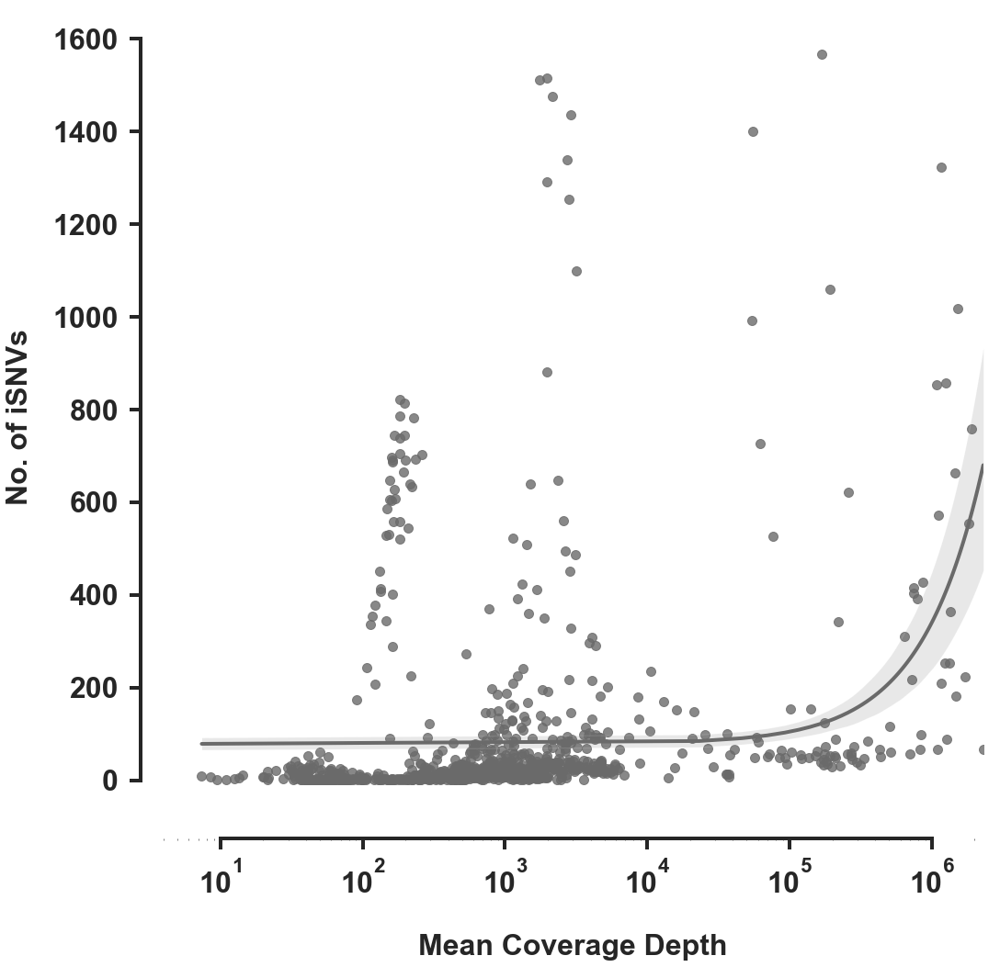

In [4]:
"""
Coverage vs No. of Editing Sites (<=0.8)
"""

coverage = []
noOfEdits = []

dfAll = pd.read_csv("../output/REDItools2/All_Sites_with_Sample_Frequency.tsv", sep="\t").set_index(["Position", "Reference", "Sub"])

for region in regionsAll:
    dfStats = pd.read_csv("../data/samples/regions/" + region + "/Stats.tsv", sep="\t")
    dfFreq = dfAll.loc[:,dfAll.columns.isin(list(dfStats["Sample"].apply(str)))]
    
    for sample in dfFreq.columns:
        coverage.append(float("".join(dfStats.loc[dfStats["Sample"] == sample, "Mean of Coverage Depth"].values[0].strip("X").split(","))))
        noOfEdits.append(dfFreq[sample].notna().sum().sum())

for cohort in cohortsAll:
    dfStats = pd.read_csv("../data/samples/cohorts/" + cohort + "/Stats.tsv", sep="\t")
    dfFreq = dfAll.loc[:,dfAll.columns.isin(list(dfStats["Sample"].apply(str)))]
    
    for sample in dfFreq.columns:
        coverage.append(float("".join(dfStats.loc[dfStats["Sample"].astype(str) == sample, "Mean of Coverage Depth"].values[0].strip("X").split(","))))
        noOfEdits.append(dfFreq[sample].notna().sum().sum())

df = pd.DataFrame(list(zip(coverage, noOfEdits)), columns=["Coverage", "No. Of Editing Sites"])
print("Pearson's: ", pearsonr(coverage, noOfEdits))

fig, ax = plt.subplots(figsize=(16,16))
sns.set_style("white", {"xtick.bottom": True, "ytick.left": True})

sns.regplot(ax=ax, x="Coverage", y="No. Of Editing Sites", data=df, scatter_kws={"s": 100, "color": colorPalette[-1]}, line_kws={"lw": 4, "color": colorPalette[-1]})

# ax.set_xlim([0, 250000])
ax.set_xscale("log")
ax.set_xlabel("\nMean Coverage Depth", fontsize=labelSize)
ax.set_ylabel("No. of iSNVs\n", fontsize=labelSize)
ax.get_yaxis().set_label_coords(-0.12,0.5)

for axis in ["bottom","left"]:
    ax.spines[axis].set_linewidth(spineWidth)
ax.tick_params(labelsize=tickLabelSize, length=tickLength, width=tickWidth)
sns.despine(trim=True, offset=axisOffset)

plt.show()


   Sub Count
0   AC   615
1   GT  3730
2   AG  5449
3   CA  2441
4   CG   188
5   GC   663
6   AT  1868
7   GA  1334
8   TG   566
9   TA   499
10  TC  3088
11  CT  3075
('Medians: ', [('CT', 0.014), ('GA', 0.012), ('AG', 0.009), ('TC', 0.011), ('CA', 0.031), ('GT', 0.03), ('AC', 0.012), ('TG', 0.011), ('AT', 0.012), ('TA', 0.012), ('CG', 0.014), ('GC', 0.012)])
('Medians: ', [('CT', 5.0), ('GA', 3.0), ('AG', 3.0), ('TC', 3.5), ('CA', 2.0), ('GT', 3.0), ('AC', 2.0), ('TG', 1.0), ('AT', 2.0), ('TA', 2.0), ('CG', 1.0), ('GC', 2.0)])


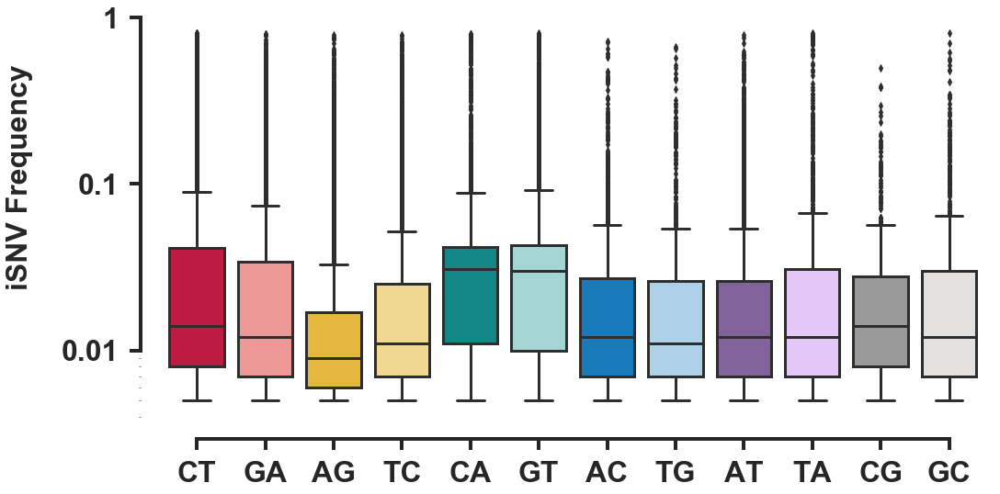

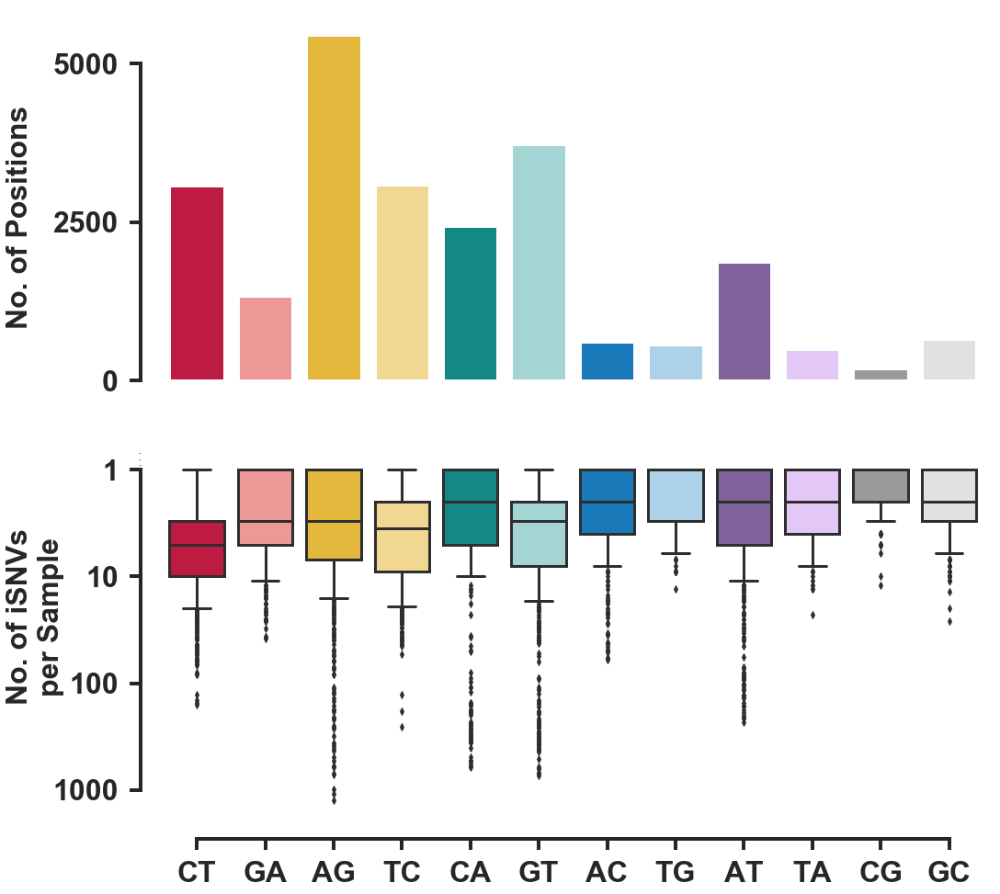

In [13]:
"""
Nucleotide Change in all Edited Sites (<=0.8)
Nucleotide Change in All Samples vs Editing Frequency (<=0.8)
Nucleotide Change per Sample (<=0.8)
"""

dfAll = pd.read_csv("../output/REDItools2/All_Sites_with_Sample_Frequency.tsv", sep="\t").set_index(["Position", "Reference", "Sub"])

nucFreq = {}
nucCount = {}

for index, row in dfAll.iterrows():
    sub = index[2]
    if sub not in nucFreq:
        nucFreq[sub] = []
    nucFreq[sub].extend(list(row[row.notna()].values))
        
dfCount = pd.DataFrame(columns=["Sub", "Count"], dtype=object)
i = 0

for j in collections.Counter(list(dfAll[dfAll.count(axis=1) != 0].index.get_level_values("Sub"))):
    dfCount.loc[i] = [j, collections.Counter(list(dfAll[dfAll.count(axis=1) != 0].index.get_level_values("Sub")))[j]]
    i = i + 1
        
print(dfCount)

dfFreq = pd.DataFrame(columns=["Sub", "Freq"], dtype=object)
i = 0

for j in nucFreq:
    for k in nucFreq[j]:
        dfFreq.loc[i] = [j, k]
        i = i + 1

print("Medians: ", [(nuc, round(dfFreq[dfFreq["Sub"] == nuc].median()["Freq"], 3)) for nuc in nucChange])

for col in dfAll.columns:
    nucSample = collections.Counter([row[2] for row in dfAll[col][dfAll[col].notna()].index])
    for sub in nucSample:
        if sub not in nucCount:
            nucCount[sub] = []
        nucCount[sub].append(nucSample[sub])

dfCountPerSample = pd.DataFrame(columns=["Sub", "Count"], dtype=float)
i = 0

for j in nucCount:
    for k in nucCount[j]:
        dfCountPerSample.loc[i] = [j, k]
        i = i + 1

print("Medians: ", [(nuc, round(dfCountPerSample[dfCountPerSample["Sub"] == nuc].median()["Count"], 3)) for nuc in nucChange])

fig, ax = plt.subplots(figsize=(16,8))
sns.boxplot(ax=ax, x="Sub", y="Freq", data=dfFreq, order=nucChange, palette=sns.color_palette(nucColors), linewidth=3)

ax.set_xlabel("")
ax.set_ylabel("iSNV Frequency\n", fontsize=labelSize)
ax.get_yaxis().set_label_coords(-0.12,0.6)

ax.set_yscale("log")
ax.set_ylim([0.004,1])
ax.set_yticks([0.01,0.1,1])
ax.set_yticklabels(["0.01","0.1","1"])

for axis in ["bottom","left"]:
    ax.spines[axis].set_linewidth(spineWidth)
ax.tick_params(labelsize=tickLabelSize, length=tickLength, width=tickWidth)
sns.despine(trim=True, offset=axisOffset)

fig, ax = plt.subplots(2, 1, figsize=(16,16), sharex=True)
sns.barplot(ax=ax[0], x="Sub", y="Count", data=dfCount, order=nucChange, palette=sns.color_palette(nucColors), linewidth=3)

ax[0].set_xlabel("")
ax[0].set_ylabel("No. of Positions\n", fontsize=labelSize)
ax[0].get_yaxis().set_label_coords(-0.12,0.45)

ax[0].set_yticks([0,2500,5000])

ax[0].spines["left"].set_linewidth(spineWidth)
ax[0].tick_params(bottom="off", labelsize=tickLabelSize, length=tickLength, width=tickWidth)
sns.despine(bottom=True, trim=True, offset=axisOffset, ax=ax[0])

sns.boxplot(ax=ax[1], x="Sub", y="Count", data=dfCountPerSample, order=nucChange, palette=sns.color_palette(nucColors), linewidth=3)

ax[1].set_xlabel("", fontsize=labelSize)
ax[1].set_ylabel("No. of iSNVs\nper Sample", fontsize=labelSize)
ax[1].get_yaxis().set_label_coords(-0.12,0.55)

ax[1].set_yscale("log")
ax[1].set_yticks([1,10,100,1000])
ax[1].set_yticklabels(["1","10","100","1000"])

for axis in ["bottom","left"]:
    ax[1].spines[axis].set_linewidth(spineWidth)
ax[1].tick_params(labelsize=tickLabelSize, length=tickLength, width=tickWidth)
sns.despine(trim=True, offset=axisOffset, ax=ax[1])

ax[1].invert_yaxis()

plt.show()


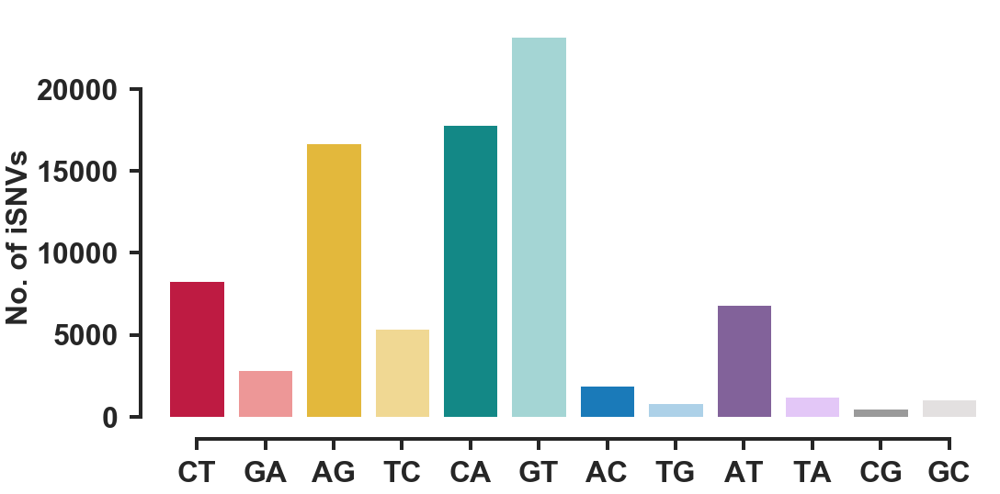

In [14]:
"""
Nucleotide Change Distribution in All Samples (<=0.8)
"""

nucFreq = {}

dfAll = pd.read_csv("../output/REDItools2/All_Sites_with_Sample_Frequency.tsv", sep="\t").set_index(["Position", "Reference", "Sub"])

for index, row in dfAll.iterrows():
    sub = index[2]
    if sub not in nucFreq:
        nucFreq[sub] = []
    nucFreq[sub].extend(list(row[row.notna()].values))

dfFreq = pd.DataFrame(columns=["Sub", "Freq"], dtype=object)
i = 0

for j in nucFreq:
    for k in nucFreq[j]:
        dfFreq.loc[i] = [j, k]
        i = i + 1

dfTemp = dfFreq.groupby("Sub").count()
dfTemp["Sub"] = dfTemp.index

fig, ax = plt.subplots(figsize=(16,8))
sns.barplot(ax=ax, x="Sub", y="Freq", data=dfTemp, order=nucChange, palette=sns.color_palette(nucColors))

ax.set_xlabel("", fontsize=labelSize)
ax.set_ylabel("No. of iSNVs\n", fontsize=labelSize)
ax.get_yaxis().set_label_coords(-0.12,0.45)

for axis in ["bottom","left"]:
    ax.spines[axis].set_linewidth(spineWidth)
ax.tick_params(labelsize=tickLabelSize, length=tickLength, width=tickWidth)
sns.despine(trim=True, offset=axisOffset)

plt.show()


20547
('Medians: ', [('Upstream', 0.019), ('Downstream', 0.021), ('Intergenic', 0.024), ('Synonymous', 0.012), ('Missense', 0.013), ('Frameshift', 0.012), ('Start Lost', 0.021), ('Stop Lost', 0.015), ('Stop Gained', 0.018), ('Stop Retained', 0.01)])
              Change Count
0          Stop Lost     2
1           Upstream   183
2         Start Lost     5
3         Intergenic   165
4         Frameshift     1
5         Synonymous  2280
6           Missense  3366
7      Stop Retained     6
8         Downstream   170
9   Protein Altering     1
10       Stop Gained    72


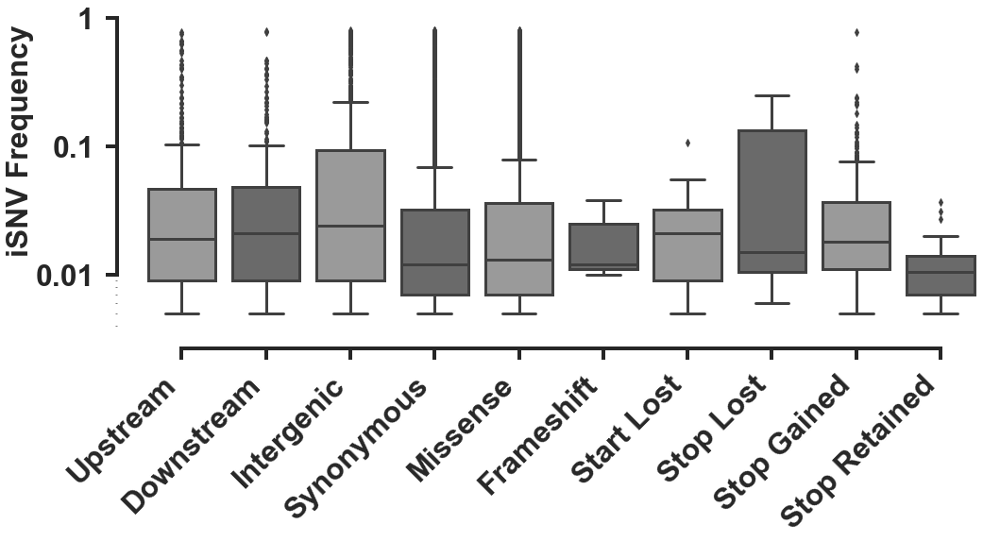

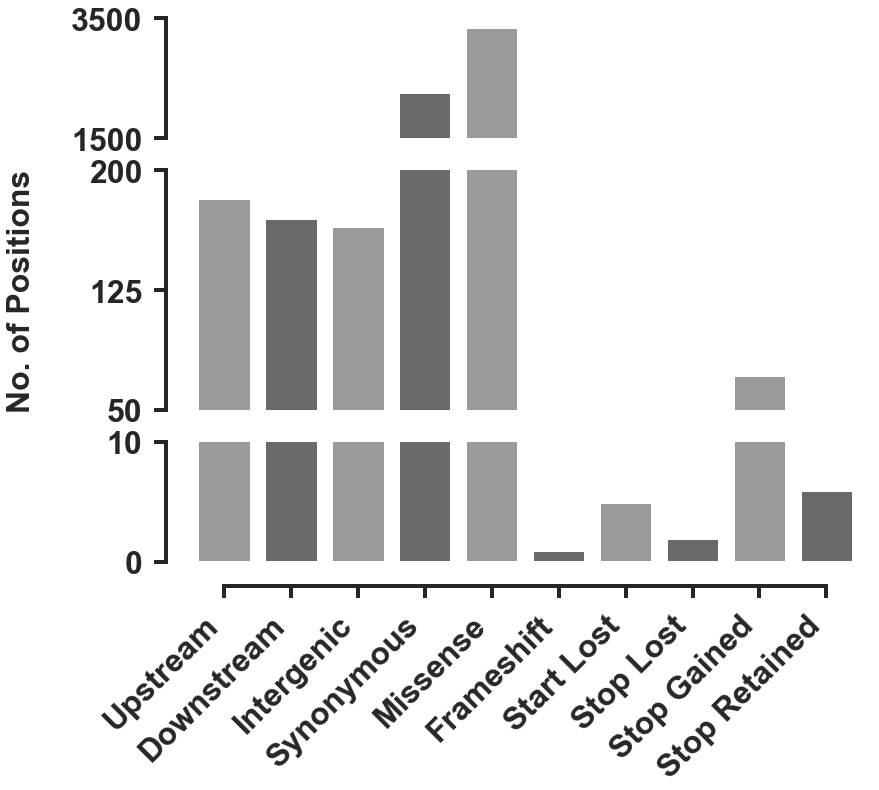

In [15]:
"""
Distribution for Type of Change
"""

dfAll = pd.read_csv("../output/REDItools2/All_Sites_with_Sample_Frequency.tsv", sep="\t").set_index(["Position", "Reference", "Sub"])
dfAnn = pd.read_csv("../output/REDItools2/All_Sites_Annotated.tsv", sep="\t")

changeTypeCount = {}
changeTypeFreq = {}

for index, row in dfAnn.iterrows():
    if not pd.isnull(row["Variation Codons"]):
        allSubs = row["Variation Codons"].split("; ")
        allChangeTypes = row["Annotation Type"].split("; ")

        if len(allSubs) == len(allChangeTypes):
            for i in range(0, len(allSubs)):
                sub = ""
                if len(re.findall(r"\d+", allSubs[i])) == 1:
                    for j in allSubs[i].split(re.findall(r"\d+", allSubs[i])[0])[1].split(">"):
                        if len(re.findall("([A-Z])", j)) != 0:
                            sub = sub + re.findall("([A-Z])", j)[0]

                    if row["Sub"] == sub:
                        if allChangeTypes[i] not in changeTypeFreq:
                            changeTypeFreq[allChangeTypes[i]] = []
                        if allChangeTypes[i] not in changeTypeCount:
                            changeTypeCount[allChangeTypes[i]] = 0
                        
                        changeTypeFreq[allChangeTypes[i]].extend(list(dfAll.loc[(row["Position"], row["Reference"], row["Sub"]),:][dfAll.loc[(row["Position"], row["Reference"], row["Sub"]),:].notna()]))
                        changeTypeCount[allChangeTypes[i]] = changeTypeCount[allChangeTypes[i]] + 1
                        
    elif not pd.isnull(row["Annotation Type"]):
        allChangeTypes = row["Annotation Type"].split("; ")[0]
        
        if allChangeTypes not in changeTypeFreq:
            changeTypeFreq[allChangeTypes] = []
        if allChangeTypes not in changeTypeCount:
            changeTypeCount[allChangeTypes] = 0

        changeTypeFreq[allChangeTypes].extend(list(dfAll.loc[(row["Position"], row["Reference"], row["Sub"]),:][dfAll.loc[(row["Position"], row["Reference"], row["Sub"]),:].notna()]))
        changeTypeCount[allChangeTypes] = changeTypeCount[allChangeTypes] + 1

dfChangeTypeFreq = pd.DataFrame(columns=["Change", "Freq"], dtype=object)

i = 0
for change in changeTypeFreq:
    for freq in changeTypeFreq[change]:
        dfChangeTypeFreq.loc[i] = [" ".join([j for j in change.split("_") if (j != "variant") and (j != "gene")]).title(), freq]
        i = i + 1

print(len(dfChangeTypeFreq))
print("Medians: ", [(change, round(dfChangeTypeFreq[dfChangeTypeFreq["Change"] == change].median()["Freq"], 3)) for change in aaTypeOfChange])

dfChangeTypeCount = pd.DataFrame(columns=["Change", "Count"], dtype=object)

i = 0
for change in changeTypeCount:
    dfChangeTypeCount.loc[i] = [" ".join([j for j in change.split("_") if (j != "variant") and (j != "gene")]).title(), changeTypeCount[change]]
    i = i + 1

print(dfChangeTypeCount)

fig, ax = plt.subplots(figsize=(16,6))

sns.boxplot(ax=ax, x="Change", y="Freq", data=dfChangeTypeFreq, order=aaTypeOfChange, palette=[colorPalette[-2], colorPalette[-1]], linewidth=3)

ax.set_xlabel("")
ax.set_ylabel("iSNV Frequency", fontsize=labelSize)
ax.get_yaxis().set_label_coords(-0.125,0.6)

ax.set_yscale("log")
ax.set_ylim([0.004,1])
ax.set_yticks([0.01,0.1,1])
ax.set_yticklabels(["0.01","0.1","1"])

for axis in ["bottom","left"]:
    ax.spines[axis].set_linewidth(spineWidth)
ax.tick_params(labelsize=tickLabelSize, length=tickLength, width=tickWidth)

sns.despine(trim=True, offset=axisOffset, ax=ax)

ax.tick_params(axis="x", rotation=45)

for i in ax.get_xticklabels(which="major"):
    i.set_ha("right")

fig, ax = plt.subplots(3, 1, gridspec_kw={"height_ratios": [1, 2, 1]}, figsize=(12,10), sharex=True)

sns.barplot(ax=ax[0], x="Change", y="Count", data=dfChangeTypeCount, order=aaTypeOfChange, palette=[colorPalette[-2], colorPalette[-1]], linewidth=3)
sns.barplot(ax=ax[1], x="Change", y="Count", data=dfChangeTypeCount, order=aaTypeOfChange, palette=[colorPalette[-2], colorPalette[-1]], linewidth=3)
sns.barplot(ax=ax[2], x="Change", y="Count", data=dfChangeTypeCount, order=aaTypeOfChange, palette=[colorPalette[-2], colorPalette[-1]], linewidth=3)

ax[2].set_ylim([0,10])
ax[2].set_xlabel("")
ax[2].set_ylabel("")
ax[2].tick_params(labelsize=tickLabelSize, length=tickLength, width=tickWidth)

ax[1].set_ylim([50,200])
ax[1].set_xlabel("")
ax[1].set_ylabel("No. of Positions\n", fontsize=labelSize)
ax[1].get_yaxis().set_label_coords(-0.18,0.5)
ax[1].set_yticks([50,125,200])
ax[1].set_yticklabels(["50","125","200"])
ax[1].tick_params(bottom="off", labelsize=tickLabelSize, length=tickLength, width=tickWidth)

ax[0].set_ylim([1500,3500])
ax[0].set_xlabel("")
ax[0].set_ylabel("")
ax[0].set_yticks([1500,3500])
ax[0].set_yticklabels(["1500","3500"])
ax[0].tick_params(bottom="off", labelsize=tickLabelSize, length=tickLength, width=spineWidth)

for axis in ["bottom","left"]:
    ax[0].spines[axis].set_linewidth(spineWidth)
    ax[1].spines[axis].set_linewidth(spineWidth)
    ax[2].spines[axis].set_linewidth(spineWidth)

sns.despine(ax=ax[0], trim=True, bottom=True, offset=axisOffset)
sns.despine(ax=ax[1], trim=True, bottom=True, offset=axisOffset)
sns.despine(ax=ax[2], trim=True, offset=axisOffset)

ax[2].tick_params(axis="x", rotation=45)

for i in ax[2].get_xticklabels(which="major"):
    i.set_ha("right")

plt.show()


/Users/pxthxk/miniconda3/envs/COVID-19/lib/python2.7/site-packages/matplotlib/axes/_base.py:3477: UserWarning: Attempted to set non-positive ylimits for log-scale axis; invalid limits will be ignored.
  'Attempted to set non-positive ylimits for log-scale axis; '


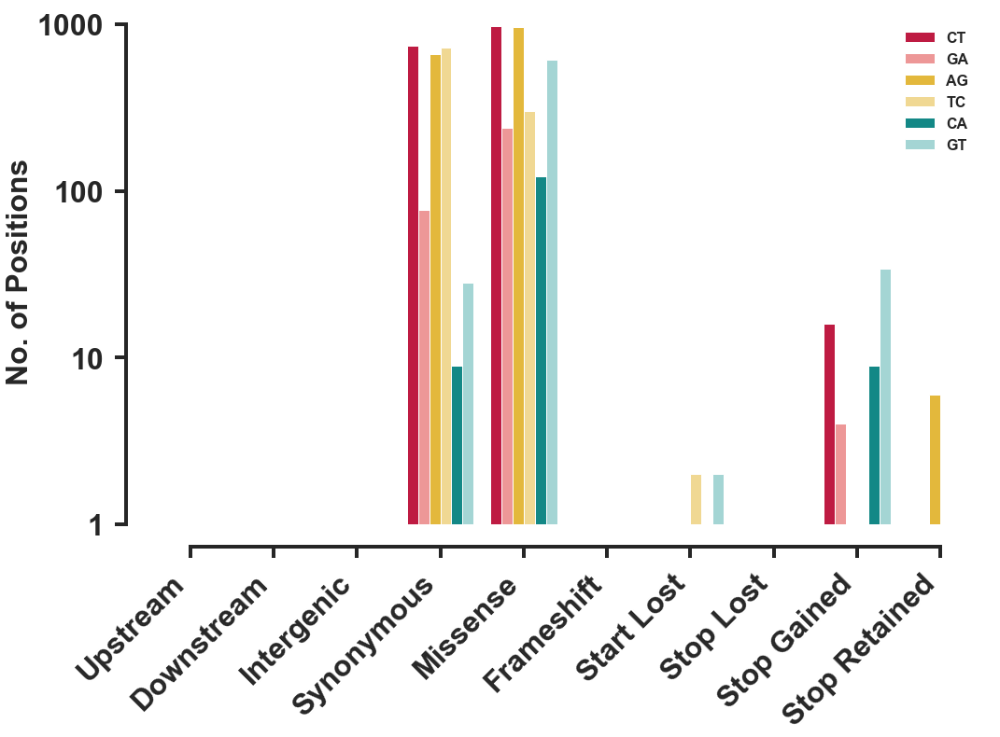

In [16]:
"""
Distribution for Type of Change w.r.t. nucleotide change
"""

dfAnn = pd.read_csv("../output/REDItools2/All_Sites_Annotated.tsv", sep="\t")

changeTypeNucCount = {}

for index, row in dfAnn.iterrows():
    if not pd.isnull(row["Variation Codons"]):
        allSubs = row["Variation Codons"].split("; ")
        allChangeTypes = row["Annotation Type"].split("; ")

        if len(allSubs) == len(allChangeTypes):
            for i in range(0, len(allSubs)):
                sub = ""
                if len(re.findall(r"\d+", allSubs[i])) == 1:
                    for j in allSubs[i].split(re.findall(r"\d+", allSubs[i])[0])[1].split(">"):
                        if len(re.findall("([A-Z])", j)) != 0:
                            sub = sub + re.findall("([A-Z])", j)[0]

                    if row["Sub"] == sub:
                        if sub not in changeTypeNucCount:
                            changeTypeNucCount[sub] = {}
                        if allChangeTypes[i] not in changeTypeNucCount[sub]:
                            changeTypeNucCount[sub][allChangeTypes[i]] = 0
                        
                        changeTypeNucCount[sub][allChangeTypes[i]] = changeTypeNucCount[sub][allChangeTypes[i]] + 1
                        
    elif not pd.isnull(row["Annotation Type"]):
        allChangeTypes = row["Annotation Type"].split("; ")[0]
        
        if row["Sub"] not in changeTypeNucCount:
            changeTypeNucCount[row["Sub"]] = {}
        if allChangeTypes not in changeTypeNucCount:
            changeTypeNucCount[row["Sub"]][allChangeTypes] = 0

        changeTypeNucCount[row["Sub"]][allChangeTypes] = changeTypeNucCount[row["Sub"]][allChangeTypes] + 1

dfChangeTypeNucCount = pd.DataFrame(columns=["Change", "Count", "Sub"], dtype=object)

i = 0
for sub in changeTypeNucCount:
    for change in changeTypeNucCount[sub]:
        dfChangeTypeNucCount.loc[i] = [" ".join([j for j in change.split("_") if (j != "variant") and (j != "gene")]).title(), changeTypeNucCount[sub][change], sub]
        i = i + 1

# print(dfChangeTypeNucCount)

fig, ax = plt.subplots(figsize=(16,10))

sns.barplot(ax=ax, x="Change", y="Count", hue="Sub", data=dfChangeTypeNucCount, order=aaTypeOfChange, hue_order=nucChange[0:6], palette=nucColors[0:6])

ax.set_xlabel("")
ax.set_ylabel("No. of Positions\n", fontsize=labelSize)
ax.get_yaxis().set_label_coords(-0.1,0.5)

ax.set_yscale("log")
ax.set_ylim([0,1100])
ax.set_yticks([1,10,100,1000])
ax.set_yticklabels(["1","10","100","1000"])

for axis in ["bottom","left"]:
    ax.spines[axis].set_linewidth(spineWidth)
ax.tick_params(labelsize=tickLabelSize, length=tickLength, width=tickWidth)
sns.despine(ax=ax, trim=True, offset=axisOffset)

ax.tick_params(axis="x", rotation=45)

for i in ax.get_xticklabels(which="major"):
    i.set_ha("right")
    
legend = ax.legend(title="", prop={"size": 16}, loc="upper right")
legend.get_frame().set_linewidth(0)

plt.show()


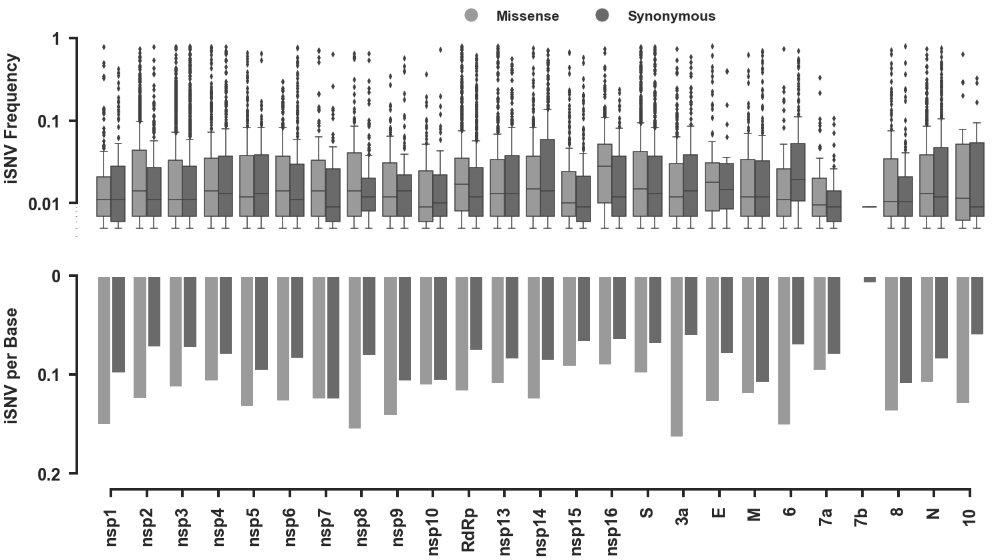

In [17]:
"""
Protein-wise Type of Change
"""

dfAll = pd.read_csv("../output/REDItools2/All_Sites_with_Sample_Frequency.tsv", sep="\t").set_index(["Position", "Reference", "Sub"])
dfAnn = pd.read_csv("../output/REDItools2/All_Sites_Annotated.tsv", sep="\t")

changeTypeProteinCount = {}
changeTypeProteinFreq = {}

for index, row in dfAnn.iterrows():
    for protein in SARSCoV2Proteins:
        if (row["Position"] >= SARSCoV2Proteins[protein][0]) and (row["Position"] <= SARSCoV2Proteins[protein][1]):
            if protein not in changeTypeProteinCount:
                changeTypeProteinCount[protein] = {}
            if protein not in changeTypeProteinFreq:
                changeTypeProteinFreq[protein] = {}
            if not pd.isnull(row["Variation Codons"]):
                allSubs = row["Variation Codons"].split("; ")
                allChangeTypes = row["Annotation Type"].split("; ")

                if len(allSubs) == len(allChangeTypes):
                    for i in range(0, len(allSubs)):
                        sub = ""
                        if len(re.findall(r"\d+", allSubs[i])) == 1:
                            for j in allSubs[i].split(re.findall(r"\d+", allSubs[i])[0])[1].split(">"):
                                if len(re.findall("([A-Z])", j)) != 0:
                                    sub = sub + re.findall("([A-Z])", j)[0]

                            if row["Sub"] == sub:
                                if allChangeTypes[i] not in changeTypeProteinFreq[protein]:
                                    changeTypeProteinFreq[protein][allChangeTypes[i]] = []
                                if allChangeTypes[i] not in changeTypeProteinCount[protein]:
                                    changeTypeProteinCount[protein][allChangeTypes[i]] = 0

                                changeTypeProteinFreq[protein][allChangeTypes[i]].extend(list(dfAll.loc[(row["Position"], row["Reference"], row["Sub"]),:][dfAll.loc[(row["Position"], row["Reference"], row["Sub"]),:].notna()]))
                                changeTypeProteinCount[protein][allChangeTypes[i]] = changeTypeProteinCount[protein][allChangeTypes[i]] + 1

            elif not pd.isnull(row["Annotation Type"]):
                allChangeTypes = row["Annotation Type"].split("; ")[0]

                if allChangeTypes not in changeTypeProteinFreq[protein]:
                    changeTypeProteinFreq[protein][allChangeTypes] = []
                if allChangeTypes not in changeTypeProteinCount[protein]:
                    changeTypeProteinCount[protein][allChangeTypes] = 0

                changeTypeProteinFreq[protein][allChangeTypes].extend(list(dfAll.loc[(row["Position"], row["Reference"], row["Sub"]),:][dfAll.loc[(row["Position"], row["Reference"], row["Sub"]),:].notna()]))
                changeTypeProteinCount[protein][allChangeTypes] = changeTypeProteinCount[protein][allChangeTypes] + 1

dfChangeTypeProteinFreq = pd.DataFrame(columns=["Protein", "Type", "Freq"], dtype=float)

i = 0
for protein in changeTypeProteinFreq:
    for type in changeTypeProteinFreq[protein]:
        for freq in changeTypeProteinFreq[protein][type]:
            dfChangeTypeProteinFreq.loc[i] = [protein, type, freq]
            i = i + 1
            
for protein in changeTypeProteinCount:
    for type in changeTypeProteinCount[protein]:
        changeTypeProteinCount[protein][type] = (float(changeTypeProteinCount[protein][type])/float(SARSCoV2Proteins[protein][1]-SARSCoV2Proteins[protein][0]))
        
dfChangeTypeProteinCount = pd.DataFrame(columns=["Protein", "Type", "Count"], dtype=float)

i = 0
for protein in changeTypeProteinCount:
    for type in changeTypeProteinCount[protein]:
        dfChangeTypeProteinCount.loc[i] = [protein, type, changeTypeProteinCount[protein][type]]
        i = i + 1

fig, ax = plt.subplots(2, 1, figsize=(24,12), sharex=True)

sns.boxplot(ax=ax[0], x="Protein", y="Freq", hue="Type", data=dfChangeTypeProteinFreq, order=[j[0] for j in sorted(SARSCoV2Proteins.items(), key=lambda i: i[1][0])], hue_order=["missense_variant", "synonymous_variant"], palette=[colorPalette[i] for i in [-2,-1]])

ax[0].set_xlabel("")
ax[0].set_ylabel("iSNV Frequency\n", fontsize=labelSize*0.8)
ax[0].get_yaxis().set_label_coords(-0.06,0.6)

ax[0].set_yscale("log")
ax[0].set_ylim([0.004,1])
ax[0].set_yticks([0.01,0.1,1])
ax[0].set_yticklabels(["0.01","0.1","1"])

ax[0].spines["left"].set_linewidth(spineWidth)
ax[0].tick_params(bottom="off", labelsize=tickLabelSize*0.8, length=tickLength, width=tickWidth)
sns.despine(ax=ax[0], bottom=True, trim=True, offset=axisOffset)

ax[0].legend().remove()

sns.barplot(ax=ax[1], x="Protein", y="Count", hue="Type", data=dfChangeTypeProteinCount, order=[j[0] for j in sorted(SARSCoV2Proteins.items(), key=lambda i: i[1][0])], hue_order=["missense_variant", "synonymous_variant"], palette=[colorPalette[i] for i in [-2,-1]], linewidth=3)

ax[1].set_xlabel("")
ax[1].set_ylabel("iSNV per Base\n", fontsize=labelSize*0.8)

ax[1].set_yticks([0,0.1,0.2])
ax[1].set_yticklabels(["0","0.1","0.2"])
ax[1].get_yaxis().set_label_coords(-0.06,0.55)

for axis in ["bottom","left"]:
    ax[1].spines[axis].set_linewidth(spineWidth)
ax[1].tick_params(labelsize=tickLabelSize*0.8, length=tickLength, width=tickWidth)
sns.despine(ax=ax[1], trim=True, offset=axisOffset)

ax[1].tick_params(axis="x", rotation=90)

legend = plt.legend(title="", prop={"size": 24/1.5})
legend.get_frame().set_linewidth(0)

ax[1].invert_yaxis()

ax[1].legend().remove()

lines = [Line2D([0], [0], color="w", marker="o", markerfacecolor=color, markersize=tickLabelSize*0.66) for color in [colorPalette[i] for i in [-2,-1]]]
legend = plt.legend(lines, ["Missense", "Synonymous"], prop={"size": tickLabelSize*0.66}, ncol=2, loc=(0.4,2.25))
legend.get_frame().set_linewidth(0)

plt.show()


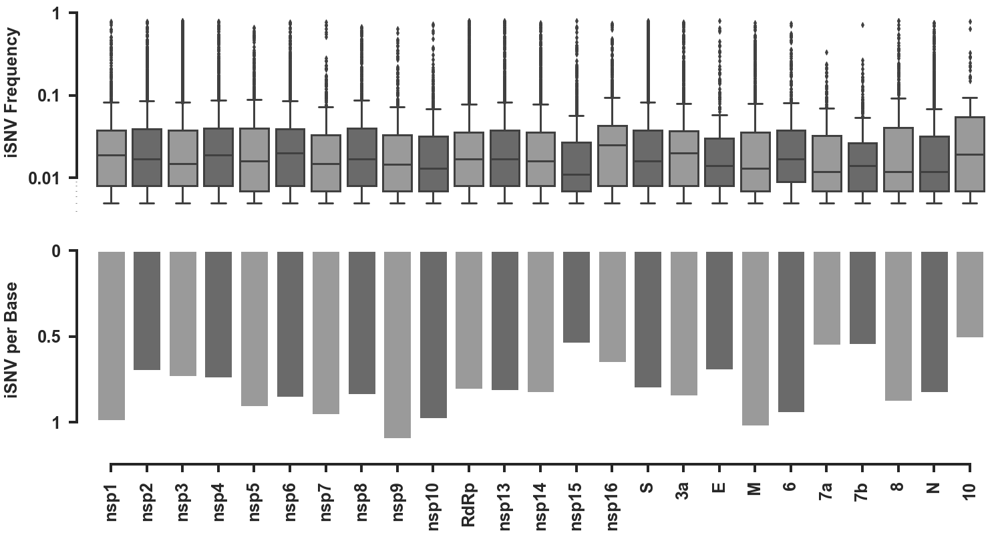

In [18]:
"""
Protein-wise edited sites distribution
"""

dfAll = pd.read_csv("../output/REDItools2/All_Sites_with_Sample_Frequency.tsv", sep="\t")

proteinNucFreq = {}
proteinNucCount = {}

for index, row in dfAll.iterrows():
    for protein in SARSCoV2Proteins:
        if (row["Position"] >= SARSCoV2Proteins[protein][0]) and (row["Position"] <= SARSCoV2Proteins[protein][1]):
            if protein not in proteinNucFreq:
                proteinNucFreq[protein] = []
            proteinNucFreq[protein].extend(list(row[3:][row[3:].notna()]))
                
            if protein not in proteinNucCount:
                proteinNucCount[protein] = 0
            proteinNucCount[protein] = proteinNucCount[protein] + 1
            
dfProteinsFreq = pd.DataFrame(columns=["Protein", "Freq"], dtype=float)

i = 0
for protein in proteinNucFreq:
    for freq in proteinNucFreq[protein]:
        dfProteinsFreq.loc[i] = [protein, freq]
        i = i + 1
            
for protein in proteinNucCount:
    proteinNucCount[protein] = (float(proteinNucCount[protein])/float(SARSCoV2Proteins[protein][1]-SARSCoV2Proteins[protein][0]))
        
dfProteinsCount = pd.DataFrame(columns=["Protein", "Count"], dtype=float)

i = 0
for protein in proteinNucCount:
    dfProteinsCount.loc[i] = [protein, proteinNucCount[protein]]
    i = i + 1

fig, ax = plt.subplots(2, 1, figsize=(24,12), sharex=True)

sns.boxplot(ax=ax[0], x="Protein", y="Freq", data=dfProteinsFreq, order=[j[0] for j in sorted(SARSCoV2Proteins.items(), key=lambda i: i[1][0])], palette=[colorPalette[i] for i in [-2,-1]], linewidth=3)

ax[0].set_xlabel("")
ax[0].set_ylabel("iSNV Frequency\n", fontsize=labelSize*0.8)
ax[0].get_yaxis().set_label_coords(-0.06,0.6)

ax[0].set_yscale("log")
ax[0].set_ylim([0.004,1])
ax[0].set_yticks([0.01,0.1,1])
ax[0].set_yticklabels(["0.01","0.1","1"])

ax[0].spines["left"].set_linewidth(spineWidth)
ax[0].tick_params(bottom="off", labelsize=tickLabelSize*0.8, length=tickLength, width=tickWidth)
sns.despine(ax=ax[0], bottom=True, trim=True, offset=axisOffset)

ax[0].legend().remove()

sns.barplot(ax=ax[1], x="Protein", y="Count", data=dfProteinsCount, order=[j[0] for j in sorted(SARSCoV2Proteins.items(), key=lambda i: i[1][0])], palette=[colorPalette[i] for i in [-2,-1]], linewidth=3)

ax[1].set_xlabel("")
ax[1].set_ylabel("iSNV per Base\n", fontsize=labelSize*0.8)

ax[1].set_yticks([0,0.5,1])
ax[1].set_yticklabels(["0","0.5","1"])
ax[1].get_yaxis().set_label_coords(-0.06,0.55)

for axis in ["bottom","left"]:
    ax[1].spines[axis].set_linewidth(spineWidth)
ax[1].tick_params(labelsize=tickLabelSize*0.8, length=tickLength, width=tickWidth)
sns.despine(ax=ax[1], trim=True, offset=axisOffset)

ax[1].tick_params(axis="x", rotation=90)

legend = plt.legend(title="", prop={"size": 24/1.5})
legend.get_frame().set_linewidth(0)

ax[1].invert_yaxis()

ax[1].legend().remove()

plt.show()


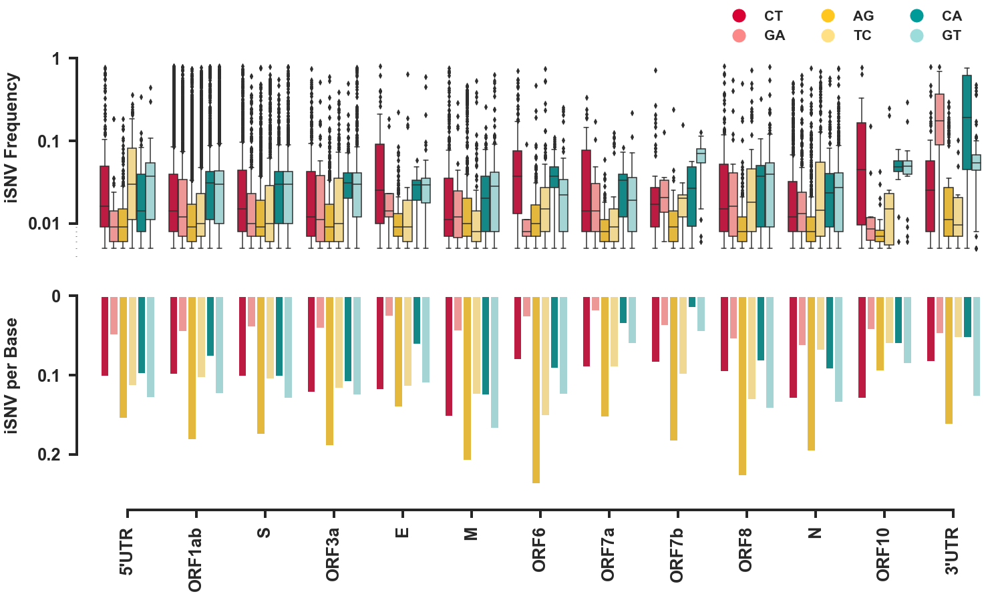

In [23]:
"""
Gene-wise APOBEC/ADAR distribution
"""

dfAll = pd.read_csv("../output/REDItools2/All_Sites_with_Sample_Frequency.tsv", sep="\t")

geneNucFreq = {}
geneNucCount = {}

for index, row in dfAll.iterrows():
    if row["Sub"] in nucChange[0:6]:
        for gene in SARSCoV2Genes:
            if (row["Position"] >= SARSCoV2Genes[gene][0]) and (row["Position"] <= SARSCoV2Genes[gene][1]):
                if gene not in geneNucFreq:
                    geneNucFreq[gene] = {}
                if row["Sub"] not in geneNucFreq[gene]:
                    geneNucFreq[gene][row["Sub"]] = []
                geneNucFreq[gene][row["Sub"]].extend(list(row[3:][row[3:].notna()]))
                
                if gene not in geneNucCount:
                    geneNucCount[gene] = {}
                if row["Sub"] not in geneNucCount[gene]:
                    geneNucCount[gene][row["Sub"]] = 0
                geneNucCount[gene][row["Sub"]] = geneNucCount[gene][row["Sub"]] + 1
            
dfGenesFreq = pd.DataFrame(columns=["Gene", "Sub", "Freq"], dtype=float)

i = 0
for gene in geneNucFreq:
    for sub in geneNucFreq[gene]:
        for freq in geneNucFreq[gene][sub]:
            dfGenesFreq.loc[i] = [gene, sub, freq]
            i = i + 1
            
for gene in geneNucCount:
    for sub in geneNucCount[gene]:
        geneNucCount[gene][sub] = (float(geneNucCount[gene][sub])/float(SARSCoV2Genes[gene][1]-SARSCoV2Genes[gene][0]))
        
dfGenesCount = pd.DataFrame(columns=["Gene", "Sub", "Count"], dtype=float)

i = 0
for gene in geneNucCount:
    for sub in geneNucCount[gene]:
        dfGenesCount.loc[i] = [gene, sub, geneNucCount[gene][sub]]
        i = i + 1

fig, ax = plt.subplots(2, 1, figsize=(24,12), sharex=True)

sns.boxplot(ax=ax[0], x="Gene", y="Freq", hue="Sub", data=dfGenesFreq, order=[j[0] for j in sorted(SARSCoV2Genes.items(), key=lambda i: i[1][0])], hue_order=nucChange[0:6], palette=nucColors[0:6])

ax[0].set_xlabel("")
ax[0].set_ylabel("iSNV Frequency\n", fontsize=labelSize*0.8)
ax[0].get_yaxis().set_label_coords(-0.06,0.6)

ax[0].set_yscale("log")
ax[0].set_ylim([0.004,1])
ax[0].set_yticks([0.01,0.1,1])
ax[0].set_yticklabels(["0.01","0.1","1"])

ax[0].spines["left"].set_linewidth(spineWidth)
ax[0].tick_params(bottom="off", labelsize=tickLabelSize*0.8, length=tickLength, width=tickWidth)
sns.despine(ax=ax[0], bottom=True, trim=True, offset=axisOffset)

ax[0].legend().remove()

sns.barplot(ax=ax[1], x="Gene", y="Count", hue="Sub", data=dfGenesCount, order=[j[0] for j in sorted(SARSCoV2Genes.items(), key=lambda i: i[1][0])], hue_order=nucChange[0:6], palette=nucColors[0:6], linewidth=3)

ax[1].set_xlabel("")
ax[1].set_ylabel("iSNV per Base\n", fontsize=labelSize*0.8)

ax[1].set_yticks([0,0.1,0.2])
ax[1].set_yticklabels(["0","0.1","0.2"])
ax[1].get_yaxis().set_label_coords(-0.06,0.6)

for axis in ["bottom","left"]:
    ax[1].spines[axis].set_linewidth(spineWidth)
ax[1].tick_params(labelsize=tickLabelSize*0.8, length=tickLength, width=tickWidth)
sns.despine(ax=ax[1], trim=True, offset=axisOffset)

ax[1].tick_params(axis="x", rotation=90)

legend = plt.legend(title="", prop={"size": 24/1.5})
legend.get_frame().set_linewidth(0)

ax[1].invert_yaxis()

ax[1].legend().remove()

lines = [Line2D([0], [0], color="w", marker="o", markerfacecolor=color, markersize=tickLabelSize*0.66) for color in nucColors[0:6]]
legend = plt.legend(lines, nucChange[0:6], prop={"size": tickLabelSize*0.66}, ncol=3, loc=(0.7,2.25))
legend.get_frame().set_linewidth(0)

plt.show()


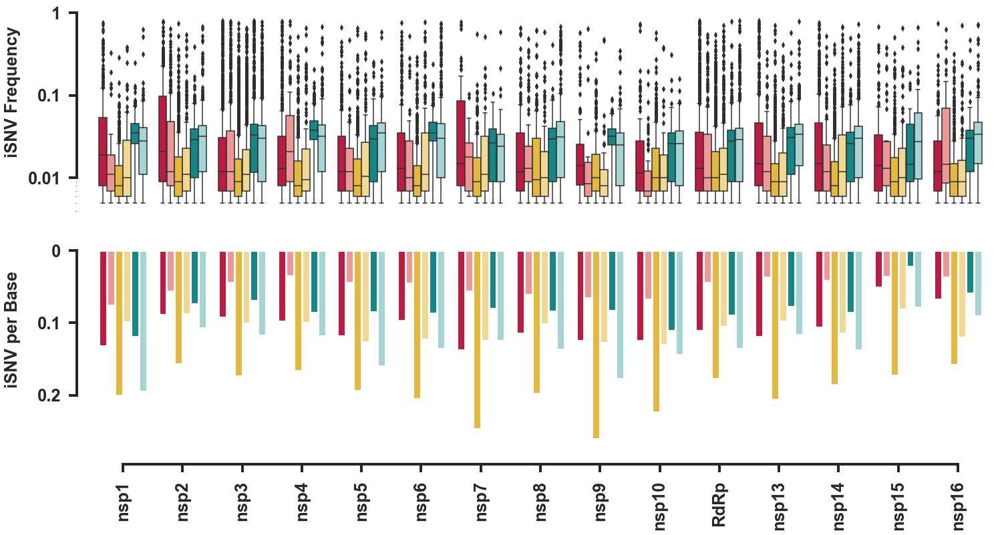

In [24]:
"""
Protein-wise APOBEC/ADAR distribution
"""

dfAll = pd.read_csv("../output/REDItools2/All_Sites_with_Sample_Frequency.tsv", sep="\t")

proteinNucFreq = {}
proteinNucCount = {}

for index, row in dfAll.iterrows():
    if row["Sub"] in nucChange[0:6]:
        for protein in SARSCoV2Proteins:
            if (row["Position"] >= SARSCoV2Proteins[protein][0]) and (row["Position"] <= SARSCoV2Proteins[protein][1]):
                if protein not in proteinNucFreq:
                    proteinNucFreq[protein] = {}
                if row["Sub"] not in proteinNucFreq[protein]:
                    proteinNucFreq[protein][row["Sub"]] = []
                proteinNucFreq[protein][row["Sub"]].extend(list(row[3:][row[3:].notna()]))
                
                if protein not in proteinNucCount:
                    proteinNucCount[protein] = {}
                if row["Sub"] not in proteinNucCount[protein]:
                    proteinNucCount[protein][row["Sub"]] = 0
                proteinNucCount[protein][row["Sub"]] = proteinNucCount[protein][row["Sub"]] + 1
            
dfProteinsFreq = pd.DataFrame(columns=["Protein", "Sub", "Freq"], dtype=float)

i = 0
for protein in proteinNucFreq:
    for sub in proteinNucFreq[protein]:
        for freq in proteinNucFreq[protein][sub]:
            dfProteinsFreq.loc[i] = [protein, sub, freq]
            i = i + 1
            
for protein in proteinNucCount:
    for sub in proteinNucCount[protein]:
        proteinNucCount[protein][sub] = (float(proteinNucCount[protein][sub])/float(SARSCoV2Proteins[protein][1]-SARSCoV2Proteins[protein][0]))
        
dfProteinsCount = pd.DataFrame(columns=["Protein", "Sub", "Count"], dtype=float)

i = 0
for protein in proteinNucCount:
    for sub in proteinNucCount[protein]:
        dfProteinsCount.loc[i] = [protein, sub, proteinNucCount[protein][sub]]
        i = i + 1

fig, ax = plt.subplots(2, 1, figsize=(24,12), sharex=True)

sns.boxplot(ax=ax[0], x="Protein", y="Freq", hue="Sub", data=dfProteinsFreq, order=[j[0] for j in sorted(SARSCoV2Proteins.items(), key=lambda i: i[1][0])[0:15]], hue_order=nucChange[0:6], palette=nucColors[0:6])

ax[0].set_xlabel("")
ax[0].set_ylabel("iSNV Frequency\n", fontsize=labelSize*0.8)
ax[0].get_yaxis().set_label_coords(-0.06,0.6)

ax[0].set_yscale("log")
ax[0].set_ylim([0.004,1])
ax[0].set_yticks([0.01,0.1,1])
ax[0].set_yticklabels(["0.01","0.1","1"])

ax[0].spines["left"].set_linewidth(spineWidth)
ax[0].tick_params(bottom="off", labelsize=tickLabelSize*0.8, length=tickLength, width=tickWidth)
sns.despine(ax=ax[0], bottom=True, trim=True, offset=axisOffset)

ax[0].legend().remove()

sns.barplot(ax=ax[1], x="Protein", y="Count", hue="Sub", data=dfProteinsCount, order=[j[0] for j in sorted(SARSCoV2Proteins.items(), key=lambda i: i[1][0])[0:15]], hue_order=nucChange[0:6], palette=nucColors[0:6], linewidth=3)

ax[1].set_xlabel("")
ax[1].set_ylabel("iSNV per Base\n", fontsize=labelSize*0.8)

ax[1].set_yticks([0,0.1,0.2])
ax[1].set_yticklabels(["0","0.1","0.2"])
ax[1].get_yaxis().set_label_coords(-0.06,0.6)

for axis in ["bottom","left"]:
    ax[1].spines[axis].set_linewidth(spineWidth)
ax[1].tick_params(labelsize=tickLabelSize*0.8, length=tickLength, width=tickWidth)
sns.despine(ax=ax[1], trim=True, offset=axisOffset)

ax[1].tick_params(axis="x", rotation=90)

legend = plt.legend(title="", prop={"size": 24/1.5})
legend.get_frame().set_linewidth(0)

ax[1].invert_yaxis()

ax[1].legend().remove()

plt.show()


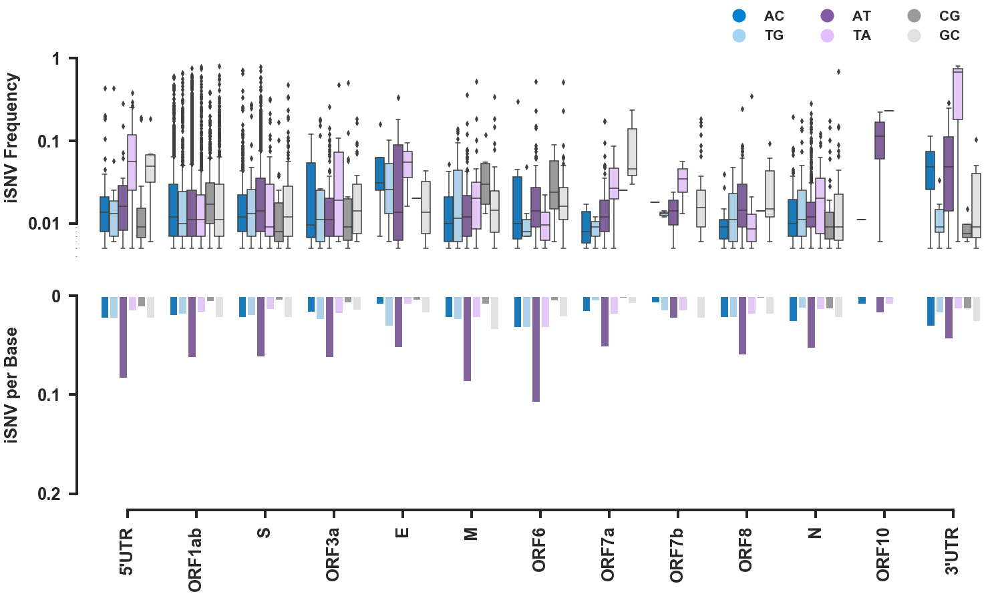

In [21]:
"""
Gene-wise distribution of rest of the nucleotides
"""

dfAll = pd.read_csv("../output/REDItools2/All_Sites_with_Sample_Frequency.tsv", sep="\t")

geneNucFreq = {}
geneNucCount = {}

for index, row in dfAll.iterrows():
    if row["Sub"] in nucChange[6:]:
        for gene in SARSCoV2Genes:
            if (row["Position"] >= SARSCoV2Genes[gene][0]) and (row["Position"] <= SARSCoV2Genes[gene][1]):
                if gene not in geneNucFreq:
                    geneNucFreq[gene] = {}
                if row["Sub"] not in geneNucFreq[gene]:
                    geneNucFreq[gene][row["Sub"]] = []
                geneNucFreq[gene][row["Sub"]].extend(list(row[3:][row[3:].notna()]))
                
                if gene not in geneNucCount:
                    geneNucCount[gene] = {}
                if row["Sub"] not in geneNucCount[gene]:
                    geneNucCount[gene][row["Sub"]] = 0
                geneNucCount[gene][row["Sub"]] = geneNucCount[gene][row["Sub"]] + 1
            
dfGenesFreq = pd.DataFrame(columns=["Gene", "Sub", "Freq"], dtype=float)

i = 0
for gene in geneNucFreq:
    for sub in geneNucFreq[gene]:
        for freq in geneNucFreq[gene][sub]:
            dfGenesFreq.loc[i] = [gene, sub, freq]
            i = i + 1
            
for gene in geneNucCount:
    for sub in geneNucCount[gene]:
        geneNucCount[gene][sub] = (float(geneNucCount[gene][sub])/float(SARSCoV2Genes[gene][1]-SARSCoV2Genes[gene][0]))
        
dfGenesCount = pd.DataFrame(columns=["Gene", "Sub", "Count"], dtype=float)

i = 0
for gene in geneNucCount:
    for sub in geneNucCount[gene]:
        dfGenesCount.loc[i] = [gene, sub, geneNucCount[gene][sub]]
        i = i + 1

fig, ax = plt.subplots(2, 1, figsize=(24,12), sharex=True)

sns.boxplot(ax=ax[0], x="Gene", y="Freq", hue="Sub", data=dfGenesFreq, order=[j[0] for j in sorted(SARSCoV2Genes.items(), key=lambda i: i[1][0])], hue_order=nucChange[6:], palette=nucColors[6:])

ax[0].set_xlabel("")
ax[0].set_ylabel("iSNV Frequency\n", fontsize=labelSize*0.8)
ax[0].get_yaxis().set_label_coords(-0.06,0.6)

ax[0].set_yscale("log")
ax[0].set_ylim([0.004,1])
ax[0].set_yticks([0.01,0.1,1])
ax[0].set_yticklabels(["0.01","0.1","1"])

ax[0].spines["left"].set_linewidth(spineWidth)
ax[0].tick_params(bottom="off", labelsize=tickLabelSize*0.8, length=tickLength, width=tickWidth)
sns.despine(ax=ax[0], bottom=True, trim=True, offset=axisOffset)

ax[0].legend().remove()

sns.barplot(ax=ax[1], x="Gene", y="Count", hue="Sub", data=dfGenesCount, order=[j[0] for j in sorted(SARSCoV2Genes.items(), key=lambda i: i[1][0])], hue_order=nucChange[6:], palette=nucColors[6:], linewidth=3)

ax[1].set_xlabel("")
ax[1].set_ylabel("iSNV per Base\n", fontsize=labelSize*0.8)

ax[1].set_yticks([0,0.1,0.2])
ax[1].set_yticklabels(["0","0.1","0.2"])
ax[1].get_yaxis().set_label_coords(-0.06,0.55)

for axis in ["bottom","left"]:
    ax[1].spines[axis].set_linewidth(spineWidth)
ax[1].tick_params(labelsize=tickLabelSize*0.8, length=tickLength, width=tickWidth)
sns.despine(ax=ax[1], trim=True, offset=axisOffset)

ax[1].tick_params(axis="x", rotation=90)

legend = plt.legend(title="", prop={"size": 24/1.5})
legend.get_frame().set_linewidth(0)

ax[1].invert_yaxis()

ax[1].legend().remove()

lines = [Line2D([0], [0], color="w", marker="o", markerfacecolor=color, markersize=tickLabelSize*0.66) for color in nucColors[6:]]
legend = plt.legend(lines, nucChange[6:], prop={"size": tickLabelSize*0.66}, ncol=3, loc=(0.7,2.25))
legend.get_frame().set_linewidth(0)

plt.show()


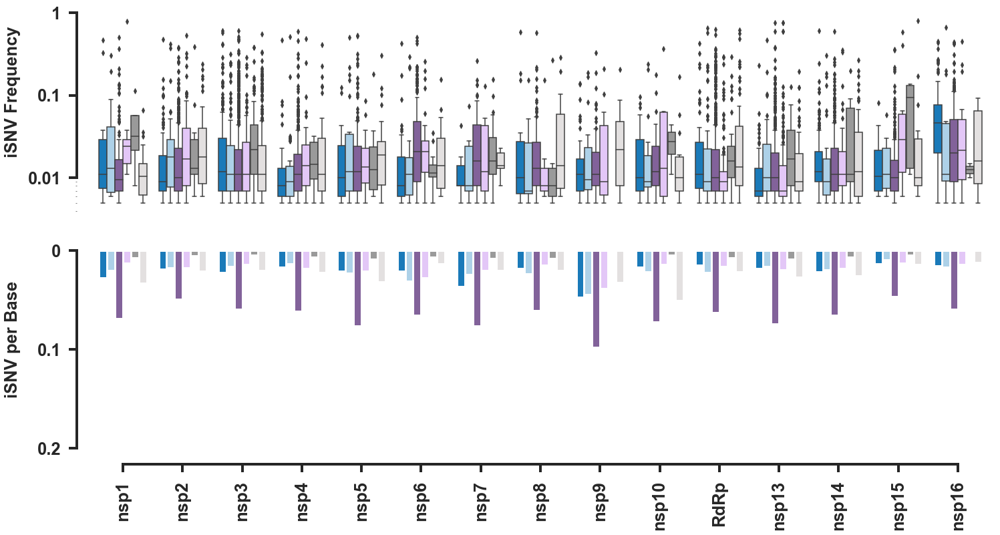

In [22]:
"""
Protein-wise distribution of rest of the nucleotides
"""

dfAll = pd.read_csv("../output/REDItools2/All_Sites_with_Sample_Frequency.tsv", sep="\t")

proteinNucFreq = {}
proteinNucCount = {}

for index, row in dfAll.iterrows():
    if row["Sub"] in nucChange[6:]:
        for protein in SARSCoV2Proteins:
            if (row["Position"] >= SARSCoV2Proteins[protein][0]) and (row["Position"] <= SARSCoV2Proteins[protein][1]):
                if protein not in proteinNucFreq:
                    proteinNucFreq[protein] = {}
                if row["Sub"] not in proteinNucFreq[protein]:
                    proteinNucFreq[protein][row["Sub"]] = []
                proteinNucFreq[protein][row["Sub"]].extend(list(row[3:][row[3:].notna()]))
                
                if protein not in proteinNucCount:
                    proteinNucCount[protein] = {}
                if row["Sub"] not in proteinNucCount[protein]:
                    proteinNucCount[protein][row["Sub"]] = 0
                proteinNucCount[protein][row["Sub"]] = proteinNucCount[protein][row["Sub"]] + 1
            
dfProteinsFreq = pd.DataFrame(columns=["Protein", "Sub", "Freq"], dtype=float)

i = 0
for protein in proteinNucFreq:
    for sub in proteinNucFreq[protein]:
        for freq in proteinNucFreq[protein][sub]:
            dfProteinsFreq.loc[i] = [protein, sub, freq]
            i = i + 1
            
for protein in proteinNucCount:
    for sub in proteinNucCount[protein]:
        proteinNucCount[protein][sub] = (float(proteinNucCount[protein][sub])/float(SARSCoV2Proteins[protein][1]-SARSCoV2Proteins[protein][0]))
        
dfProteinsCount = pd.DataFrame(columns=["Protein", "Sub", "Count"], dtype=float)

i = 0
for protein in proteinNucCount:
    for sub in proteinNucCount[protein]:
        dfProteinsCount.loc[i] = [protein, sub, proteinNucCount[protein][sub]]
        i = i + 1

fig, ax = plt.subplots(2, 1, figsize=(24,12), sharex=True)

sns.boxplot(ax=ax[0], x="Protein", y="Freq", hue="Sub", data=dfProteinsFreq, order=[j[0] for j in sorted(SARSCoV2Proteins.items(), key=lambda i: i[1][0])[0:15]], hue_order=nucChange[6:], palette=nucColors[6:])

ax[0].set_xlabel("")
ax[0].set_ylabel("iSNV Frequency\n", fontsize=labelSize*0.8)
ax[0].get_yaxis().set_label_coords(-0.06,0.6)

ax[0].set_yscale("log")
ax[0].set_ylim([0.004,1])
ax[0].set_yticks([0.01,0.1,1])
ax[0].set_yticklabels(["0.01","0.1","1"])

ax[0].spines["left"].set_linewidth(spineWidth)
ax[0].tick_params(bottom="off", labelsize=tickLabelSize*0.8, length=tickLength, width=tickWidth)
sns.despine(ax=ax[0], bottom=True, trim=True, offset=axisOffset)

ax[0].legend().remove()

sns.barplot(ax=ax[1], x="Protein", y="Count", hue="Sub", data=dfProteinsCount, order=[j[0] for j in sorted(SARSCoV2Proteins.items(), key=lambda i: i[1][0])[0:15]], hue_order=nucChange[6:], palette=nucColors[6:], linewidth=3)

ax[1].set_xlabel("")
ax[1].set_ylabel("iSNV per Base\n", fontsize=labelSize*0.8)

ax[1].set_yticks([0,0.1,0.2])
ax[1].set_yticklabels(["0","0.1","0.2"])
ax[1].get_yaxis().set_label_coords(-0.06,0.55)

for axis in ["bottom","left"]:
    ax[1].spines[axis].set_linewidth(spineWidth)
ax[1].tick_params(labelsize=tickLabelSize*0.8, length=tickLength, width=tickWidth)
sns.despine(ax=ax[1], trim=True, offset=axisOffset)

ax[1].tick_params(axis="x", rotation=90)

legend = plt.legend(title="", prop={"size": 24/1.5})
legend.get_frame().set_linewidth(0)

ax[1].invert_yaxis()

ax[1].legend().remove()

plt.show()


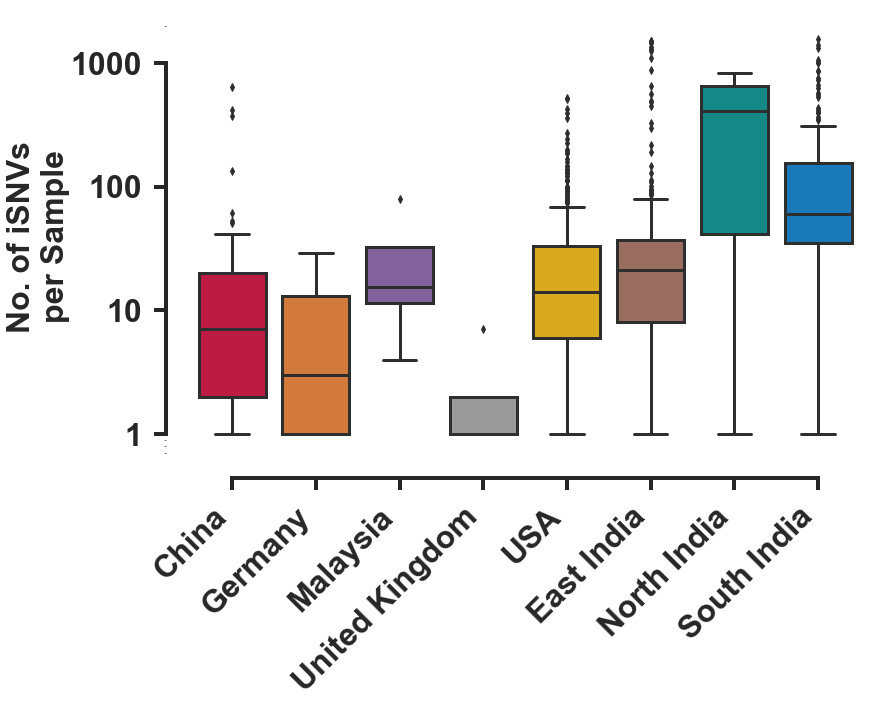

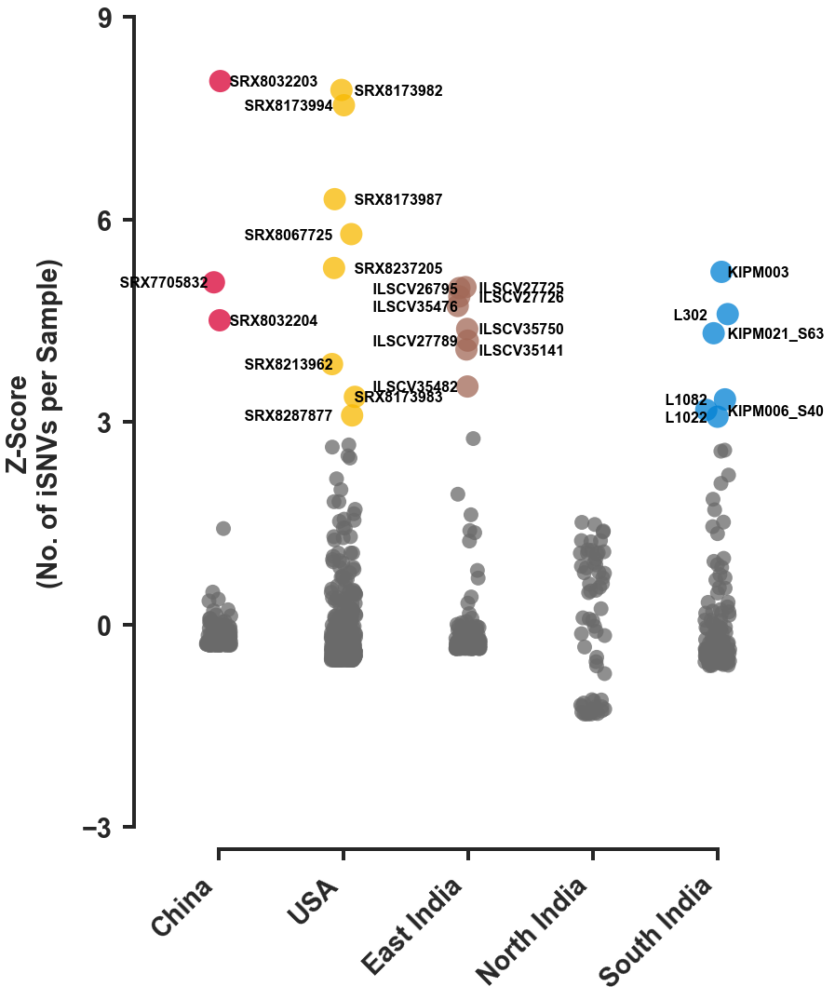

In [32]:
"""
Total Events per Sample per Cohort
"""

dfEventsPerSamplesPerCohort = pd.DataFrame(columns=["Cohort", "Sample", "No. of Events"], dtype=float)
i = 0

df = {}

for region in regionsAll:
    df[region] = pd.DataFrame()
    
    dfTemp = pd.read_csv("../output/REDItools2/regions/" + region + "/Frequencies.tsv", sep="\t").set_index(["Position", "Reference", "Sub"])
    dfTemp = dfTemp.iloc[:,:(len(dfTemp.columns) - noOfExtraColumnsEnd)]
    dfTemp = dfTemp[dfTemp <= cutoffFreq]
    
    if df[region].empty:
        df[region] = dfTemp
    else:
        df[region] = pd.concat([df[region], dfTemp], axis=1)
            
    df[region] = df[region].dropna(axis=0, how="all")
    df[region] = df[region].dropna(axis=1, how="all")
    
for cohort in cohorts:
    df[cohort] = pd.DataFrame()
    
    for subCohort in cohorts[cohort]:
        dfTemp = pd.read_csv("../output/REDItools2/cohorts/" + subCohort + "/Frequencies.tsv", sep="\t").set_index(["Position", "Reference", "Sub"])
        dfTemp = dfTemp.iloc[:,:(len(dfTemp.columns) - noOfExtraColumnsEnd)]
        dfTemp = dfTemp[dfTemp <= cutoffFreq]

        if df[cohort].empty:
            df[cohort] = dfTemp
        else:
            df[cohort] = pd.concat([df[cohort], dfTemp], axis=1)
            
    df[cohort] = df[cohort].dropna(axis=0, how="all")
    df[cohort] = df[cohort].dropna(axis=1, how="all")

for cohort in df:
    for index, value in df[cohort].count().items():
        dfEventsPerSamplesPerCohort.loc[i] = [cohort, index, value]
        i = i + 1

for cohort in df:
    dfEventsPerSamplesPerCohort.loc[dfEventsPerSamplesPerCohort["Cohort"] == cohort, "Z-Score"] = stats.zscore(dfEventsPerSamplesPerCohort.loc[dfEventsPerSamplesPerCohort["Cohort"] == cohort, "No. of Events"])
    
fig, ax = plt.subplots(figsize=(12,8))
sns.boxplot(ax=ax, x="Cohort", y="No. of Events", data=dfEventsPerSamplesPerCohort, order=regionsAll+[i for i in cohorts], palette=[colorPalette[i] for i in [0,1,6,8,2,7,3,4]], linewidth=3)

ax.set_yscale("log")

ax.set_xlabel("")
ax.set_ylabel("No. of iSNVs\nper Sample", fontsize=labelSize)
ax.get_yaxis().set_label_coords(-0.18,0.5)

ax.set_xticklabels(["China", "Germany", "Malaysia", "United Kingdom", "USA", "East India", "North India", "South India"])
ax.set_yticks([1,10,100,1000])
ax.set_yticklabels(["1","10","100","1000"])

for axis in ["bottom","left"]:
    ax.spines[axis].set_linewidth(spineWidth)
ax.tick_params(labelsize=tickLabelSize, length=tickLength, width=tickWidth)
sns.despine(trim=True, offset=axisOffset)

ax.tick_params(axis="x", rotation=45)

for i in ax.get_xticklabels(which="major"):
    i.set_ha("right")

plt.show()

fig, ax = plt.subplots(figsize=(12,16))
sns.stripplot(ax=ax, x="Cohort", y="Z-Score", data=dfEventsPerSamplesPerCohort[dfEventsPerSamplesPerCohort["Z-Score"] <= 3], order=["China", "USA", "East", "North", "South"], palette=[colorPalette[-1]], size=16, alpha=.75, dodge=True)
g = sns.stripplot(ax=ax, x="Cohort", y="Z-Score", data=dfEventsPerSamplesPerCohort[dfEventsPerSamplesPerCohort["Z-Score"] > 3], order=["China", "USA", "East", "North", "South"], palette=[regionPalette["China"], regionPalette["USA"], cohortPalette["East"], cohortPalette["North"], cohortPalette["South"]], size=24, alpha=.75, dodge=True)

left = 1
for i in range(len(["China", "USA", "East", "North", "South"])):
    for index, row in dfEventsPerSamplesPerCohort[(dfEventsPerSamplesPerCohort["Z-Score"] > 3) & (dfEventsPerSamplesPerCohort["Cohort"] == ["China", "USA", "East", "North", "South"][i])].sort_values(by=["Z-Score"]).iterrows():
        g.text(x=i+(0.05 if left == 1 else -0.05), y=row["Z-Score"]-0.075, s=" " + row["Sample"] + " ", horizontalalignment=("left" if left == 1 else "right"), size=16, color="black")
        left = left*(-1)

ax.set_ylim([-3,9])
ax.set_yticks([-3,0,3,6,9])

ax.set_xlabel("")
ax.set_ylabel("Z-Score\n(No. of iSNVs per Sample)", fontsize=labelSize*0.9)
ax.get_yaxis().set_label_coords(-0.15,0.5)

ax.set_xticklabels(["China", "USA", "East India", "North India", "South India"])

for axis in ["bottom","left"]:
    ax.spines[axis].set_linewidth(spineWidth)
ax.tick_params(labelsize=tickLabelSize*0.9, length=tickLength, width=tickWidth)
sns.despine(trim=True, offset=axisOffset)

ax.tick_params(axis="x", rotation=45)

for i in ax.get_xticklabels(which="major"):
    i.set_ha("right")

plt.show()


('2 Sample t-test: China vs USA', Ttest_indResult(statistic=-1.3464373981740771, pvalue=0.1787703267388165))
('2 Sample t-test: China vs India', Ttest_indResult(statistic=-5.260972176675316, pvalue=2.0723516900746646e-07))
('2 Sample t-test: USA vs India', Ttest_indResult(statistic=-8.75349144361324, pvalue=1.2078906865519938e-17))


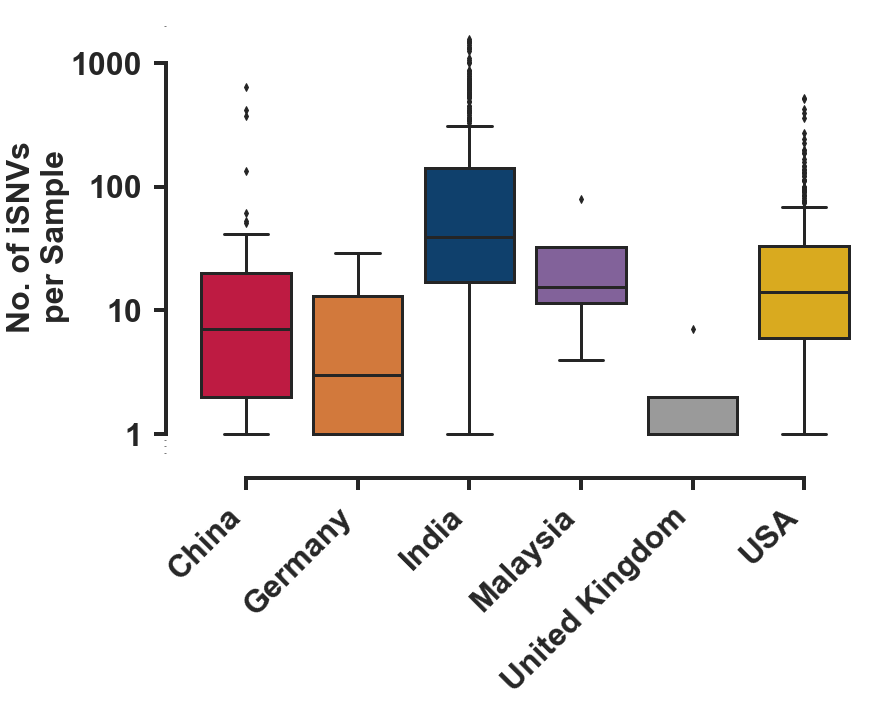

In [58]:
"""
Total Events per Sample per Cohort
"""

dfEventsPerSamplesPerRegion = pd.DataFrame(columns=["Region", "Sample", "No. of Events"], dtype=float)
i = 0

df = {}

for region in regionsDetailed:
    df[region] = pd.DataFrame()
    
    for subRegion in regionsDetailed[region]:
        try:
            dfTemp = pd.read_csv("../output/REDItools2/regions/" + subRegion + "/Frequencies.tsv", sep="\t").set_index(["Position", "Reference", "Sub"])
        except:
            dfTemp = pd.read_csv("../output/REDItools2/cohorts/" + subRegion + "/Frequencies.tsv", sep="\t").set_index(["Position", "Reference", "Sub"])
        dfTemp = dfTemp.iloc[:,:(len(dfTemp.columns) - noOfExtraColumnsEnd)]
        dfTemp = dfTemp[dfTemp <= cutoffFreq]

        if df[region].empty:
            df[region] = dfTemp
        else:
            df[region] = pd.concat([df[region], dfTemp], axis=1)
            
    df[region] = df[region].dropna(axis=0, how="all")
    df[region] = df[region].dropna(axis=1, how="all")

for region in df:
    for index, value in df[region].count().items():
        dfEventsPerSamplesPerRegion.loc[i] = [region, index, value]
        i = i + 1

for region in df:
    dfEventsPerSamplesPerRegion.loc[dfEventsPerSamplesPerRegion["Region"] == region, "Z-Score"] = stats.zscore(dfEventsPerSamplesPerRegion.loc[dfEventsPerSamplesPerRegion["Region"] == region, "No. of Events"])
    
print("2 Sample t-test: China vs USA", stats.ttest_ind(dfEventsPerSamplesPerRegion[dfEventsPerSamplesPerRegion["Region"] == "China"]["No. of Events"], dfEventsPerSamplesPerRegion[dfEventsPerSamplesPerRegion["Region"] == "USA"]["No. of Events"]))
print("2 Sample t-test: China vs India", stats.ttest_ind(dfEventsPerSamplesPerRegion[dfEventsPerSamplesPerRegion["Region"] == "China"]["No. of Events"], dfEventsPerSamplesPerRegion[dfEventsPerSamplesPerRegion["Region"] == "India"]["No. of Events"]))
print("2 Sample t-test: USA vs India", stats.ttest_ind(dfEventsPerSamplesPerRegion[dfEventsPerSamplesPerRegion["Region"] == "USA"]["No. of Events"], dfEventsPerSamplesPerRegion[dfEventsPerSamplesPerRegion["Region"] == "India"]["No. of Events"]))
    
fig, ax = plt.subplots(figsize=(12,8))
sns.boxplot(ax=ax, x="Region", y="No. of Events", data=dfEventsPerSamplesPerRegion, order=["China", "Germany", "India", "Malaysia", "United-Kingdom", "USA"], palette=[colorPalette[i] for i in [0,1,5,6,8,2]], linewidth=3)

ax.set_yscale("log")

ax.set_xlabel("")
ax.set_ylabel("No. of iSNVs\nper Sample", fontsize=labelSize)
ax.get_yaxis().set_label_coords(-0.18,0.5)

ax.set_xticklabels(["China", "Germany", "India", "Malaysia", "United Kingdom", "USA"])
ax.set_yticks([1,10,100,1000])
ax.set_yticklabels(["1","10","100","1000"])

for axis in ["bottom","left"]:
    ax.spines[axis].set_linewidth(spineWidth)
ax.tick_params(labelsize=tickLabelSize, length=tickLength, width=tickWidth)
sns.despine(trim=True, offset=axisOffset)

ax.tick_params(axis="x", rotation=45)

for i in ax.get_xticklabels(which="major"):
    i.set_ha("right")

plt.show()


India


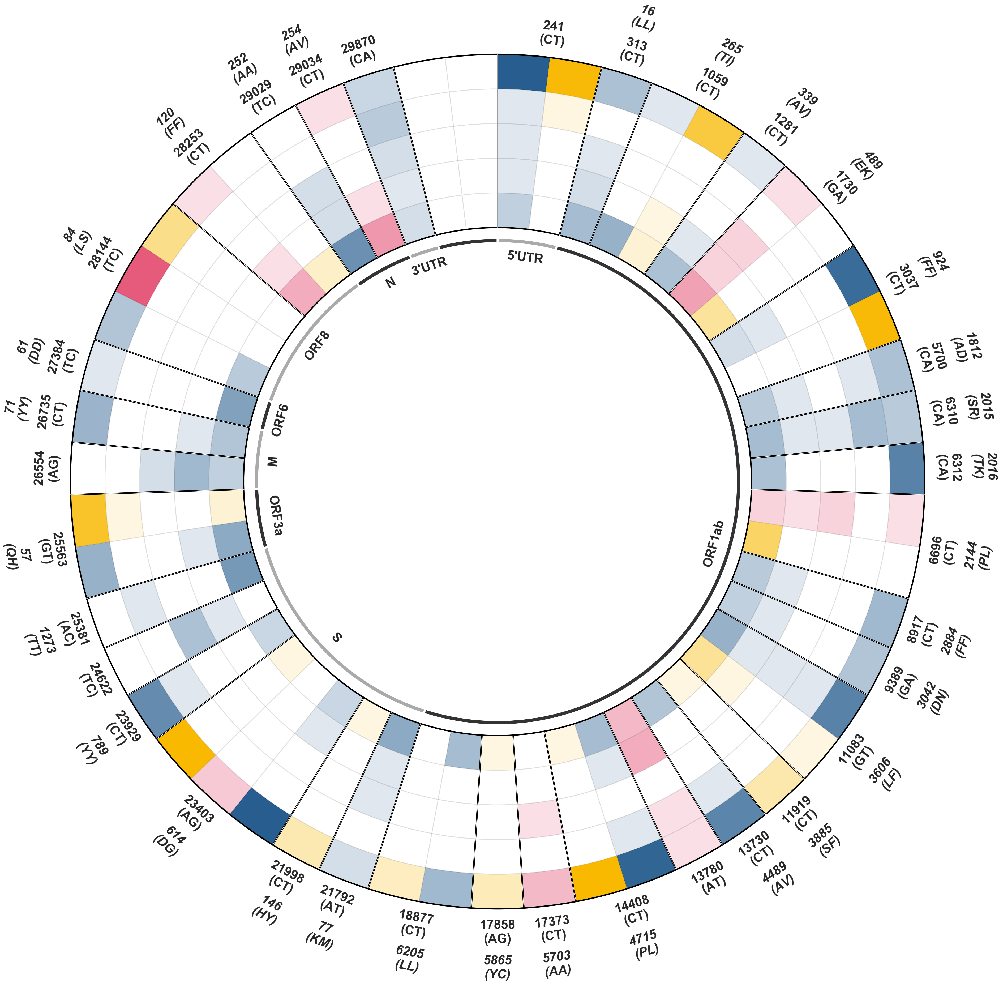

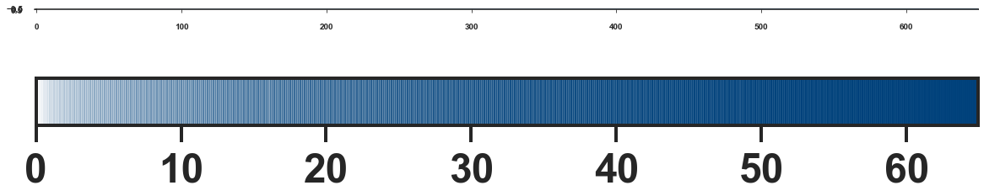

China


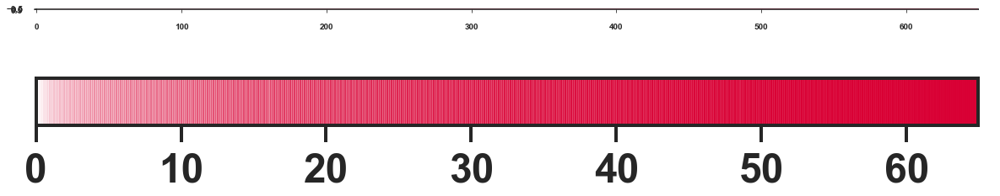

USA


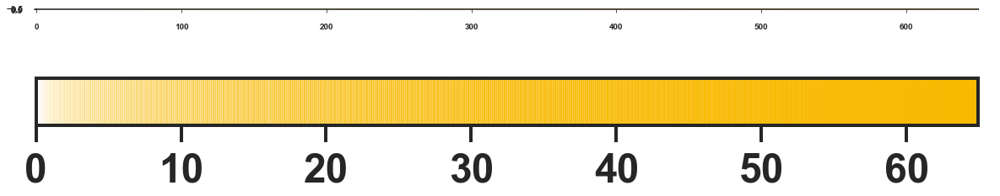

In [538]:
"""
Radial heatmap for Regions
"""

df = {}
dfAnn = pd.read_csv("../output/REDItools2/All_Sites_Annotated.tsv", sep="\t")

for region in regions:
    dfStats = pd.DataFrame()
    df[region] = pd.DataFrame()
    
    for subRegion in regions[region]:
        if dfStats.empty:
            try:
                dfStats = pd.read_csv("../data/samples/regions/" + subRegion + "/Stats.tsv", sep="\t")
            except:
                dfStats = pd.read_csv("../data/samples/cohorts/" + subRegion + "/Stats.tsv", sep="\t")
        else:
            try:
                dfStats = dfStats.append(pd.read_csv("../data/samples/regions/" + subRegion + "/Stats.tsv", sep="\t"), ignore_index=True)
            except:
                dfStats = dfStats.append(pd.read_csv("../data/samples/cohorts/" + subRegion + "/Stats.tsv", sep="\t"), ignore_index=True)
        
        try:
            dfTemp = pd.read_csv("../output/REDItools2/regions/" + subRegion + "/Frequencies.tsv", sep="\t").set_index(["Position", "Reference", "Sub"])
        except:
            dfTemp = pd.read_csv("../output/REDItools2/cohorts/" + subRegion + "/Frequencies.tsv", sep="\t").set_index(["Position", "Reference", "Sub"])

        if df[region].empty:
            dfTemp = dfTemp.iloc[:,:(len(dfTemp.columns) - noOfExtraColumnsEnd)]
            df[region] = dfTemp
        else:
            dfTemp = dfTemp.iloc[:,:(len(dfTemp.columns) - noOfExtraColumnsEnd)]
            df[region] = pd.concat([df[region], dfTemp], axis=1)
    
    df[region]["Count"] = df[region].fillna(0).astype(bool).sum(axis=1)
    df[region] = df[region].sort_values("Count", ascending=False)
    df[region] = df[region][df[region]["Count"] >= df[region].head(len(df[region].head(int(len(df[region])*topPositions))) if len(df[region].head(int(len(df[region])*topPositions))) > minTopPositions else minTopPositions).tail(1)["Count"].values[0]].iloc[:,:-1]
    df[region].drop(df[region].columns[df[region].isnull().all(0)], axis=1, inplace=True)
        
    # Calculate and add bins
    for i in range(0, len(bins)-1):
        df[region][round((bins[i] + bins[i+1])/2, 1)] = ((df[region][(df[region] > bins[i]) & (df[region] <= bins[i+1])].count(axis=1)/len(dfStats[(dfStats["BWA-MEM SARS-CoV-2 Mapped Reads"] != "-") & (dfStats["BWA-MEM SARS-CoV-2 Mapped Reads"] >= minSARSCoV2Reads)]))*100).round()

    # Reshape dataframe
    df[region] = df[region].reset_index()
    df[region] = df[region].iloc[:, np.r_[0, 2, -(len(bins)-1):0]]
    df[region] = pd.melt(df[region], id_vars=["Position", "Sub"], var_name="Freq", value_name="SamplePercent")
    df[region]["Region"] = region

# Filter positions and generate consensus dataframe
impPos = sorted(set.union(*[set(l) for l in [df[region][["Position", "Sub"]].apply(tuple, axis=1).tolist() for region in regions]]), key=lambda x: x[0])
dfImp = pd.concat([df[region][pd.Series(zip(df[region]["Position"], df[region]["Sub"])).isin(impPos)] for region in regions]).reset_index()

# Drop non-interesting positions
dropPos = []
for i in impPos:
    flag = 0
    
    # Atleast 1 bin with sample percentage >= 5
    if ((dfImp[(dfImp["Position"] == i[0]) & (dfImp["Sub"] == i[1])]["SamplePercent"] >= 5).values.sum() >= 1):
        # Atleast 1 bin with sample percentage > 0 outside the inner 2 bins
        if ((dfImp[(dfImp["Position"] == i[0]) & (dfImp["Sub"] == i[1]) & (dfImp["Freq"] != round((bins[0] + bins[1])/2, 1)) & (dfImp["Freq"] != round((bins[1] + bins[2])/2, 1))]["SamplePercent"] != 0).values.sum() >= 1):
            flag = 1
        # Atleast 1 bin with sample percentage >= 10 in the inner 2 bins
        elif ((dfImp[(dfImp["Position"] == i[0]) & (dfImp["Sub"] == i[1]) & (dfImp["Freq"] == round((bins[1] + bins[2])/2, 1))]["SamplePercent"] >= 10).values.sum() >= 1):
            flag = 1
    if flag == 1:
        # Both innermost and outermost bins with sample percentage > 0
        if ((dfImp[(dfImp["Position"] == i[0]) & (dfImp["Sub"] == i[1]) & (dfImp["Freq"] == round((bins[0] + bins[1])/2, 1))]["SamplePercent"] != 0).values.sum() >= 1) and ((dfImp[(dfImp["Position"] == i[0]) & (dfImp["Sub"] == i[1]) & (dfImp["Freq"] == round((bins[-1] + bins[-2])/2, 1))]["SamplePercent"] != 0).values.sum() >= 1):
            flag = 1
        # Atleast 1 bin with sample percentage > 0 excluding innermost and outermost bins
        elif (dfImp[(dfImp["Position"] == i[0]) & (dfImp["Sub"] == i[1]) & (dfImp["Freq"] != round((bins[0] + bins[1])/2, 1)) & (dfImp["Freq"] != round((bins[-1] + bins[-2])/2, 1))]["SamplePercent"] != 0).values.sum() >= 1:
            flag = 1
        else:
            flag = 0
    if flag == 0:
        dropPos.append(i)
        dfImp.drop(dfImp[(dfImp["Position"] == i[0]) & (dfImp["Sub"] == i[1])].index, inplace=True)
for i in dropPos:
    impPos.remove(i)

# Plot
fig, ax = plt.subplots(figsize=(4,4))
ax.axis("equal")

for i in range(len(bins)-1):
    binVal = round((bins[i] + bins[i+1])/2, 1)
    dfTemp = []
    
    for j in impPos:
        for k in regions:
            dfTemp.append(dfImp.loc[(dfImp["Freq"] == binVal) & (dfImp["Position"] == j[0]) & (dfImp["Sub"] == j[1]) & (dfImp["Region"] == k), :])
    dfTemp = pd.concat(dfTemp)

    wedges, texts = ax.pie([1]*(len(dfTemp)+2), radius=pltSize-((len(bins)-i-1)*wedgeSize), counterclock=False, startangle=-270,
            colors=[regionPalette[row["Region"]] + hex(int(((row["SamplePercent"]/max(dfImp["SamplePercent"]))**(1.0/colorBarFactor))*255))[-2:] if len(hex(int(((row["SamplePercent"]/max(dfImp["SamplePercent"]))**(1.0/colorBarFactor))*255))) == 4 else regionPalette[row["Region"]] + "0" + hex(int(((row["SamplePercent"]/max(dfImp["SamplePercent"]))**(1.0/colorBarFactor))*255))[-1:] for index, row in dfTemp.iterrows()] + ["#FFFFFF00","#FFFFFF00"],
            wedgeprops=dict(width=wedgeSize, edgecolor="#00000011", linewidth=wedgeSize*2)
          )

# Position Labels
wedges, texts = ax.pie([dfImp.loc[dfImp["Freq"] == round((bins[0] + bins[1])/2, 1),"Position"].values.tolist().count(i[0]) for i in impPos]+[2],
        radius=pltSize-wedgeSize, counterclock=False, startangle=-270,
        labels=[str(index[0]) + "\n(" + index[1] + ")" for index, row in dfImp.groupby(["Position", "Sub"]).size().iteritems()]+[""],
        labeldistance=1.025, rotatelabels=True,
        colors=["#FFFFFF00"],
        wedgeprops=dict(width=wedgeSize*(len(bins)-1), edgecolor="black", linewidth=wedgeSize*3.5),
        textprops=dict(rotation_mode="anchor", ha="center", va="center")
      )

for t in texts:
    rotation = t.get_rotation()
    t.set_rotation(rotation+90+(1-rotation//180)*180)
    t.set_fontsize(48)
    
# AA Change Labels
wedges, texts = ax.pie([dfImp.loc[dfImp["Freq"] == round((bins[0] + bins[1])/2, 1),"Position"].values.tolist().count(i[0]) for i in impPos]+[2],
        radius=pltSize, counterclock=False, startangle=-270,
        labels=[(m + "\n(" + list(n)[0] + list(n)[-1]) + ")" if len(list(n)) != 0 else "" for m,n in zip([filter(str.isdigit, "".join([dfAnn[(dfAnn["Position"] == i[0]) & (dfAnn["Sub"] == i[1])]["Amino acids change"].values[0].split("; ")[dfAnn[(dfAnn["Position"] == i[0]) & (dfAnn["Sub"] == i[1])]["Variation Codons"].values[0].split("; ").index(var)].split(".")[-1] for var in dfAnn[(dfAnn["Position"] == i[0]) & (dfAnn["Sub"] == i[1])]["Variation Codons"].values[0].split("; ") if "".join(re.findall("([A-Z])", var)) == i[1]])) if not pd.isnull(dfAnn[(dfAnn["Position"] == i[0]) & (dfAnn["Sub"] == i[1])]["Variation Codons"].values[0]) else "" for i in impPos],[filter(str.isalpha, "".join([dfAnn[(dfAnn["Position"] == i[0]) & (dfAnn["Sub"] == i[1])]["Amino acids change"].values[0].split("; ")[dfAnn[(dfAnn["Position"] == i[0]) & (dfAnn["Sub"] == i[1])]["Variation Codons"].values[0].split("; ").index(var)].split(".")[-1] for var in dfAnn[(dfAnn["Position"] == i[0]) & (dfAnn["Sub"] == i[1])]["Variation Codons"].values[0].split("; ") if "".join(re.findall("([A-Z])", var)) == i[1]])) if not pd.isnull(dfAnn[(dfAnn["Position"] == i[0]) & (dfAnn["Sub"] == i[1])]["Variation Codons"].values[0]) else "" for i in impPos])]+[""],
        labeldistance=1.025, rotatelabels=True,
        colors=["#FFFFFF00"],
        wedgeprops=dict(edgecolor=None),
        textprops=dict(rotation_mode="anchor", ha="center", va="center")
      )

for t in texts:
    rotation = t.get_rotation()
    t.set_rotation(rotation+90+(1-rotation//180)*180)
    t.set_fontsize(48)
    t.set_fontstyle("italic")
    
# Gene Labels
wedges, texts = ax.pie([[i for j in [a for a,f in zip([i[0] for i in impPos], [dfImp.loc[dfImp["Freq"] == round((bins[0] + bins[1])/2, 1),"Position"].values.tolist().count(i[0]) for i in impPos]) for _ in range(f)] for i in SARSCoV2Genes if (j>=SARSCoV2Genes[i][0]) and (j<=SARSCoV2Genes[i][1])].count(k) for k in list(OrderedDict.fromkeys([i for j in [a for a,f in zip([i[0] for i in impPos], [dfImp.loc[dfImp["Freq"] == round((bins[0] + bins[1])/2, 1),"Position"].values.tolist().count(i[0]) for i in impPos]) for _ in range(f)] for i in SARSCoV2Genes if (j>=SARSCoV2Genes[i][0]) and (j<=SARSCoV2Genes[i][1])]))]+[2],
        radius=pltSize-(6.3*wedgeSize), counterclock=False, startangle=-270,
        labels=list(OrderedDict.fromkeys([i for j in [a for a,f in zip([i[0] for i in impPos], [dfImp.loc[dfImp["Freq"] == round((bins[0] + bins[1])/2, 1),"Position"].values.tolist().count(i[0]) for i in impPos]) for _ in range(f)] for i in SARSCoV2Genes if (j>=SARSCoV2Genes[i][0]) and (j<=SARSCoV2Genes[i][1])]))+[""],
        labeldistance=0.9, rotatelabels=True,
        colors=["#AAAAAA", "#333333"],
        wedgeprops=dict(width=wedgeSize*.15, edgecolor="white", linewidth=wedgeSize*5),
        textprops=dict(rotation_mode="anchor", ha="center", va="center")
      )

for t in texts:
    rotation = t.get_rotation()
    t.set_rotation(rotation+90+(1-rotation//180)*180)
    t.set_fontsize(48)

# plt.show()

plt.savefig("/Users/pxthxk/Desktop/1.png")

# Color Bar
for region in regionPalette:
    print(region)
    fig, ax = plt.subplots(figsize=(20,10))

    colorBar = [regionPalette[region] + hex(int(((i/max(dfImp["SamplePercent"]))**(1.0/colorBarFactor))*255))[-2:] if len(hex(int(((i/max(dfImp["SamplePercent"]))**(1.0/colorBarFactor))*255))) == 4 else regionPalette[region] + "0" + hex(int(((i/max(dfImp["SamplePercent"]))**(1.0/colorBarFactor))*255))[-1:] for i in np.arange(0,int(max(dfImp["SamplePercent"]))+1,1)]
    cm = LinearSegmentedColormap.from_list(np.arange(0,int(max(dfImp["SamplePercent"])),.1), colorBar, N=len(np.arange(0,int(max(dfImp["SamplePercent"])),.1)))
    img = plt.imshow(np.array([np.arange(0,int(max(dfImp["SamplePercent"])),.1)]), cmap=cm)
    
    cbar = plt.colorbar(orientation="horizontal")
    cbar.ax.tick_params(labelsize=48, length=20, width=tickWidth)
    cbar.outline.set_linewidth(spineWidth)
        
    plt.show()


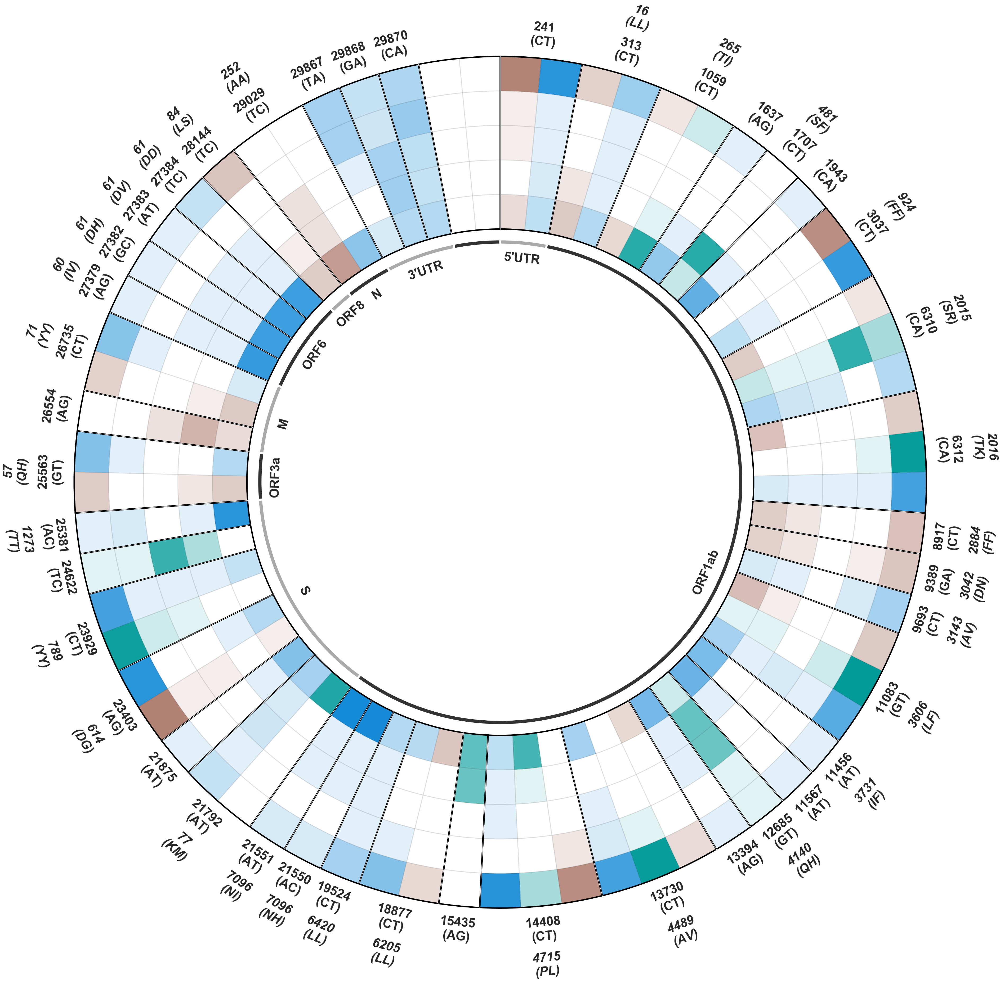

East


<Figure size 432x288 with 0 Axes>

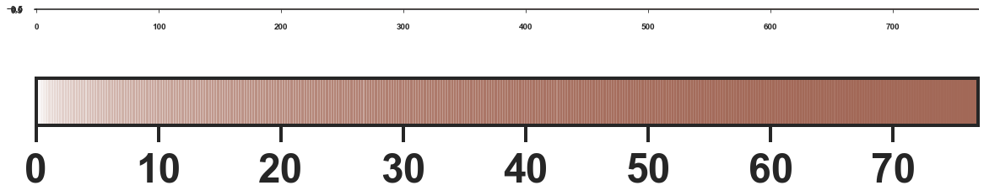

North


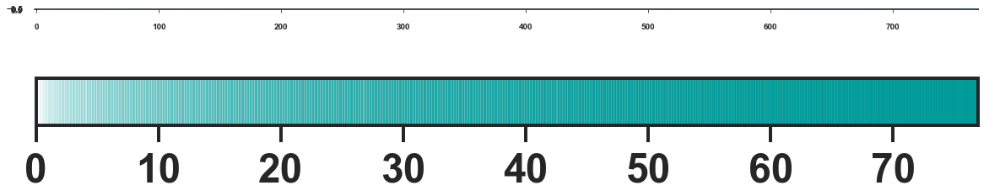

South


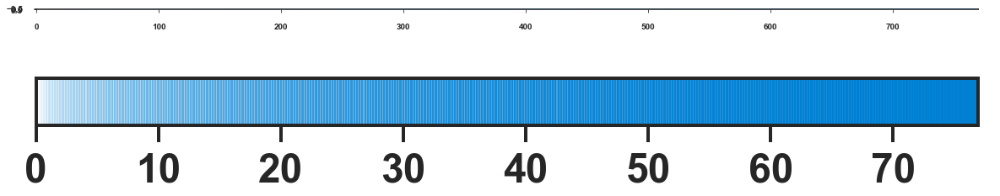

In [539]:
"""
Radial heatmap for Cohorts
"""

df = {}
dfAnn = pd.read_csv("../output/REDItools2/All_Sites_Annotated.tsv", sep="\t")

for cohort in cohorts:
    dfStats = pd.DataFrame()
    df[cohort] = pd.DataFrame()
    
    for subCohort in cohorts[cohort]:
        if dfStats.empty:
            dfStats = pd.read_csv("../data/samples/cohorts/" + subCohort + "/Stats.tsv", sep="\t")
        else:
            dfStats = dfStats.append(pd.read_csv("../data/samples/cohorts/" + subCohort + "/Stats.tsv", sep="\t"), ignore_index=True)
            
        if df[cohort].empty:
            dfTemp = pd.read_csv("../output/REDItools2/cohorts/" + subCohort + "/Frequencies.tsv", sep="\t").set_index(["Position", "Reference", "Sub"])
            dfTemp = dfTemp.iloc[:,:(len(dfTemp.columns) - noOfExtraColumnsEnd)]
            df[cohort] = dfTemp
        else:
            dfTemp = pd.read_csv("../output/REDItools2/cohorts/" + subCohort + "/Frequencies.tsv", sep="\t").set_index(["Position", "Reference", "Sub"])
            dfTemp = dfTemp.iloc[:,:(len(dfTemp.columns) - noOfExtraColumnsEnd)]
            df[cohort] = pd.concat([df[cohort], dfTemp], axis=1)
    
    df[cohort]["Count"] = df[cohort].fillna(0).astype(bool).sum(axis=1)
    df[cohort] = df[cohort].sort_values("Count", ascending=False)
    df[cohort] = df[cohort][df[cohort]["Count"] >= df[cohort].head(len(df[cohort].head(int(len(df[cohort])*topPositions))) if len(df[cohort].head(int(len(df[cohort])*topPositions))) > minTopPositions else minTopPositions).tail(1)["Count"].values[0]].iloc[:,:-1]
    df[cohort].drop(df[cohort].columns[df[cohort].isnull().all(0)], axis=1, inplace=True)
        
    # Calculate and add bins
    for i in range(0, len(bins)-1):
        df[cohort][round((bins[i] + bins[i+1])/2, 1)] = ((df[cohort][(df[cohort] > bins[i]) & (df[cohort] <= bins[i+1])].count(axis=1)/len(dfStats[(dfStats["BWA-MEM SARS-CoV-2 Mapped Reads"] != "-") & (dfStats["BWA-MEM SARS-CoV-2 Mapped Reads"] >= minSARSCoV2Reads)]))*100).round()

    # Reshape dataframe
    df[cohort] = df[cohort].reset_index()
    df[cohort] = df[cohort].iloc[:, np.r_[0, 2, -(len(bins)-1):0]]
    df[cohort] = pd.melt(df[cohort], id_vars=["Position", "Sub"], var_name="Freq", value_name="SamplePercent")
    df[cohort]["Cohort"] = cohort

# Filter positions and generate consensus dataframe
impPos = sorted(set.union(*[set(l) for l in [df[cohort][["Position", "Sub"]].apply(tuple, axis=1).tolist() for cohort in cohorts]]), key=lambda x: x[0])
dfImp = pd.concat([df[cohort][pd.Series(zip(df[cohort]["Position"], df[cohort]["Sub"])).isin(impPos)] for cohort in cohorts]).reset_index()

# Drop non-interesting positions
dropPos = []
for i in impPos:
    flag = 0
    
    # Atleast 1 bin with sample percentage >= 10
    if ((dfImp[(dfImp["Position"] == i[0]) & (dfImp["Sub"] == i[1])]["SamplePercent"] >= 10).values.sum() >= 1):
        # Atleast 1 bin with sample percentage > 0 outside the inner 2 bins
        if ((dfImp[(dfImp["Position"] == i[0]) & (dfImp["Sub"] == i[1]) & (dfImp["Freq"] != round((bins[0] + bins[1])/2, 1)) & (dfImp["Freq"] != round((bins[1] + bins[2])/2, 1))]["SamplePercent"] != 0).values.sum() >= 1):
            flag = 1
        # Atleast 1 bin with sample percentage >= 20 in the inner 2 bins
        elif ((dfImp[(dfImp["Position"] == i[0]) & (dfImp["Sub"] == i[1]) & (dfImp["Freq"] == round((bins[1] + bins[2])/2, 1))]["SamplePercent"] >= 20).values.sum() >= 1):
            flag = 1
    if flag == 1:
        # Both innermost and outermost bins with sample percentage > 0
        if ((dfImp[(dfImp["Position"] == i[0]) & (dfImp["Sub"] == i[1]) & (dfImp["Freq"] == round((bins[0] + bins[1])/2, 1))]["SamplePercent"] != 0).values.sum() >= 1) and ((dfImp[(dfImp["Position"] == i[0]) & (dfImp["Sub"] == i[1]) & (dfImp["Freq"] == round((bins[-1] + bins[-2])/2, 1))]["SamplePercent"] != 0).values.sum() >= 1):
            flag = 1
        # Atleast 1 bin with sample percentage > 0 excluding innermost and outermost bins
        elif (dfImp[(dfImp["Position"] == i[0]) & (dfImp["Sub"] == i[1]) & (dfImp["Freq"] != round((bins[0] + bins[1])/2, 1)) & (dfImp["Freq"] != round((bins[-1] + bins[-2])/2, 1))]["SamplePercent"] != 0).values.sum() >= 1:
            flag = 1
        else:
            flag = 0
    if flag == 0:
        dropPos.append(i)
        dfImp.drop(dfImp[(dfImp["Position"] == i[0]) & (dfImp["Sub"] == i[1])].index, inplace=True)
for i in dropPos:
    impPos.remove(i)

# Plot
fig, ax = plt.subplots(figsize=(4,4))
ax.axis("equal")

for i in range(len(bins)-1):
    binVal = round((bins[i] + bins[i+1])/2, 1)
    dfTemp = []
    
    for j in impPos:
        for k in cohorts:
            dfTemp.append(dfImp.loc[(dfImp["Freq"] == binVal) & (dfImp["Position"] == j[0]) & (dfImp["Sub"] == j[1]) & (dfImp["Cohort"] == k), :])
    dfTemp = pd.concat(dfTemp)

    wedges, texts = ax.pie([1]*(len(dfTemp)+2), radius=pltSize-((len(bins)-i-1)*wedgeSize), counterclock=False, startangle=-270,
            colors=[cohortPalette[row["Cohort"]] + hex(int(((row["SamplePercent"]/max(dfImp["SamplePercent"]))**(1.0/colorBarFactor))*255))[-2:] if len(hex(int(((row["SamplePercent"]/max(dfImp["SamplePercent"]))**(1.0/colorBarFactor))*255))) == 4 else cohortPalette[row["Cohort"]] + "0" + hex(int(((row["SamplePercent"]/max(dfImp["SamplePercent"]))**(1.0/colorBarFactor))*255))[-1:] for index, row in dfTemp.iterrows()] + ["#FFFFFF00","#FFFFFF00"],
            wedgeprops=dict(width=wedgeSize, edgecolor="#00000011", linewidth=wedgeSize*2)
          )

# Position Labels
wedges, texts = ax.pie([dfImp.loc[dfImp["Freq"] == round((bins[0] + bins[1])/2, 1),"Position"].values.tolist().count(i[0]) for i in impPos]+[2],
        radius=pltSize-wedgeSize, counterclock=False, startangle=-270,
        labels=[str(index[0]) + "\n(" + index[1] + ")" for index, row in dfImp.groupby(["Position", "Sub"]).size().iteritems()]+[""],
        labeldistance=1.025, rotatelabels=True,
        colors=["#FFFFFF00"],
        wedgeprops=dict(width=wedgeSize*(len(bins)-1), edgecolor="black", linewidth=wedgeSize*3.5),
        textprops=dict(rotation_mode="anchor", ha="center", va="center")
      )

for t in texts:
    rotation = t.get_rotation()
    t.set_rotation(rotation+90+(1-rotation//180)*180)
    t.set_fontsize(48)
    
# AA Change Labels
wedges, texts = ax.pie([dfImp.loc[dfImp["Freq"] == round((bins[0] + bins[1])/2, 1),"Position"].values.tolist().count(i[0]) for i in impPos]+[2],
        radius=pltSize, counterclock=False, startangle=-270,
        labels=[(m + "\n(" + list(n)[0] + list(n)[-1]) + ")" if len(list(n)) != 0 else "" for m,n in zip([filter(str.isdigit, "".join([dfAnn[(dfAnn["Position"] == i[0]) & (dfAnn["Sub"] == i[1])]["Amino acids change"].values[0].split("; ")[dfAnn[(dfAnn["Position"] == i[0]) & (dfAnn["Sub"] == i[1])]["Variation Codons"].values[0].split("; ").index(var)].split(".")[-1] for var in dfAnn[(dfAnn["Position"] == i[0]) & (dfAnn["Sub"] == i[1])]["Variation Codons"].values[0].split("; ") if "".join(re.findall("([A-Z])", var)) == i[1]])) if not pd.isnull(dfAnn[(dfAnn["Position"] == i[0]) & (dfAnn["Sub"] == i[1])]["Variation Codons"].values[0]) else "" for i in impPos],[filter(str.isalpha, "".join([dfAnn[(dfAnn["Position"] == i[0]) & (dfAnn["Sub"] == i[1])]["Amino acids change"].values[0].split("; ")[dfAnn[(dfAnn["Position"] == i[0]) & (dfAnn["Sub"] == i[1])]["Variation Codons"].values[0].split("; ").index(var)].split(".")[-1] for var in dfAnn[(dfAnn["Position"] == i[0]) & (dfAnn["Sub"] == i[1])]["Variation Codons"].values[0].split("; ") if "".join(re.findall("([A-Z])", var)) == i[1]])) if not pd.isnull(dfAnn[(dfAnn["Position"] == i[0]) & (dfAnn["Sub"] == i[1])]["Variation Codons"].values[0]) else "" for i in impPos])]+[""],
        labeldistance=1.025, rotatelabels=True,
        colors=["#FFFFFF00"],
        wedgeprops=dict(edgecolor=None),
        textprops=dict(rotation_mode="anchor", ha="center", va="center")
      )

for t in texts:
    rotation = t.get_rotation()
    t.set_rotation(rotation+90+(1-rotation//180)*180)
    t.set_fontsize(48)
    t.set_fontstyle("italic")
    
# Gene Labels
wedges, texts = ax.pie([[i for j in [a for a,f in zip([i[0] for i in impPos], [dfImp.loc[dfImp["Freq"] == round((bins[0] + bins[1])/2, 1),"Position"].values.tolist().count(i[0]) for i in impPos]) for _ in range(f)] for i in SARSCoV2Genes if (j>=SARSCoV2Genes[i][0]) and (j<=SARSCoV2Genes[i][1])].count(k) for k in list(OrderedDict.fromkeys([i for j in [a for a,f in zip([i[0] for i in impPos], [dfImp.loc[dfImp["Freq"] == round((bins[0] + bins[1])/2, 1),"Position"].values.tolist().count(i[0]) for i in impPos]) for _ in range(f)] for i in SARSCoV2Genes if (j>=SARSCoV2Genes[i][0]) and (j<=SARSCoV2Genes[i][1])]))]+[2],
        radius=pltSize-(6.3*wedgeSize), counterclock=False, startangle=-270,
        labels=list(OrderedDict.fromkeys([i for j in [a for a,f in zip([i[0] for i in impPos], [dfImp.loc[dfImp["Freq"] == round((bins[0] + bins[1])/2, 1),"Position"].values.tolist().count(i[0]) for i in impPos]) for _ in range(f)] for i in SARSCoV2Genes if (j>=SARSCoV2Genes[i][0]) and (j<=SARSCoV2Genes[i][1])]))+[""],
        labeldistance=0.9, rotatelabels=True,
        colors=["#AAAAAA", "#333333"],
        wedgeprops=dict(width=wedgeSize*.15, edgecolor="white", linewidth=wedgeSize*5),
        textprops=dict(rotation_mode="anchor", ha="center", va="center")
      )

for t in texts:
    rotation = t.get_rotation()
    t.set_rotation(rotation+90+(1-rotation//180)*180)
    t.set_fontsize(48)

plt.show()

plt.savefig("/Users/pxthxk/Desktop/2.png")

# Color Bar
for cohort in cohortPalette:
    print(cohort)
    fig, ax = plt.subplots(figsize=(20,10))

    colorBar = [cohortPalette[cohort] + hex(int(((i/max(dfImp["SamplePercent"]))**(1.0/colorBarFactor))*255))[-2:] if len(hex(int(((i/max(dfImp["SamplePercent"]))**(1.0/colorBarFactor))*255))) == 4 else cohortPalette[cohort] + "0" + hex(int(((i/max(dfImp["SamplePercent"]))**(1.0/colorBarFactor))*255))[-1:] for i in np.arange(0,int(max(dfImp["SamplePercent"]))+1,1)]
    cm = LinearSegmentedColormap.from_list(np.arange(0,int(max(dfImp["SamplePercent"])),.1), colorBar, N=len(np.arange(0,int(max(dfImp["SamplePercent"])),.1)))
    img = plt.imshow(np.array([np.arange(0,int(max(dfImp["SamplePercent"])),.1)]), cmap=cm)
    
    cbar = plt.colorbar(orientation="horizontal")
    cbar.ax.tick_params(labelsize=48, length=20, width=tickWidth)
    cbar.outline.set_linewidth(spineWidth)
        
    plt.show()


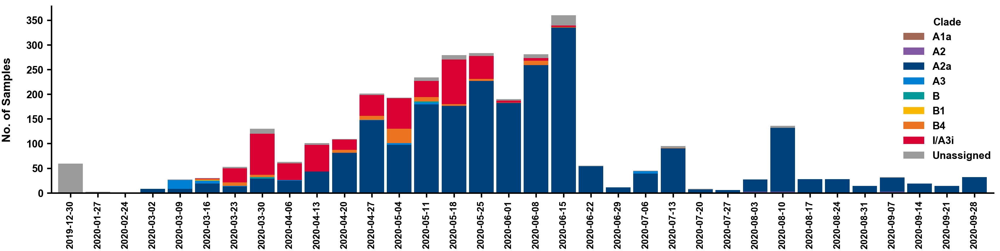

In [38]:
"""
Clade Distribution: India
"""

dfGEAR19 = pd.read_csv("../data/datasets/GEAR19_Metadata.tsv", sep="\t")
dfGEAR19["date"] = pd.to_datetime(dfGEAR19["date"])

dfGEAR19 = dfGEAR19.groupby([dfGEAR19["date"].dt.to_period("W"), "clade"]).count().unstack()
dfGEAR19.columns = dfGEAR19.columns.droplevel()

fig, ax = plt.subplots(figsize=(48,12))

dfGEAR19.plot(ax=ax, kind="bar", stacked=True, width=.9, color=[colorPalette[7-i] for i in range(0,8)] + [colorPalette[8]], linewidth=0)

ax.set_xlabel("")
ax.set_ylabel("No. of Samples\n", fontsize=labelSize*1.25)
ax.set_xticklabels([i.get_text().split("/")[0] for i in ax.get_xticklabels()])

ax.spines["bottom"].set_linewidth(spineWidth*1.25)
ax.spines["left"].set_linewidth(spineWidth*1.25)
ax.spines["top"].set_linewidth(0)
ax.spines["right"].set_linewidth(0)
ax.tick_params(axis="x", labelsize=tickLabelSize, length=tickLength*1.25, width=tickWidth*1.25)
ax.tick_params(axis="y", labelsize=tickLabelSize*1.1, length=tickLength*1.25, width=tickWidth*1.25)

legend = plt.legend(title="Clade", prop={"size": tickLabelSize*1.1}, loc=(0.9,0.15))
legend.get_frame().set_linewidth(0)
plt.setp(legend.get_title(), fontsize=tickLabelSize*1.1)

fig.tight_layout()

plt.show()

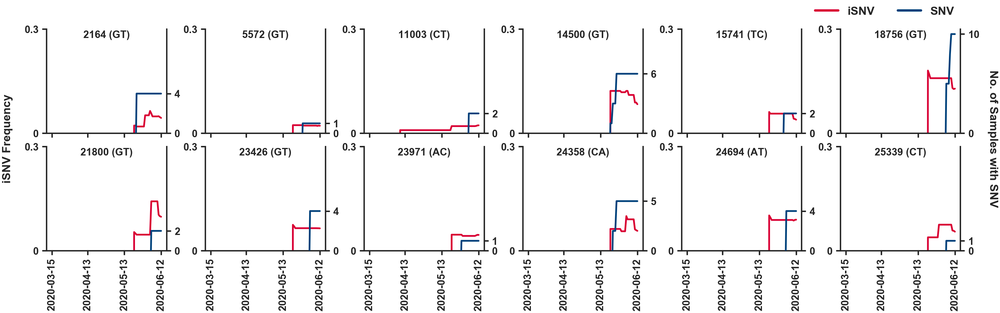

In [33]:
"""
Editing to SNP
"""

event = [(2164, "G", "GT"), (5572, "G", "GT"), (11003, "C", "CT"), (14500, "G", "GT"), (15741, "T", "TC"), (18756, "G", "GT"), (21800, "G", "GT"), (23426, "G", "GT"), (23971, "A", "AC"), (24358, "C", "CA"), (24694, "A", "AT"), (25339, "C", "CT")]

dfFreq = pd.read_csv("../output/REDItools2/cohorts/Odisha/Frequencies.tsv", sep="\t")
dfFreq = dfFreq.iloc[:,:(len(dfFreq.columns) - noOfExtraColumnsEnd)].set_index(["Position", "Reference", "Sub"])
dfFreq = dfFreq[dfFreq <= cutoffFreq]

dfFasta = pd.DataFrame(data={"pos": range(1,29904)}).set_index("pos")

with open("../data/datasets/metadata/Odisha_MSA.fasta", "r") as fastaFile:
    fastaFile = fastaFile.readlines()
    
    start = -1
    for i in range(0, len(fastaFile)):
        if fastaFile[i].startswith(">") or i == (len(fastaFile)-1):
            if start != -1:
                if i == (len(fastaFile)-1):
                    end = i + 1
                else:
                    end = i
                    
                sampleName = fastaFile[start].split(">")[1].rstrip()
                sampleData = fastaFile[start:end]
                sampleFasta = ""
                
                for j in range(1, len(sampleData)):
                    sampleFasta = sampleFasta + sampleData[j].rstrip()
                fastaArr = list(sampleFasta)

                if len(fastaArr) == 29903:
                    dfFasta[sampleName] = fastaArr
                else:
                    print(sampleName)
            start = i

fig, ax = plt.subplots(2, 6, figsize=(46,14), sharex=True)

index = 0
for i in range(0,2):
    for j in range(0,6):
        with open("../data/datasets/metadata/Odisha.json", "r") as metadata:
            metadata = json.load(metadata)
            
            # Sort samples by date and add data to dataframe
            colDates = list(set([metadata[k]["collection_date"] for k in metadata]))
            colDates = sorted(
                colDates,
                key=lambda k: datetime.strptime(k, "%Y-%m-%d")
            )

            d1 = datetime.strptime(colDates[0], "%Y-%m-%d")
            d2 = datetime.strptime(colDates[-1], "%Y-%m-%d")
            dateRange = [(d1 + timedelta(days=x)).strftime("%Y-%m-%d") for x in range((d2-d1).days + 1)]

            samples = []
            dataDf = pd.DataFrame(columns=["date", "editing", "snp"], dtype=float)
            for d in dateRange:
                for k in metadata:
                    if metadata[k]["collection_date"] == d:
                        if k in list(dfFreq.columns):
                            samples.append(k)
                dfTemp = dfFreq.loc[(event[index][0], event[index][1], event[index][2]), samples]
                dfTemp = dfTemp[dfTemp.notna()]

                if dfTemp.empty:
                    dataDf = dataDf.append({"date": d, "editing": 0, "snp": list(dfFasta.loc[event[index][0], samples].values).count(event[index][2].replace(event[index][1],"").lower())}, ignore_index=True)
                else:
                    dataDf = dataDf.append({"date": d, "editing": dfTemp.mean(), "snp": list(dfFasta.loc[event[index][0], samples].values).count(event[index][2].replace(event[index][1],"").lower())}, ignore_index=True)
            dataDf.loc[dataDf["editing"] == 0, "editing"] = -5
            dataDf.loc[dataDf["snp"] == 0, "snp"] = -5

        sns.lineplot(ax=ax[i,j], data=dataDf, x="date", y="editing", linewidth=spineWidth*1.5, color=colorPalette[0])
        
        ax2 = ax[i,j].twinx()
        sns.lineplot(ax=ax2, data=dataDf, x="date", y="snp", linewidth=spineWidth*1.5, color=colorPalette[5], legend=False)

        smallDateRange = [dateRange[0]]
        smallDateRange.extend([dateRange[(30*k)-1] for k in range(1,(len(dateRange)/30)+1)])
        
        ax[i,j].set_xticks(smallDateRange)
        ax[i,j].set_xticklabels(smallDateRange)

        ax[i,j].set(ylim=(0, 0.3))
        ax[i,j].set_yticks([0, 0.3])
        ax[i,j].set_yticklabels(["0", "0.3"])
        ax[i,j].set_xlabel("")
        ax[i,j].set_ylabel("")
        
        ax2.yaxis.set_major_locator(MaxNLocator(integer=True))
        ax2.set(ylim=(0, 10.5))
        ax2.set_yticks([0, (list(dataDf["snp"])[-1])])
        ax2.set_ylabel("")
        
        ax[i,j].set_title(str(event[index][0]) + " (" + event[index][2] + ")", y=0.9, fontsize=labelSize*1.1, fontweight="bold")

        for axis in ["bottom","left"]:
            ax[i,j].spines[axis].set_linewidth(spineWidth*1.2)
        ax[i,j].spines["top"].set_linewidth(0)
        ax[i,j].tick_params(axis="x", labelsize=tickLabelSize*1.1, length=tickLength*1.25, width=tickWidth*1.25)
        ax[i,j].tick_params(axis="y", labelsize=tickLabelSize*1.1, length=tickLength*1.25, width=tickWidth*1.25)
        ax[i,j].tick_params(axis="x", rotation=90)
        
        ax2.spines["right"].set_linewidth(spineWidth*1.2)
        ax2.spines["top"].set_linewidth(0)
        ax2.tick_params(labelsize=tickLabelSize*1.1, length=tickLength*1.25, width=tickWidth*1.25)
            
        index = index + 1

fig.tight_layout()

fig.text(-0.02, 0.6, "iSNV Frequency", va="center", rotation=90, fontsize=labelSize*1.25)
fig.text(1.005, 0.6, "No. of Samples with SNV", va="center", rotation=270, fontsize=labelSize*1.25)

lines = [Line2D([0], [0], color=color, linewidth=spineWidth*2, linestyle="-") for color in [colorPalette[0], colorPalette[5]]]
legend = plt.legend(lines, ["iSNV", "SNV"], prop={"size": tickLabelSize*1.25}, ncol=2, loc=(-0.25,2.2))
legend.get_frame().set_linewidth(0)

plt.show()


('China', ['SRX8032204', 'SRX8032203', 'SRX7705832'])
('USA', ['SRX8173987', 'SRX8237205', 'SRX8173982', 'SRX8173983', 'SRX8173994', 'SRX8287877', 'SRX8213962', 'SRX8067725'])
('East', ['ILSCV35476', 'ILSCV26795', 'ILSCV27789', 'ILSCV35750', 'ILSCV35141', 'ILSCV27726', 'ILSCV27725', 'ILSCV35482'])
('North', [])
('South', ['KIPM003', 'L1082', 'L302', 'L1022', 'KIPM021_S63', 'KIPM006_S40'])
   Sub Count
0   AC   217
1   GT  2228
2   AG  3833
3   CA  1713
4   CG    41
5   GC   106
6   AT   886
7   GA   331
8   TG    80
9   TA    99
10  TC  1027
11  CT   831
('Medians: ', [('CT', 0.01), ('GA', 0.008), ('AG', 0.009), ('TC', 0.008), ('CA', 0.009), ('GT', 0.009), ('AC', 0.011), ('TG', 0.011), ('AT', 0.013), ('TA', 0.01), ('CG', 0.012), ('GC', 0.01)])


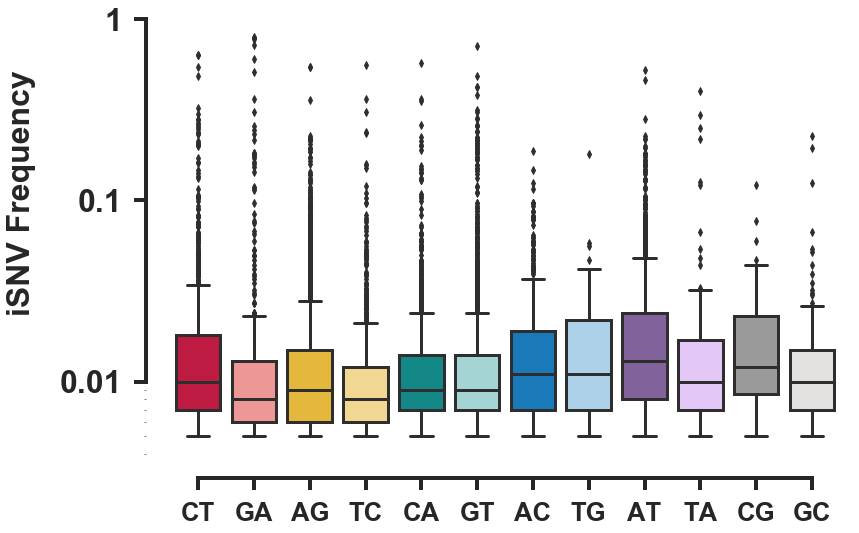

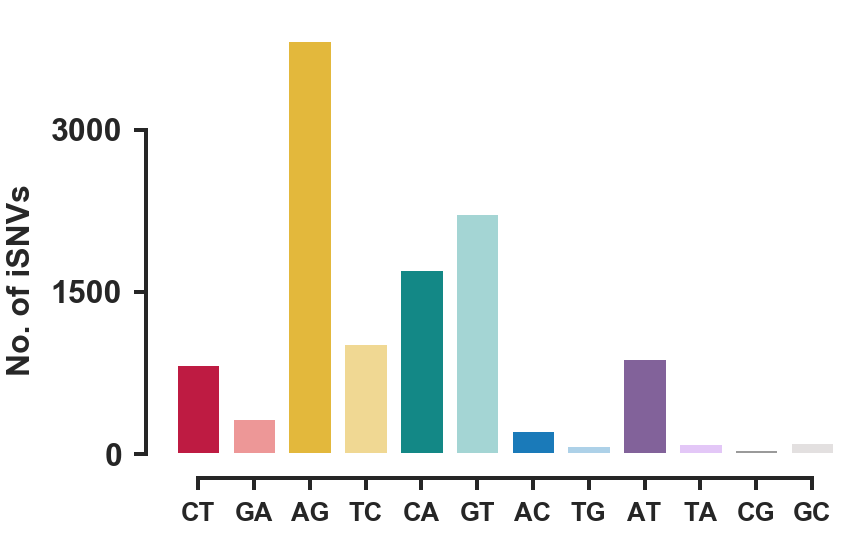

In [28]:
"""
Hyperedited Samples nucleotide distribution
"""

dfHyper = pd.DataFrame(index=["Position", "Reference", "Sub"], dtype=object)

nucFreq = {}

for region in ["China", "USA"]:
    df = pd.DataFrame()
    
    dfTemp = pd.read_csv("../output/REDItools2/regions/" + region + "/Frequencies.tsv", sep="\t").set_index(["Position", "Reference", "Sub"])
    dfTemp = dfTemp.iloc[:,:(len(dfTemp.columns) - noOfExtraColumnsEnd)]
    
    if df.empty:
        df = dfTemp
    else:
        df = pd.concat([df, dfTemp], axis=1)
    
    print(region, list(df.count()[stats.zscore(df.count()) > 3].index))
    
    if dfHyper.empty:
        dfHyper = df[list(df.count()[stats.zscore(df.count()) > 3].index)]
    else:
        dfHyper = pd.concat([df[list(df.count()[np.abs(stats.zscore(df.count())) > 3].index)], dfHyper], axis=1)
    
for cohort in cohorts:
    df = pd.DataFrame()
    
    for subCohort in cohorts[cohort]:
        dfTemp = pd.read_csv("../output/REDItools2/cohorts/" + subCohort + "/Frequencies.tsv", sep="\t").set_index(["Position", "Reference", "Sub"])
        dfTemp = dfTemp.iloc[:,:(len(dfTemp.columns) - noOfExtraColumnsEnd)]

        if df.empty:
            df = dfTemp
        else:
            df = pd.concat([df, dfTemp], axis=1)
    
    print(cohort, list(df.count()[stats.zscore(df.count()) > 3].index))
    
    if dfHyper.empty:
        dfHyper = df[list(df.count()[stats.zscore(df.count()) > 3].index)]
    else:
        dfHyper = pd.concat([df[list(df.count()[np.abs(stats.zscore(df.count())) > 3].index)], dfHyper], axis=1)

dfHyper = dfHyper.dropna(axis=0, how="all")
dfHyper = dfHyper.dropna(axis=1, how="all")
dfHyper.to_csv("../output/REDItools2/Hyperedited_Samples.tsv", index=True, sep="\t")

# Remove SNPs for plots
dfHyper = dfHyper[dfHyper <= cutoffFreq]

for index, row in dfHyper.iterrows():
    sub = index[2]
    if sub not in nucFreq:
        nucFreq[sub] = []
    nucFreq[sub].extend(list(row[row.notna()].values))
        
dfCount = pd.DataFrame(columns=["Sub", "Count"], dtype=object)
i = 0

for j in collections.Counter(list(dfHyper[dfHyper.count(axis=1) != 0].index.get_level_values("Sub"))):
    dfCount.loc[i] = [j, collections.Counter(list(dfHyper[dfHyper.count(axis=1) != 0].index.get_level_values("Sub")))[j]]
    i = i + 1
        
print(dfCount)

dfFreq = pd.DataFrame(columns=["Sub", "Freq"], dtype=object)
i = 0

for j in nucFreq:
    for k in nucFreq[j]:
        dfFreq.loc[i] = [j, k]
        i = i + 1

print("Medians: ", [(nuc, round(dfFreq[dfFreq["Sub"] == nuc].median()["Freq"], 3)) for nuc in nucChange])

fig, ax = plt.subplots(figsize=(12,8))
sns.boxplot(ax=ax, x="Sub", y="Freq", data=dfFreq, order=nucChange, palette=nucColors, linewidth=3)

ax.set_xlabel("")
ax.set_ylabel("iSNV Frequency\n", fontsize=labelSize)
ax.get_yaxis().set_label_coords(-0.15,0.6)

ax.set_yscale("log")
ax.set_ylim([0.004,1])
ax.set_yticks([0.01,0.1,1])
ax.set_yticklabels(["0.01","0.1","1"])

for axis in ["bottom","left"]:
    ax.spines[axis].set_linewidth(spineWidth)
ax.tick_params(labelsize=tickLabelSize, length=tickLength, width=tickWidth)
ax.tick_params(axis="x", labelsize=tickLabelSize*0.8)
sns.despine(trim=True, offset=axisOffset, ax=ax)

fig, ax = plt.subplots(figsize=(12,8))
sns.barplot(ax=ax, x="Sub", y="Count", data=dfCount, order=nucChange, palette=nucColors, linewidth=3)

ax.set_xlabel("")
ax.set_ylabel("No. of iSNVs\n", fontsize=labelSize)
ax.get_yaxis().set_label_coords(-0.15,0.4)

ax.set_yticks([0,1500,3000])
ax.set_yticklabels(["0","1500","3000"])

for axis in ["bottom","left"]:
    ax.spines[axis].set_linewidth(spineWidth)
ax.tick_params(labelsize=tickLabelSize, length=tickLength, width=tickWidth)
ax.tick_params(axis="x", labelsize=tickLabelSize*0.8)
sns.despine(trim=True, offset=axisOffset, ax=ax)

plt.show()


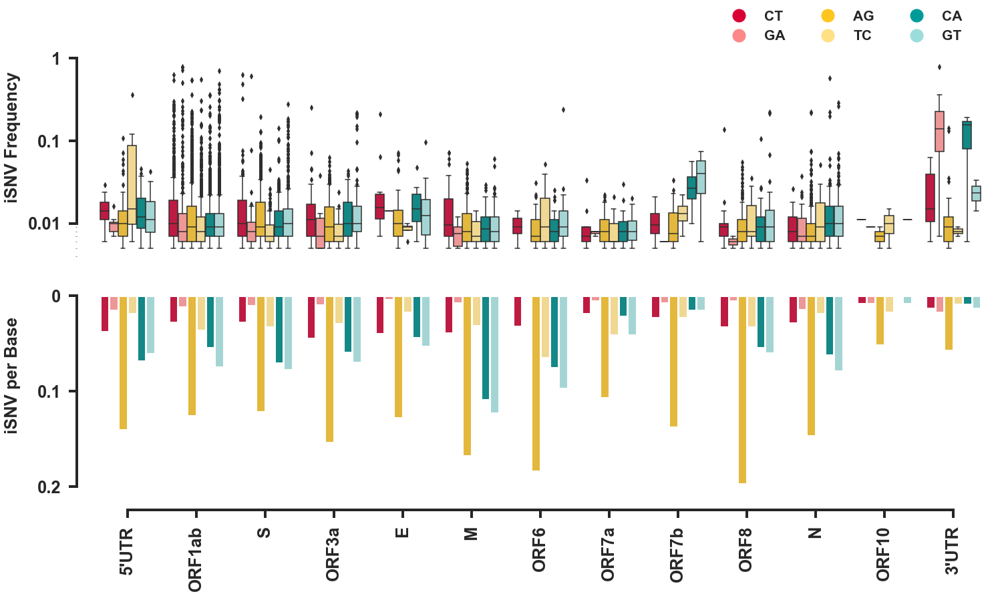

In [29]:
"""
Gene-wise APOBEC/ADAR distribution in Hyperedited Samples
"""

dfHyper = pd.read_csv("../output/REDItools2/Hyperedited_Samples.tsv", sep="\t").set_index(["Position", "Reference", "Sub"])
dfHyper = dfHyper[dfHyper <= cutoffFreq].reset_index()

geneNucFreqHyper = {}
geneNucCountHyper = {}

for index, row in dfHyper.iterrows():
    if row["Sub"] in nucChange[0:6]:
        for gene in SARSCoV2Genes:
            if (row["Position"] >= SARSCoV2Genes[gene][0]) and (row["Position"] <= SARSCoV2Genes[gene][1]):
                if gene not in geneNucFreqHyper:
                    geneNucFreqHyper[gene] = {}
                if row["Sub"] not in geneNucFreqHyper[gene]:
                    geneNucFreqHyper[gene][row["Sub"]] = []
                geneNucFreqHyper[gene][row["Sub"]].extend(list(row[3:][row[3:].notna()]))
                
                if gene not in geneNucCountHyper:
                    geneNucCountHyper[gene] = {}
                if row["Sub"] not in geneNucCountHyper[gene]:
                    geneNucCountHyper[gene][row["Sub"]] = 0
                geneNucCountHyper[gene][row["Sub"]] = geneNucCountHyper[gene][row["Sub"]] + 1
            
dfGenesFreqHyper = pd.DataFrame(columns=["Gene", "Sub", "Freq"], dtype=float)

i = 0
for gene in geneNucFreqHyper:
    for sub in geneNucFreqHyper[gene]:
        for freq in geneNucFreqHyper[gene][sub]:
            dfGenesFreqHyper.loc[i] = [gene, sub, freq]
            i = i + 1
            
for gene in geneNucCountHyper:
    for sub in geneNucCountHyper[gene]:
        geneNucCountHyper[gene][sub] = (float(geneNucCountHyper[gene][sub])/float(SARSCoV2Genes[gene][1]-SARSCoV2Genes[gene][0]))
        
dfGenesCountHyper = pd.DataFrame(columns=["Gene", "Sub", "Count"], dtype=float)

i = 0
for gene in geneNucCountHyper:
    for sub in geneNucCountHyper[gene]:
        dfGenesCountHyper.loc[i] = [gene, sub, geneNucCountHyper[gene][sub]]
        i = i + 1

fig, ax = plt.subplots(2, 1, figsize=(24,12), sharex=True)

sns.boxplot(ax=ax[0], x="Gene", y="Freq", hue="Sub", data=dfGenesFreqHyper, order=[j[0] for j in sorted(SARSCoV2Genes.items(), key=lambda i: i[1][0])], hue_order=nucChange[0:6], palette=nucColors[0:6])

ax[0].set_xlabel("")
ax[0].set_ylabel("iSNV Frequency\n", fontsize=labelSize*0.8)
ax[0].get_yaxis().set_label_coords(-0.06,0.6)

ax[0].set_yscale("log")
ax[0].set_ylim([0.004,1])
ax[0].set_yticks([0.01,0.1,1])
ax[0].set_yticklabels(["0.01","0.1","1"])

ax[0].spines["left"].set_linewidth(spineWidth)
ax[0].tick_params(bottom="off", labelsize=tickLabelSize*0.8, length=tickLength, width=tickWidth)
sns.despine(ax=ax[0], bottom=True, trim=True, offset=axisOffset)

ax[0].legend().remove()

sns.barplot(ax=ax[1], x="Gene", y="Count", hue="Sub", data=dfGenesCountHyper, order=[j[0] for j in sorted(SARSCoV2Genes.items(), key=lambda i: i[1][0])], hue_order=nucChange[0:6], palette=nucColors[0:6], linewidth=3)

ax[1].set_xlabel("")
ax[1].set_ylabel("iSNV per Base\n", fontsize=labelSize*0.8)

ax[1].set_yticks([0,0.1,0.2])
ax[1].set_yticklabels(["0","0.1","0.2"])
ax[1].get_yaxis().set_label_coords(-0.06,0.6)

for axis in ["bottom","left"]:
    ax[1].spines[axis].set_linewidth(spineWidth)
ax[1].tick_params(labelsize=tickLabelSize*0.8, length=tickLength, width=tickWidth)
sns.despine(ax=ax[1], trim=True, offset=axisOffset)

ax[1].tick_params(axis="x", rotation=90)

legend = plt.legend(title="", prop={"size": 24/1.5})
legend.get_frame().set_linewidth(0)

ax[1].invert_yaxis()

ax[1].legend().remove()

lines = [Line2D([0], [0], color="w", marker="o", markerfacecolor=color, markersize=tickLabelSize*0.66) for color in nucColors[0:6]]
legend = plt.legend(lines, nucChange[0:6], prop={"size": tickLabelSize*0.66}, ncol=3, loc=(0.7,2.25))
legend.get_frame().set_linewidth(0)

plt.show()


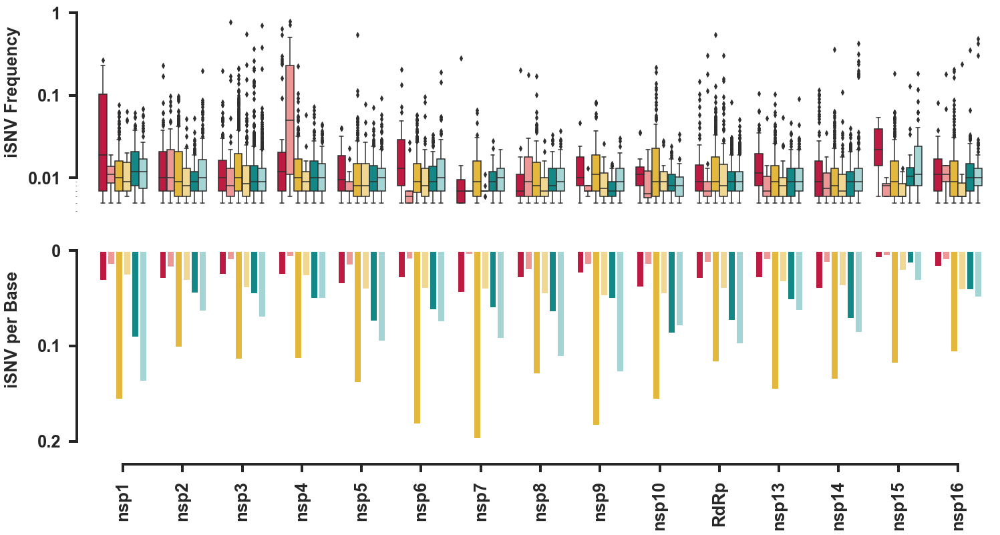

In [30]:
"""
Protein-wise APOBEC/ADAR distribution in Hyperedited Samples
"""

dfHyper = pd.read_csv("../output/REDItools2/Hyperedited_Samples.tsv", sep="\t").set_index(["Position", "Reference", "Sub"])
dfHyper = dfHyper[dfHyper <= cutoffFreq].reset_index()

proteinNucFreqHyper = {}
proteinNucCountHyper = {}

for index, row in dfHyper.iterrows():
    if row["Sub"] in nucChange[0:6]:
        for protein in SARSCoV2Proteins:
            if (row["Position"] >= SARSCoV2Proteins[protein][0]) and (row["Position"] <= SARSCoV2Proteins[protein][1]):
                if protein not in proteinNucFreqHyper:
                    proteinNucFreqHyper[protein] = {}
                if row["Sub"] not in proteinNucFreqHyper[protein]:
                    proteinNucFreqHyper[protein][row["Sub"]] = []
                proteinNucFreqHyper[protein][row["Sub"]].extend(list(row[3:][row[3:].notna()]))
                
                if protein not in proteinNucCountHyper:
                    proteinNucCountHyper[protein] = {}
                if row["Sub"] not in proteinNucCountHyper[protein]:
                    proteinNucCountHyper[protein][row["Sub"]] = 0
                proteinNucCountHyper[protein][row["Sub"]] = proteinNucCountHyper[protein][row["Sub"]] + 1
            
dfProteinsFreqHyper = pd.DataFrame(columns=["Protein", "Sub", "Freq"], dtype=float)

i = 0
for protein in proteinNucFreqHyper:
    for sub in proteinNucFreqHyper[protein]:
        for freq in proteinNucFreqHyper[protein][sub]:
            dfProteinsFreqHyper.loc[i] = [protein, sub, freq]
            i = i + 1
            
for protein in proteinNucCountHyper:
    for sub in proteinNucCountHyper[protein]:
        proteinNucCountHyper[protein][sub] = (float(proteinNucCountHyper[protein][sub])/float(SARSCoV2Proteins[protein][1]-SARSCoV2Proteins[protein][0]))
        
dfProteinsCountHyper = pd.DataFrame(columns=["Protein", "Sub", "Count"], dtype=float)

i = 0
for protein in proteinNucCountHyper:
    for sub in proteinNucCountHyper[protein]:
        dfProteinsCountHyper.loc[i] = [protein, sub, proteinNucCountHyper[protein][sub]]
        i = i + 1

fig, ax = plt.subplots(2, 1, figsize=(24,12), sharex=True)

sns.boxplot(ax=ax[0], x="Protein", y="Freq", hue="Sub", data=dfProteinsFreqHyper, order=[j[0] for j in sorted(SARSCoV2Proteins.items(), key=lambda i: i[1][0])[0:15]], hue_order=nucChange[0:6], palette=nucColors[0:6])

ax[0].set_xlabel("")
ax[0].set_ylabel("iSNV Frequency\n", fontsize=labelSize*0.8)
ax[0].get_yaxis().set_label_coords(-0.06,0.6)

ax[0].set_yscale("log")
ax[0].set_ylim([0.004,1])
ax[0].set_yticks([0.01,0.1,1])
ax[0].set_yticklabels(["0.01","0.1","1"])

ax[0].spines["left"].set_linewidth(spineWidth)
ax[0].tick_params(bottom="off", labelsize=tickLabelSize*0.8, length=tickLength, width=tickWidth)
sns.despine(ax=ax[0], bottom=True, trim=True, offset=axisOffset)

ax[0].legend().remove()

sns.barplot(ax=ax[1], x="Protein", y="Count", hue="Sub", data=dfProteinsCountHyper, order=[j[0] for j in sorted(SARSCoV2Proteins.items(), key=lambda i: i[1][0])[0:15]], hue_order=nucChange[0:6], palette=nucColors[0:6], linewidth=3)

ax[1].set_xlabel("")
ax[1].set_ylabel("iSNV per Base\n", fontsize=labelSize*0.8)

ax[1].set_yticks([0,0.1,0.2])
ax[1].set_yticklabels(["0","0.1","0.2"])
ax[1].get_yaxis().set_label_coords(-0.06,0.6)

for axis in ["bottom","left"]:
    ax[1].spines[axis].set_linewidth(spineWidth)
ax[1].tick_params(labelsize=tickLabelSize*0.8, length=tickLength, width=tickWidth)
sns.despine(ax=ax[1], trim=True, offset=axisOffset)

ax[1].tick_params(axis="x", rotation=90)

legend = plt.legend(title="", prop={"size": 24/1.5})
legend.get_frame().set_linewidth(0)

ax[1].invert_yaxis()

ax[1].legend().remove()

plt.show()


# ---------

('China', 45, 100)


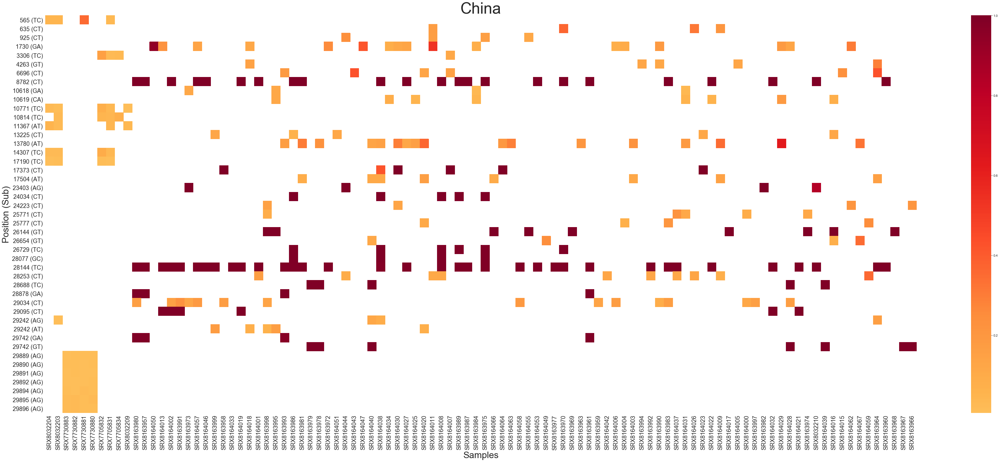

('India', 185, 411)


('USA', 103, 401)


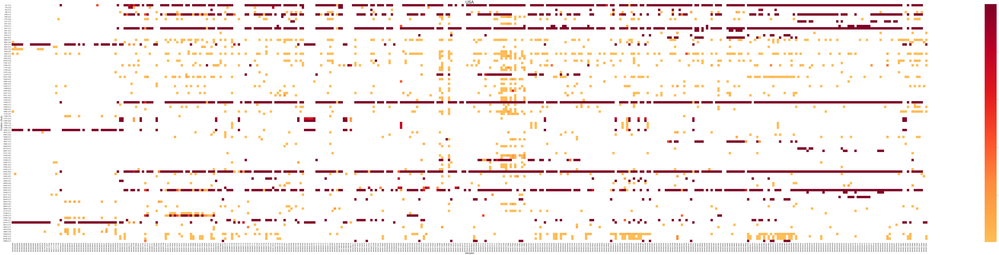

In [13]:
"""
Heatmap for Regions
"""

from datetime import datetime
import dateutil.parser
import json
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

countryTags = ["geo_loc_name", "geographic location (country and/or sea)", "country", "Country"]

for region in regions:
    samplesByDate = []
    
    df = pd.read_csv("../output/REDItools2/regions/" + region + "/Frequencies.tsv", sep="\t")
    df = df.set_index(["Position", "Sub"]).sort_values("Count", ascending = False)
    
    # Filter topPositions if greater than minTopPositions else filter minTopPositions
    df = df[df["Count"] >= df.head(len(df.head(int(len(df)*topPositions))) if len(df.head(int(len(df)*topPositions))) > minTopPositions else minTopPositions).tail(1)["Count"].values[0]].sort_index()
    df = df.iloc[:,1:(len(df.columns) - noOfExtraColumnsEnd)]
    df.drop(df.columns[df.isnull().all(0)], axis=1, inplace=True)
    df = df.sort_index(axis=1)

    if region != "India":
        samples = df.columns

        with open("../data/datasets/SRA/23052020_Illumina_paired.json", "r") as data:
            data = json.load(data)

            for exp in data["EXPERIMENT_PACKAGE_SET"]["EXPERIMENT_PACKAGE"]:
                if exp["EXPERIMENT"]["@accession"] in samples:
                    flag = 0
                    for tag in exp["SAMPLE"]["SAMPLE_ATTRIBUTES"]["SAMPLE_ATTRIBUTE"]:
                        if tag["TAG"] in countryTags:
                            if region in tag["VALUE"]:
                                flag = 1
                    if flag == 1:
                        for tag in exp["SAMPLE"]["SAMPLE_ATTRIBUTES"]["SAMPLE_ATTRIBUTE"]:
                            if tag["TAG"] == "collection_date":
                                samplesByDate.append({"sample": exp["EXPERIMENT"]["@accession"], "date": dateutil.parser.parse(tag["VALUE"]).strftime('%d/%m/%y')})

        samplesByDate = sorted(
            samplesByDate,
            key=lambda x: datetime.strptime(x["date"], "%d/%m/%y")
        )

        df = df[[i["sample"] for i in samplesByDate]]
    
    print(region, len(df), len(df.columns))

    try:
        fig, ax = plt.subplots(figsize=(0.6*len(df.columns),0.5*len(df)))
        ax = sns.heatmap(df, cmap="YlOrRd", yticklabels=[str(index[0]) + " (" + index[1] + ")" for index, row in df.iterrows()], center=0.25, annot=False)
        ax.set_title(region, fontsize=48)
        ax.set_xlabel("Samples")
        ax.set_ylabel("Position (Sub)")
        ax.xaxis.label.set_size(28)
        ax.yaxis.label.set_size(28)
        ax.tick_params(labelsize=18, bottom=False, left=False)

        plt.show()
    except:
        pass


('CCMB', 109, 165)


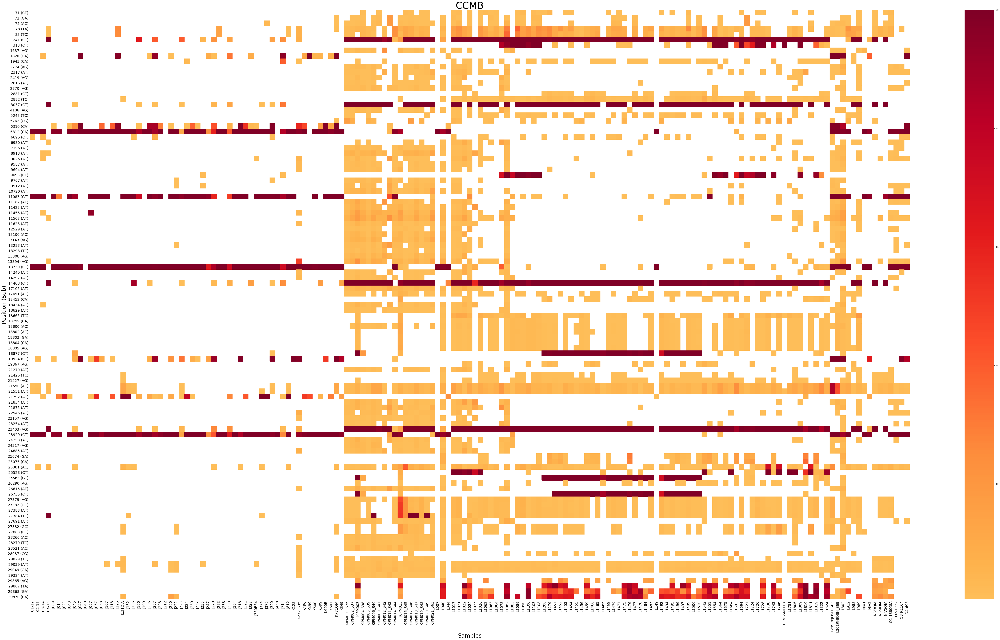

('Odisha', 75, 182)


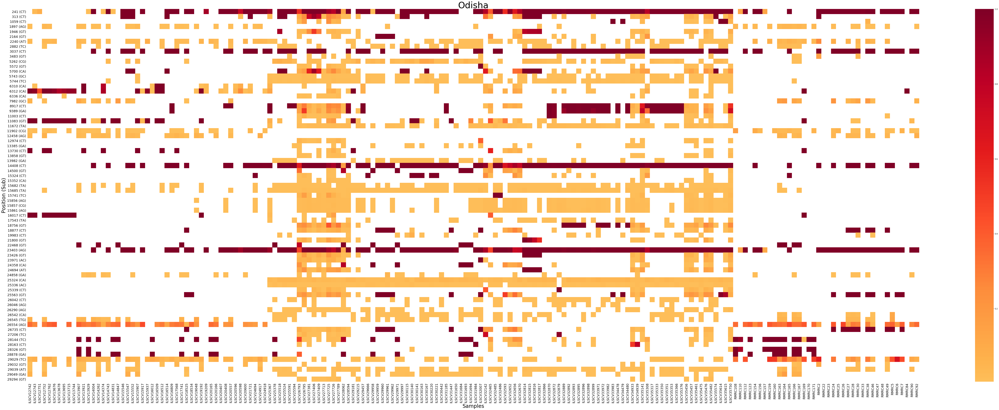

('MAX', 35, 42)


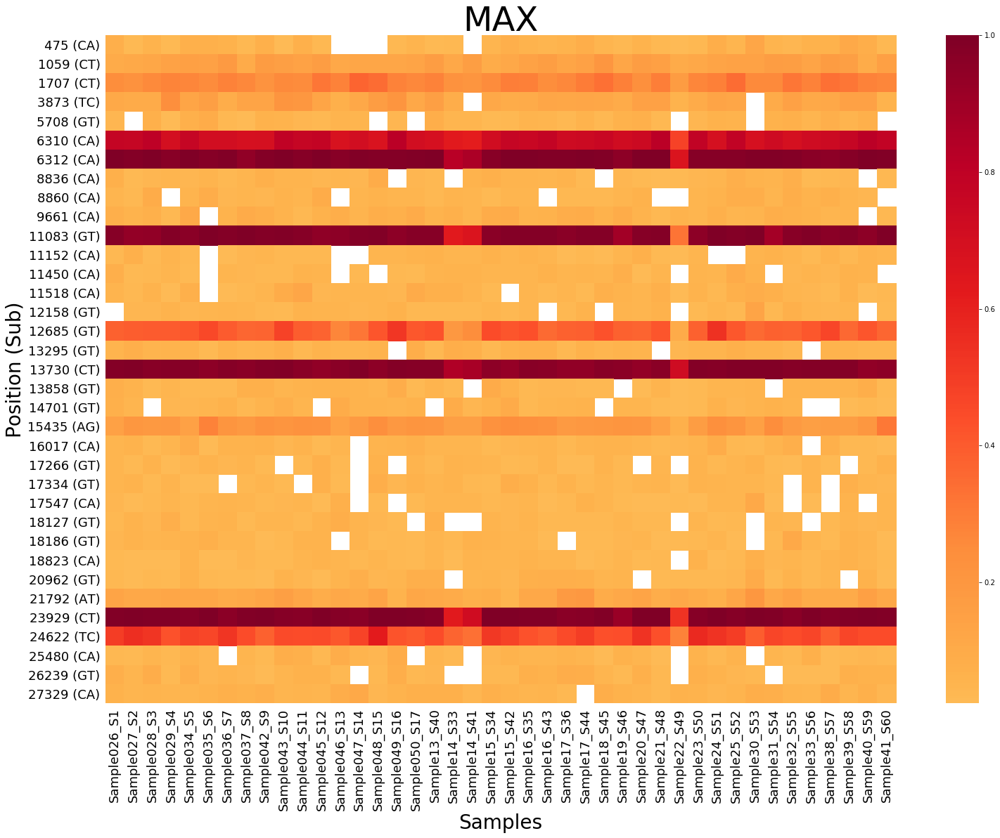

('NCDC-MiSeq', 24, 7)


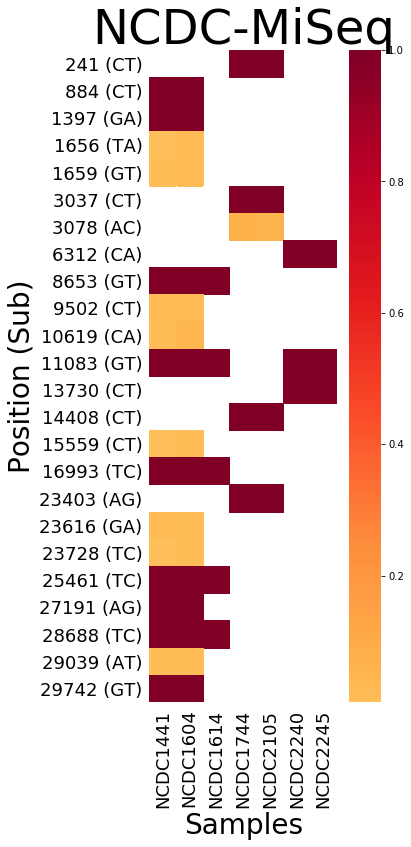

('NCDC-NextSeq-20200527', 31, 16)


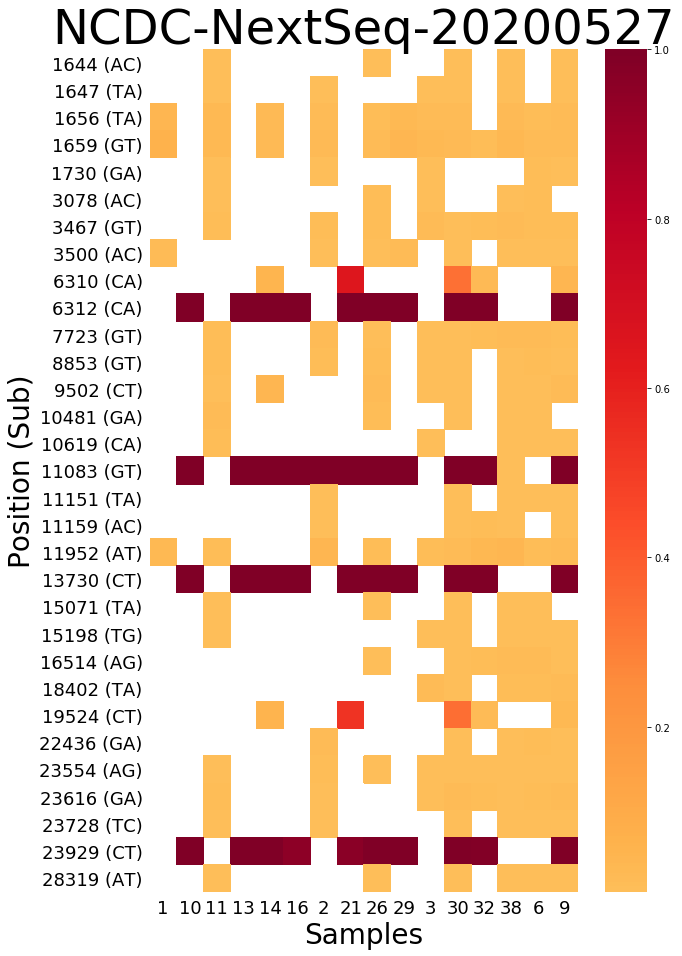

In [122]:
"""
Heatmap for Indian Cohorts
"""

from datetime import datetime
import dateutil.parser
import json
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

for cohort in cohortsAll:
    df = pd.read_csv("../output/REDItools2/cohorts/" + cohort + "/Frequencies.tsv", sep="\t")
    df = df.set_index(["Position", "Sub"]).sort_values("Count", ascending = False)
    
    # Filter topPositions if greater than minTopPositions else filter minTopPositions
    df = df[df["Count"] >= df.head(len(df.head(int(len(df)*topPositions))) if len(df.head(int(len(df)*topPositions))) > minTopPositions else minTopPositions).tail(1)["Count"].values[0]].sort_index()
    df = df.iloc[:,1:(len(df.columns) - noOfExtraColumnsEnd)]
    df.drop(df.columns[df.isnull().all(0)], axis=1, inplace=True)
    df = df.sort_index(axis=1)
    
    print(cohort, len(df), len(df.columns))

    fig, ax = plt.subplots(figsize=(0.6*len(df.columns),0.5*len(df)))
    ax = sns.heatmap(df, cmap="YlOrRd", yticklabels=[str(index[0]) + " (" + index[1] + ")" for index, row in df.iterrows()], center=0.25, annot=False)
    ax.set_title(cohort, fontsize=48)
    ax.set_xlabel("Samples")
    ax.set_ylabel("Position (Sub)")
    ax.xaxis.label.set_size(28)
    ax.yaxis.label.set_size(28)
    ax.tick_params(labelsize=18, bottom=False, left=False)

    plt.show()


('PRJNA655577', 60, 615)


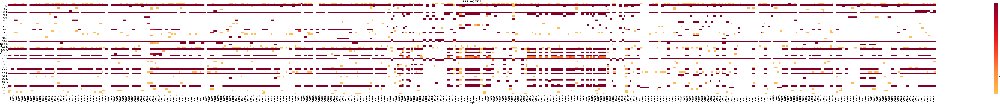

In [3]:
"""
Heatmap for PRJNA655577
"""

from datetime import datetime
import dateutil.parser
import json
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

samplesByReplicate = []

df = pd.read_csv("../output/REDItools2/cohorts/PRJNA655577/Frequencies.tsv", sep="\t")
df = df.set_index(["Position", "Sub"]).sort_values("Count", ascending = False)
    
# Filter topPositions if greater than minTopPositions else filter minTopPositions
df = df[df["Count"] >= df.head(len(df.head(int(len(df)*topPositions))) if len(df.head(int(len(df)*topPositions))) > minTopPositions else minTopPositions).tail(1)["Count"].values[0]].sort_index()
df = df.iloc[:,1:(len(df.columns) - noOfExtraColumnsEnd)]
df.drop(df.columns[df.isnull().all(0)], axis=1, inplace=True)
df = df.sort_index(axis=1)

samples = df.columns

with open("../data/datasets/SRA/20200818_PRJNA655577.json", "r") as data:
    data = json.load(data)
    
    for exp in data["EXPERIMENT_PACKAGE_SET"]["EXPERIMENT_PACKAGE"]:
        if exp["EXPERIMENT"]["@accession"] in samples:
            for tag in exp["SAMPLE"]["SAMPLE_ATTRIBUTES"]["SAMPLE_ATTRIBUTE"]:
                if tag["TAG"] == "Replicate":
                    samplesByReplicate.append({"sample": exp["EXPERIMENT"]["@accession"], "replicate": tag["VALUE"]})
    
samplesByReplicate = sorted(
    samplesByReplicate,
    key=lambda x: x["replicate"]
)

df = df[[i["sample"] for i in samplesByReplicate]]
# print([key["replicate"] for key in samplesByReplicate])
# print(df.columns)
print("PRJNA655577", len(df), len(df.columns))

fig, ax = plt.subplots(figsize=(0.6*len(df.columns),0.5*len(df)))
ax = sns.heatmap(df, cmap="YlOrRd", yticklabels=[str(index[0]) + " (" + index[1] + ")" for index, row in df.iterrows()], center=0.25, annot=False)
ax.set_title("PRJNA655577", fontsize=48)
ax.set_xlabel("Samples")
ax.set_ylabel("Position (Sub)")
ax.xaxis.label.set_size(28)
ax.yaxis.label.set_size(28)
ax.tick_params(labelsize=18, bottom=False, left=False)

i = 0
flag = 1
for label in ax.get_xticklabels():
    i = i + 1
    if i%2 == 1:
        flag = flag * (-1)
    if flag == -1:
        label.set_weight("bold")

plt.show()


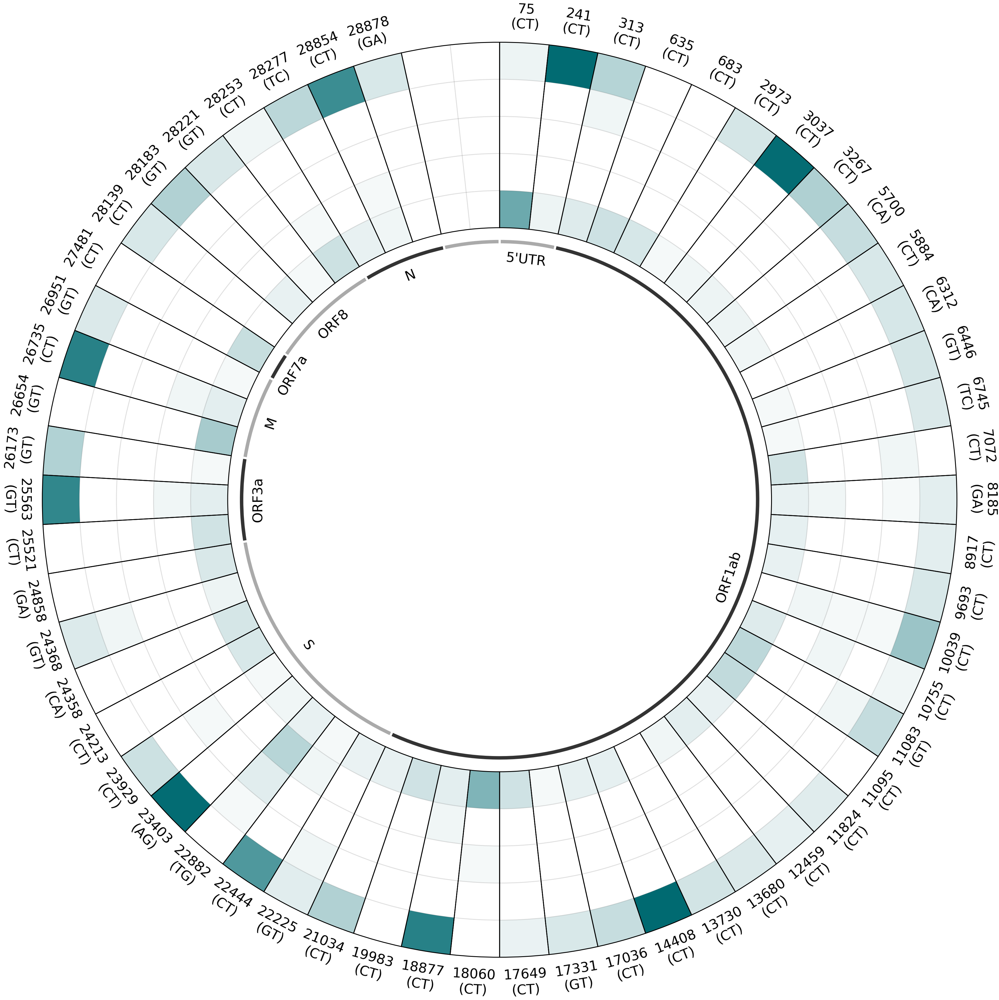

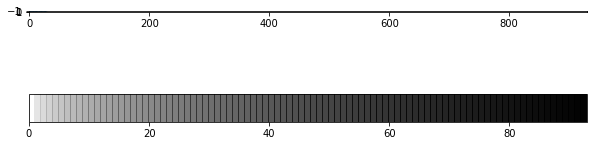

In [27]:
"""
Radial heatmap for PRJNA655577
"""

import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import seaborn as sns
import numpy as np
import math
from collections import OrderedDict

PRJNA655577Color = "#006A71"

df = pd.read_csv("../output/REDItools2/cohorts/PRJNA655577/Frequencies.tsv", sep="\t")
df = df.sort_values("Count", ascending = False)
    
# Filter topPositions if greater than minTopPositions else filter minTopPositions
df = df[df["Count"] >= df.head(len(df.head(int(len(df)*topPositions))) if len(df.head(int(len(df)*topPositions))) > minTopPositions else minTopPositions).tail(1)["Count"].values[0]].sort_index()
df = df.iloc[:,:(len(df.columns) - noOfExtraColumnsEnd)]
df.drop(df.columns[df.isnull().all(0)], axis=1, inplace=True)

# Calculate and add bins
cohortColLen = len(df.columns)
for i in range(0, len(bins)-1):
    df[round((bins[i] + bins[i+1])/2, 1)] = ((df.iloc[:,3:cohortColLen][(df.iloc[:,3:cohortColLen] > bins[i]) & (df.iloc[:,3:cohortColLen] <= bins[i+1])].count(axis=1)/len(df.iloc[:,3:cohortColLen].columns))*100)

# Reshape dataframe
df = df.iloc[:,np.r_[0, 2, -(len(bins)-1):0]]
df = pd.melt(df, id_vars=["Position", "Sub"], var_name="Freq", value_name="SamplePercent")
df["Cohort"] = "PRJNA655577"

# Filter positions and generate consensus dataframe
impPos = [75,241,313,635,683,2973,3037,3267,5700,5884,6312,6446,6745,7072,8185,8917,9693,10039,10755,11083,11095,11824,12459,13680,13730,14408,17036,17331,17649,18060,18877,19983,21034,22225,22444,22882,23403,23929,24213,24358,24368,24858,25521,25563,26173,26654,26735,26951,27481,28139,28183,28221,28253,28277,28854,28878]
dfImp = df[df["Position"].isin(impPos)]

# Plot
fig, ax = plt.subplots(figsize=(4,4))
ax.axis("equal")

for i in range(len(bins)-1):
    binVal = round((bins[i] + bins[i+1])/2, 1)
    dfTemp = []
    
    for j in impPos:
        dfTemp.append(dfImp.loc[(dfImp["Freq"] == binVal) & (dfImp["Position"] == j), :])
    dfTemp = pd.concat(dfTemp)

    wedges, texts = ax.pie([1]*(len(dfTemp)+2), radius=pltSize-((len(bins)-i-1)*wedgeSize), counterclock=False, startangle=-270,
            colors=[PRJNA655577Color + hex(int(((row["SamplePercent"]/max(dfImp["SamplePercent"]))**(1.0/colorBarFactor))*255))[-2:] if len(hex(int(((row["SamplePercent"]/max(dfImp["SamplePercent"]))**(1.0/colorBarFactor))*255))) == 4 else PRJNA655577Color + "0" + hex(int(((row["SamplePercent"]/max(dfImp["SamplePercent"]))**(1.0/colorBarFactor))*255))[-1:] for index, row in dfTemp.iterrows()] + ["#FFFFFF00","#FFFFFF00"],
            wedgeprops=dict(width=wedgeSize, edgecolor="#00000011", linewidth=wedgeSize*2)
          )

# Position Labels
wedges, texts = ax.pie([dfImp.loc[dfImp["Freq"] == round((bins[0] + bins[1])/2, 1),"Position"].values.tolist().count(i) for i in impPos]+[2],
        radius=pltSize-wedgeSize, counterclock=False, startangle=-270,
        labels=[str(index[0]) + "\n(" + index[1] + ")" for index, row in dfImp.groupby(["Position", "Sub"]).size().iteritems()]+[""],
        labeldistance=1.025, rotatelabels=True,
        colors=["#FFFFFF00"],
        wedgeprops=dict(width=wedgeSize*(len(bins)-1), edgecolor="black", linewidth=wedgeSize*2),
        textprops=dict(rotation_mode="anchor", ha="center", va="center")
      )

for t in texts:
    rotation = t.get_rotation()
    t.set_rotation(rotation+90+(1-rotation//180)*180)
    t.set_fontsize(48)
    
# Gene Labels
wedges, texts = ax.pie([[i for j in [a for a,f in zip([i for i in impPos], [dfImp.loc[dfImp["Freq"] == round((bins[0] + bins[1])/2, 1),"Position"].values.tolist().count(i) for i in impPos]) for _ in range(f)] for i in SARSCoV2Genes if (j>=SARSCoV2Genes[i][0]) and (j<=SARSCoV2Genes[i][1])].count(k) for k in list(OrderedDict.fromkeys([i for j in [a for a,f in zip([i for i in impPos], [dfImp.loc[dfImp["Freq"] == round((bins[0] + bins[1])/2, 1),"Position"].values.tolist().count(i) for i in impPos]) for _ in range(f)] for i in SARSCoV2Genes if (j>=SARSCoV2Genes[i][0]) and (j<=SARSCoV2Genes[i][1])]))]+[2],
        radius=pltSize-(6.3*wedgeSize), counterclock=False, startangle=-270,
        labels=list(OrderedDict.fromkeys([i for j in [a for a,f in zip([i for i in impPos], [dfImp.loc[dfImp["Freq"] == round((bins[0] + bins[1])/2, 1),"Position"].values.tolist().count(i) for i in impPos]) for _ in range(f)] for i in SARSCoV2Genes if (j>=SARSCoV2Genes[i][0]) and (j<=SARSCoV2Genes[i][1])]))+[""],
        labeldistance=0.9, rotatelabels=True,
        colors=["#AAAAAA", "#333333"],
        wedgeprops=dict(width=wedgeSize*.15, edgecolor="white", linewidth=wedgeSize*5),
        textprops=dict(rotation_mode="anchor", ha="center", va="center")
      )

for t in texts:
    rotation = t.get_rotation()
    t.set_rotation(rotation+90+(1-rotation//180)*180)
    t.set_fontsize(48)

plt.show()

# Color Bar
fig, ax = plt.subplots(figsize=(10,10))

colorBar = ["#000000" + hex(int(((i/max(dfImp["SamplePercent"]))**(1.0/colorBarFactor))*255))[-2:] if len(hex(int(((i/max(dfImp["SamplePercent"]))**(1.0/colorBarFactor))*255))) == 4 else "#000000" + "0" + hex(int(((i/max(dfImp["SamplePercent"]))**(1.0/colorBarFactor))*255))[-1:] for i in np.arange(0,int(max(dfImp["SamplePercent"]))+1,1)]
cm = LinearSegmentedColormap.from_list(np.arange(0,int(max(dfImp["SamplePercent"])),1), colorBar, N=len(np.arange(0,int(max(dfImp["SamplePercent"])),1)))

img = plt.imshow(np.array([np.arange(0,int(max(dfImp["SamplePercent"])),.1)]), cmap=cm)
img.set_visible(False)

plt.colorbar(orientation="horizontal")
plt.plot(np.random.rand(30))
plt.show()


In [ ]:
"""
Bubble plot for Regions
"""

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import math

df = {}

for region in regions:
    df[region] = pd.read_csv("../output/REDItools2/Regions/" + region + "/Frequencies.tsv", sep="\t")
    df[region] = df[region].sort_values("Count", ascending = False).head(topPositions).sort_index()
    df[region] = df[region].iloc[:,:(len(df[region].columns) - noOfExtraColumnsEnd)]
    df[region].drop(df[region].columns[df[region].isnull().all(0)], axis=1, inplace=True)

    # Calculate and add bins
    regionColLen = len(df[region].columns)
    for i in range(0, len(bins)-1):
        df[region][(bins[i] + bins[i+1])/2] = ((df[region].iloc[:,3:regionColLen][(df[region].iloc[:,3:regionColLen] > bins[i]) & (df[region].iloc[:,3:regionColLen] <= bins[i+1])].count(axis=1)/len(df[region].iloc[:,3:regionColLen].columns))*100).round()
    
    # Reshape dataframe
    df[region] = df[region].iloc[:,np.r_[0, 2, -(len(bins)-1):0]]
    df[region] = pd.melt(df[region], id_vars=["Position", "Sub"], var_name="Freq", value_name="SamplePercent")
    df[region]["Region"] = region

# Filter positions and generate consensus dataframe
# impPos = sorted(set.intersection(*[set(list) for list in [df[region]["Position"].values for region in regions]]))
impPos = [241, 565, 925, 1059, 1707, 1730, 3037, 6309, 6696, 9502, 13225, 13730, 14408, 15435, 18803, 18877, 23403, 23929, 26554, 26735, 27384, 28253, 29029, 29049, 29187, 29188, 29868]
dfImp = pd.concat([df[region][df[region]["Position"].isin(impPos)] for region in regions])
dfImp.loc[:,"RegionShift"] = dfImp["Position"]

# Plot
fig, ax = plt.subplots(len(impPos), 1, figsize=(15, 1.25*len(regions)*len(impPos)))
i = 0

for j in impPos:
    data = dfImp[dfImp["Position"] == j]
    sub = sorted(set(data["Sub"]))
    
    regionShift = sorted(range(1-len(set(data["Region"])), len(set(data["Region"])), 2), reverse=True)
    for k in range(0, len(data["Region"].unique())):
        data.loc[data["Region"] == data["Region"].unique()[k], "RegionShift"] = data.loc[data["Region"] == data["Region"].unique()[k], "RegionShift"] + regionShift[k]*regionShiftFactor
    
    if len(sub) == 1:
        dotSizes = sorted(set(int((math.sqrt(i)*dotSizeFactor)) if i!= 0 else 0 for i in set(dfImp[dfImp["Position"] == j]["SamplePercent"])))
        sns.scatterplot(ax=ax[i], data=data, x="Freq", y="RegionShift", size="SamplePercent", hue="Region", hue_order=regions, palette=paletteRegions, sizes=dotSizes, legend=False, edgecolor="#555555", linewidth=1)

        ax[i].set_ylim([j + (min(regionShift)*regionShiftFactor) - (1.15*dotSizeFactor), j + (max(regionShift)*regionShiftFactor) + (1.15*dotSizeFactor)])
        ax[i].set_xticks(bins)
        ax[i].set_yticks([j])
        ax[i].set_yticklabels([str(j) + " (" + sub[0] + ") "])
        ax[i].tick_params(length=16, width=2, labelsize=36, left=False)
        ax[i].spines["bottom"].set_linewidth(2)
        ax[i].set_xlabel("")
        ax[i].set_ylabel("")

        if i != (len(impPos)-1):
            ax[i].set_xticklabels([])
            ax[i].tick_params(bottom=False)
            sns.despine(ax=ax[i], trim=True, left=True, bottom=True)
        else:
            sns.despine(ax=ax[i], trim=True, left=True, offset={"bottom": 25})

        if i%2 == 0:
            ax[i].set_facecolor("#EFEFEF")

        i = i + 1
    else:
        print(str(j) + ": Different subs")

fig.text(0.5, .1, "Read Frequency of Alternate Allele", ha="center", fontsize=42)
fig.text(-0.15, 0.5, "Nucleotide Position (Change)", va="center", rotation="vertical", fontsize=42)
plt.subplots_adjust(wspace=0, hspace=0)
plt.show()


In [ ]:
"""
Bubble plot for Indian Cohorts
"""

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import math

df = {}

for cohort in cohorts:
    df[cohort] = pd.read_csv("../output/REDItools2/Cohorts/" + cohort + "/Frequencies.tsv", sep="\t")
    df[cohort] = df[cohort].sort_values("Count", ascending = False).head(topPositions).sort_index()
    df[cohort] = df[cohort].iloc[:,:(len(df[cohort].columns) - noOfExtraColumnsEnd)]
    df[cohort].drop(df[cohort].columns[df[cohort].isnull().all(0)], axis=1, inplace=True)

    # Calculate and add bins
    cohortColLen = len(df[cohort].columns)
    for i in range(0, len(bins)-1):
        df[cohort][(bins[i] + bins[i+1])/2] = ((df[cohort].iloc[:,3:cohortColLen][(df[cohort].iloc[:,3:cohortColLen] > bins[i]) & (df[cohort].iloc[:,3:cohortColLen] <= bins[i+1])].count(axis=1)/len(df[cohort].iloc[:,3:cohortColLen].columns))*100).round()
    
    # Reshape dataframe
    df[cohort] = df[cohort].iloc[:,np.r_[0, 2, -(len(bins)-1):0]]
    df[cohort] = pd.melt(df[cohort], id_vars=["Position", "Sub"], var_name="Freq", value_name="SamplePercent")
    df[cohort]["Cohort"] = cohort

# Filter positions and generate consensus dataframe
# impPos = sorted(set.intersection(*[set(list) for list in [df[cohort]["Position"].values for cohort in cohorts]])) + [26554, 29029, 13394, 23929, 27384]
impPos = [241, 313, 1059, 1707, 3037, 13730, 14408, 15435, 18803, 18877, 23403, 23929, 26554, 26735, 27384, 29029, 29049, 29868]
dfImp = pd.concat([df[cohort][df[cohort]["Position"].isin(impPos)] for cohort in cohorts])
dfImp.loc[:,"CohortShift"] = dfImp["Position"]

# Plot
fig, ax = plt.subplots(len(impPos), 1, figsize=(15, 1.25*len(cohorts)*len(impPos)))
i = 0

for j in impPos:
    data = dfImp[dfImp["Position"] == j]
    sub = sorted(set(data["Sub"]))
    
    cohortShift = sorted(range(1-len(set(data["Cohort"])), len(set(data["Cohort"])), 2), reverse=True)
    for k in range(0, len(data["Cohort"].unique())):
        data.loc[data["Cohort"] == data["Cohort"].unique()[k], "CohortShift"] = data.loc[data["Cohort"] == data["Cohort"].unique()[k], "CohortShift"] + cohortShift[k]*cohortShiftFactor
    
    if len(sub) == 1:
        dotSizes = sorted(set(int((math.sqrt(i)*dotSizeFactor)) if i!= 0 else 0 for i in set(dfImp[dfImp["Position"] == j]["SamplePercent"])))
        sns.scatterplot(ax=ax[i], data=data, x="Freq", y="CohortShift", size="SamplePercent", hue="Cohort", hue_order=cohorts, palette=paletteCohorts, sizes=dotSizes, legend=False, edgecolor="#555555", linewidth=1)

        ax[i].set_ylim([j + (min(cohortShift)*cohortShiftFactor) - (1.15*dotSizeFactor), j + (max(cohortShift)*cohortShiftFactor) + (1.15*dotSizeFactor)])
        ax[i].set_xticks(bins)
        ax[i].set_yticks([j])
        ax[i].set_yticklabels([str(j) + " (" + sub[0] + ") "])
        ax[i].tick_params(length=16, width=2, labelsize=36, left=False)
        ax[i].spines["bottom"].set_linewidth(2)
        ax[i].set_xlabel("")
        ax[i].set_ylabel("")

        if i != (len(impPos)-1):
            ax[i].set_xticklabels([])
            ax[i].tick_params(bottom=False)
            sns.despine(ax=ax[i], trim=True, left=True, bottom=True)
        else:
            sns.despine(ax=ax[i], trim=True, left=True, offset={"bottom": 25})

        if i%2 == 0:
            ax[i].set_facecolor("#EFEFEF")

        i = i + 1
    else:
        print(str(j) + ": Different subs")

fig.text(0.5, .09, "Read Frequency of Alternate Allele", ha="center", fontsize=42)
fig.text(-0.125, 0.5, "Nucleotide Position (Change)", va="center", rotation="vertical", fontsize=42)
plt.subplots_adjust(wspace=0, hspace=0)
plt.show()


In [42]:
import json
import geopandas
import matplotlib.pyplot as plt
from datetime import datetime

confirmed = {}
recovered = {}
deceased = {}
mortalityRate = {}

with open("../data/datasets/COVID19IndiaOrg_States_Daily.json") as covid19india:
    covid19india = json.load(covid19india)["states_daily"]
    
    lastDateConfirmed = None
    lastDateRecovered = None
    lastDateDeceased = None
    
    for key in covid19india:
        if key["status"] == "Confirmed":
            for state in key:
                if state != "status" and state != "date":
                    if key["date"] not in confirmed:
                        confirmed[key["date"]] = {}
                    if lastDateConfirmed:
                        confirmed[key["date"]][state] = int(key[state]) + int(lastDateConfirmed[state])
                    else:
                        confirmed[key["date"]][state] = int(key[state])
            lastDateConfirmed = confirmed[key["date"]]
        if key["status"] == "Recovered":
            for state in key:
                if state != "status" and state != "date":
                    if key["date"] not in recovered:
                        recovered[key["date"]] = {}
                    if lastDateRecovered:
                        recovered[key["date"]][state] = int(key[state]) + int(lastDateRecovered[state])
                    else:
                        recovered[key["date"]][state] = int(key[state])
            lastDateRecovered = recovered[key["date"]]
        if key["status"] == "Deceased":
            for state in key:
                if state != "status" and state != "date":
                    if key["date"] not in deceased:
                        deceased[key["date"]] = {}
                    if lastDateDeceased:
                        deceased[key["date"]][state] = int(key[state]) + int(lastDateDeceased[state])
                    else:
                        deceased[key["date"]][state] = int(key[state])
            lastDateDeceased = deceased[key["date"]]

plt.ioff()

mapIndia = "../visualization/assets/IGISMAP/Indian_States.shp"
dfMap = geopandas.read_file(mapIndia)

for date in confirmed:
    mortalityRate[date] = {}
    
    for state in confirmed[date]:
        if state != "jk" and state != "la":
            try:
                mortalityRate[date][state] = round(((float(deceased[date][state])/float(confirmed[date][state]))*100),2)
            except ZeroDivisionError:
                mortalityRate[date][state] = 0.0
        else:
            try:
                mortalityRate[date]["jk"] = round((((float(deceased[date]["jk"]) + float(deceased[date]["la"]))/(float(confirmed[date]["jk"]) + float(confirmed[date]["la"])))*100),2)
            except ZeroDivisionError:
                mortalityRate[date]["jk"] = 0.0

    fig, ax = plt.subplots(figsize=(8, 8))
    
    for state in stateMap:
        dfMap.loc[dfMap["st_nm"] == stateMap[state], "Mortality Rate"] = mortalityRate[date][state]

    dfMap.plot(ax=ax, column="Mortality Rate", vmax=20, cmap="Reds", linewidth=0.75, edgecolor="#00000077", legend=True)
    ax.set_title(date, fontdict={"fontsize": "20"})
    ax.axis("off")

    fig.savefig("../visualization/Mortality-Rate/" + str(datetime.strptime(date.split("-")[1], "%b").month) + "-" + str(date.split("-")[0]) + ".png")
    plt.close(fig)